## Chunk 39

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from imblearn.over_sampling import ADASYN
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd

pd.set_option("display.max_columns", 100)

In [4]:
data_w_triggers = pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/pdata_w_triggers.csv")

In [5]:
data_wo_triggers_train = pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/data_wo_triggers_train.csv")
data_wo_triggers_test = pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/data_wo_triggers_test.csv")

In [6]:
indexes = pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/TrainingIndex_list.csv")

In [7]:
indexes

,X51663L,X57870L,X2986L,X29925L,X95246L,X103065L,X68293L,X62555L,X45404L,X65161L,X46435L,X104474L,X9642L,X59134L,X52132L,X96849L,X14183L,X15180L,X27168L,X89709L,X9097L,X30538L,X56219L,X94517L,X7989L,X13536L,X90077L,X6216L,X83519L,X29394L,X53241L,X28825L,X106773L,X41L,X14426L,X105695L,X72820L,X51656L,X94038L,X58527L,X77009L,X108338L,X43042L,X77837L,X6134L,X33523L,X21812L,X39895L,X9640L,X85278L,...,X100483L,X100936L,X2033L,X92460L,X107627L,X60422L,X74214L,X11863L,X91037L,X79409L,X1267L,X47377L,X6618L,X28345L,X32792L,X18962L,X73914L,X84288L,X93195L,X108818L,X63994L,X63569L,X50446L,X53298L,X53175L,X51773L,X99444L,X24771L,X99903L,X3274L,X79899L,X88636L,X51366L,X36391L,X81922L,X96034L,X6591L,X36485L,X68180L,X8400L,X53617L,X41583L,X32339L,X20807L,X35329L,X21702L,X8802L,X8382L,X25809L,X93470L
0,51663,57870,2986,29925,95246,103065,68293,62555,45404,65161,46435,104474,9642,59134,52132,96849,14183,15180,27168,89709,9097,30538,56219,94517,7989,13536,90077,6216,83519,29394,53241,28825,106773,41,14426,105695,72820,51656,94038,58527,77009,108338,43042,77837,6134,33523,21812,39895,9640,85278,...,100483,100936,2033,92460,107627,60422,74214,11863,91037,79409,1267,47377,6618,28345,32792,18962,73914,84288,93195,108818,63994,63569,50446,53298,53175,51773,99444,24771,99903,3274,79899,88636,51366,36391,81922,96034,6591,36485,68180,8400,53617,41583,32339,20807,35329,21702,8802,8382,25809,93470


In [8]:
myindx=indexes.iloc[0].tolist()

In [9]:
myindx1=[i-1 for i in myindx]


## Chunk 40

In [10]:
# data_w_triggers_train = data_w_triggers.iloc[myindx1]                 #  Now i have took the training data from the Data Frame

In [11]:
data_w_triggers_train = data_w_triggers.iloc[myindx1]
data_w_triggers_test= data_w_triggers.iloc[~data_w_triggers.index.isin(myindx1)]

### Done dividing the Training and Testing data

![image.png](attachment:image.png)

In [12]:
 #Showing only two columns
print(data_w_triggers_train['claim_duration_days'].max())
# Training data
print(data_w_triggers_train)

0.0017249334516415
       birth_date  no_of_days_stayed  medical_service_provider_idHOSP3P10675  \
51662    0.000149           0.000021                                       0   
57869    0.000220           0.000206                                       0   
2985     0.000241           0.000007                                       0   
29924    0.000327           0.000007                                       0   
95245    0.000248           0.000057                                       0   
...           ...                ...                                     ...   
21701    0.000625           0.000014                                       0   
8801     0.000220           0.000007                                       0   
8381     0.000234           0.000007                                       0   
25808    0.000334           0.000043                                       0   
93469    0.000426           0.000043                                       0   

       medical_servi

In [13]:
data_w_triggers_train.shape[1]

40

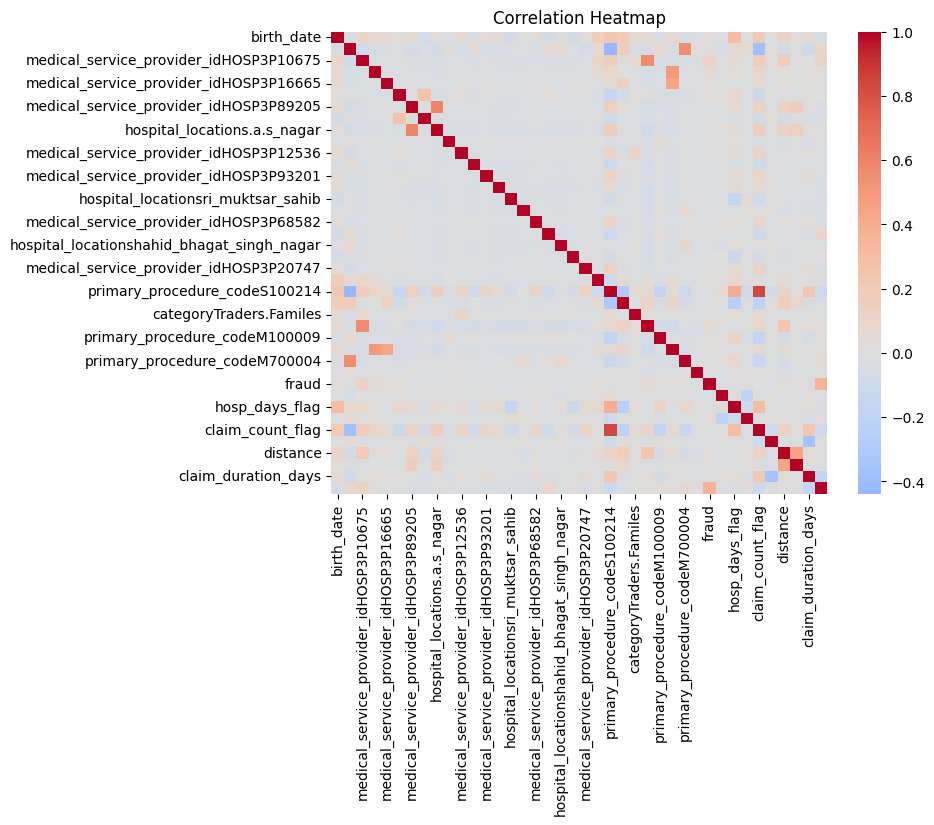

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
correlation_matrix = data_w_triggers_train.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()


In [15]:
data_w_triggers_test                                 # Testing data

,birth_date,no_of_days_stayed,medical_service_provider_idHOSP3P10675,medical_service_provider_idHOSP3P53909,medical_service_provider_idHOSP3P16665,primary_procedure_codeM100068,medical_service_provider_idHOSP3P89205,medical_service_provider_idHOSP3G59614,hospital_locations.a.s_nagar,medical_service_provider_idHOSP3G81986,medical_service_provider_idHOSP3P12536,hospital_locationbarnala,medical_service_provider_idHOSP3P93201,hospital_locationfatehgarh_sahib,hospital_locationsri_muktsar_sahib,hospital_locationrupnagar,medical_service_provider_idHOSP3P68582,hospital_locationkapurthala,hospital_locationshahid_bhagat_singh_nagar,hospital_locationfazilka,medical_service_provider_idHOSP3P20747,primary_procedure_codeM100008,primary_procedure_codeS100214,approved_allowed_amount,categoryTraders.Familes,hospital_locationbathinda,primary_procedure_codeM100009,hospital_locationmoga,primary_procedure_codeM700004,medical_service_provider_idHOSP3G81376,fraud,claim_amount_flag,hosp_days_flag,gender_flag,claim_count_flag,close_prox_flag,distance,hospital_distance_flag,claim_duration_days,claim_reported_delay_flag
1,0.000206,0.000035,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.095830,0,0,0,0,0,0,0,1,1,0,0,1,0.000000,0,0.000078,0
2,0.000461,0.000014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.114996,0,0,0,0,0,0,0,1,1,0,1,1,0.000000,0,0.000099,0
3,0.000539,0.000021,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.076664,0,0,0,0,0,0,0,1,1,0,0,1,0.000000,0,0.000099,0
5,0.000376,0.000078,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.166105,0,0,0,0,0,0,0,1,1,0,0,0,0.000000,0,0.000710,0
8,0.000312,0.000028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.076664,0,0,0,0,0,0,0,1,1,0,0,1,0.000320,0,0.000050,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109169,0.000398,0.000007,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.016327,0,0,0,0,0,0,0,1,1,0,1,0,0.000000,0,0.001640,0
109170,0.000419,0.000007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0.016327,0,0,0,0,0,0,0,1,1,0,1,0,0.000000,0,0.001640,0
109176,0.000199,0.000007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.015617,0,1,0,0,0,0,0,1,1,0,1,0,0.000365,0,0.001647,0
109190,0.000398,0.000014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.012777,0,0,0,0,0,0,0,1,0,1,0,0,0.000000,0,0.001590,0


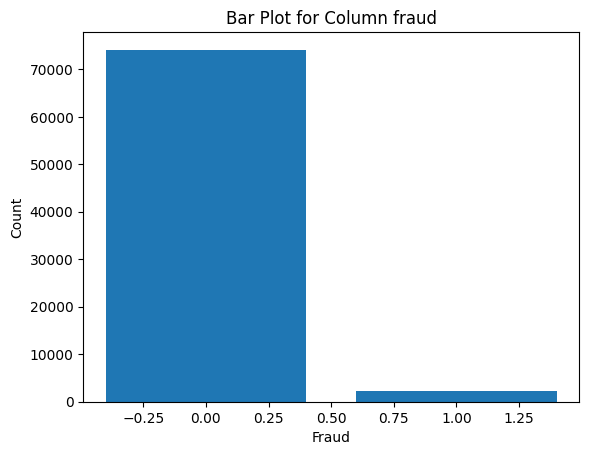

In [16]:



value_counts = data_w_triggers_train['fraud'].value_counts()


plt.bar(value_counts.index, value_counts.values)

# Add labels and title
plt.xlabel('Fraud')
plt.ylabel('Count')
plt.title('Bar Plot for Column fraud')



plt.show()

### ADASYN
#### Train data

## Chunk 41

In [17]:
X = data_w_triggers_train.drop(columns=['fraud'])
y = data_w_triggers_train['fraud']
adasyn = ADASYN(sampling_strategy='auto', n_neighbors=5)
X_resampled, y_resampled = adasyn.fit_resample(X, y)                     ## Oversampling the minor class

adasyn_w_triggers_train = pd.DataFrame(X_resampled, columns=X.columns) #copying

adasyn_w_triggers_train['fraud'] = y_resampled   # adding the target variable


adasyn_w_triggers_train.to_pickle('adasyn_w_triggers_train.pkl')   # Saving the pickled copy

adasyn_w_triggers_train['fraud'] = adasyn_w_triggers_train['fraud'].astype('category')


print(adasyn_w_triggers_train.groupby('fraud').size())

fraud
0    74126
1    74020
dtype: int64


#### Test data

## Chunk 42

In [18]:

X_test = data_w_triggers_test.drop(columns=['fraud'])
y_test = data_w_triggers_test['fraud']                      ## Oversampling the minor class in test data


adasyn = ADASYN(sampling_strategy='auto', n_neighbors=5)
X_resampled, y_resampled = adasyn.fit_resample(X_test, y_test)## Doubt(test our model on real data) test should not be synthetic


adasyn_w_triggers_test = pd.DataFrame(X_resampled, columns=X_test.columns)
adasyn_w_triggers_test['fraud'] = y_resampled

adasyn_w_triggers_test.to_pickle("adasyn_w_triggers_test.pkl", compression="bz2")  # Saving the pickled copy
print(adasyn_w_triggers_test['fraud'].value_counts())

0    31804
1    31693
Name: fraud, dtype: int64


### SMOTE

## Chunk 43

In [19]:
X_train = data_w_triggers_train.drop(columns=['fraud'])
y_train = data_w_triggers_train['fraud']

minority_ratio =y_train.sum() /X_train.shape[0]   # calculating the ratio

smote = SMOTE(sampling_strategy=1-minority_ratio-0.378, k_neighbors=5)   # applying the smote
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)


smote_w_triggers_train = pd.DataFrame(X_resampled, columns=X_train.columns)
smote_w_triggers_train['fraud'] = y_resampled


smote_w_triggers_train.to_pickle("smote_w_triggers_train.pkl", compression="bz2")  # Pickled data is saved


print(smote_w_triggers_train['fraud'].value_counts())

0    74126
1    43867
Name: fraud, dtype: int64


## Chunk 44

In [20]:
X_test = data_w_triggers_test.drop(columns=['fraud'])
y_test = data_w_triggers_test['fraud']

minority_ratio = y_test.sum()/X_test.shape[0]

smote = SMOTE(sampling_strategy=1-minority_ratio-0.401, k_neighbors=5)
X_resampled, y_resampled = smote.fit_resample(X_test, y_test)


smote_w_triggers_test = pd.DataFrame(X_resampled, columns=X_test.columns)
smote_w_triggers_test['fraud'] = y_resampled

smote_w_triggers_test.to_pickle("smote_w_triggers_test.pkl", compression="bz2")

print(smote_w_triggers_test['fraud'].value_counts())

0    31804
1    18124
Name: fraud, dtype: int64


## Chunk 45

In [21]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours
from sklearn.preprocessing import LabelEncoder

# Create an instance of SMOTE and ENN
smote = SMOTE(sampling_strategy='auto', random_state=42)
enn = EditedNearestNeighbours(sampling_strategy='auto', n_neighbors=3)

# Assuming data_w_triggers_train is your pandas DataFrame
X_train = data_w_triggers_train.drop(columns=['fraud'])
y_train = data_w_triggers_train['fraud']

# Apply SMOTE followed by ENN
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
X_resampled, y_resampled = enn.fit_resample(X_resampled, y_resampled)

# Convert y_resampled back to pandas Series
y_resampled = pd.Series(y_resampled, name='fraud')

# Concatenate resampled data to create mwmote_w_triggers_train
mwmote_w_triggers_train = pd.concat([X_resampled, y_resampled], axis=1)

# Write the resampled data to a compressed RDS file
mwmote_w_triggers_train.to_pickle("mwmote_w_triggers_train.pkl", compression='bz2')

# Print class distribution
print(mwmote_w_triggers_train['fraud'].value_counts())


0    74126
1    65518
Name: fraud, dtype: int64


### Chunk 46

In [22]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours
import pandas as pd
import numpy as np

# Assuming data_w_triggers_test is your pandas DataFrame
X_test = data_w_triggers_test.drop(columns=['fraud'])
y_test = data_w_triggers_test['fraud']

# Calculate the number of instances for oversampling
num_instances = len(data_w_triggers_test) - 2 * np.sum(data_w_triggers_test['fraud'])

# Create an instance of SMOTE and ENN
smote = SMOTE(sampling_strategy='auto', random_state=42)
enn = EditedNearestNeighbours(sampling_strategy='auto', n_neighbors=3)

# Apply SMOTE followed by ENN
X_resampled, y_resampled = smote.fit_resample(X_test, y_test)
X_resampled, y_resampled = enn.fit_resample(X_resampled, y_resampled)

# Convert y_resampled back to pandas Series
y_resampled = pd.Series(y_resampled, name='fraud')

# Concatenate resampled data to create mwmote_w_triggers_test
mwmote_w_triggers_test = pd.concat([X_resampled, y_resampled], axis=1)

# Write the resampled data to a compressed RDS file
mwmote_w_triggers_test.to_pickle("mwmote_w_triggers_test.pkl", compression='bz2')

# Print class distribution
print(mwmote_w_triggers_test['fraud'].value_counts())


0    31804
1    28321
Name: fraud, dtype: int64


## Chunk 47

### Rose on Training

0    74126
1    74126
Name: fraud, dtype: int64


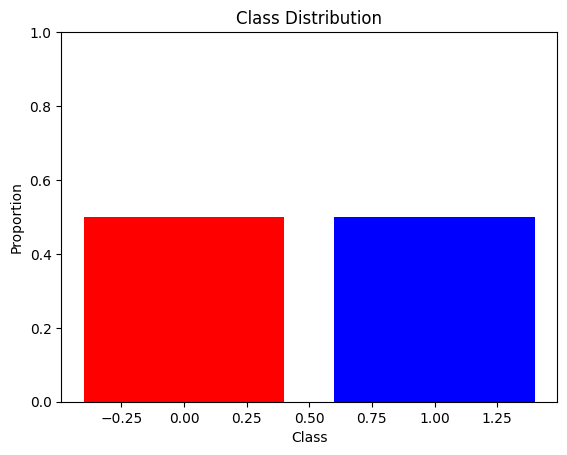

In [23]:
X = data_w_triggers_train.drop(columns=["fraud"])
y = data_w_triggers_train["fraud"]


# y = y.astype(int)

ros = RandomOverSampler(random_state=100)
X_resampled, y_resampled = ros.fit_resample(X, y)

rose_w_triggers_train = pd.DataFrame(X_resampled, columns=X.columns)
rose_w_triggers_train['fraud'] = y_resampled
rose_w_triggers_train.to_pickle("rose_w_triggers_train.pkl", compression="bz2")

print(rose_w_triggers_train['fraud'].value_counts())

fraud_counts = rose_w_triggers_train["fraud"].value_counts()
fraud_proportions = fraud_counts / len(rose_w_triggers_train)

plt.bar(fraud_proportions.index, fraud_proportions.values, color=["red", "blue"])
plt.ylim(0, 1)
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Proportion")
plt.show()



### Chunk 48

### Rose on Testing

0    31804
1    31804
Name: fraud, dtype: int64


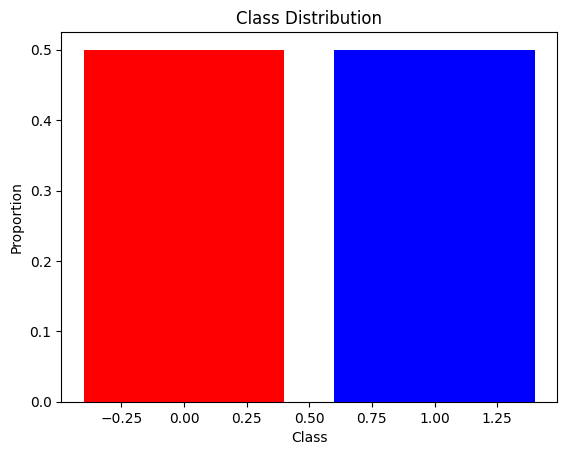

In [24]:
X = data_w_triggers_test.drop(columns=["fraud"])
y = data_w_triggers_test["fraud"]


# y = y.astype(int)

ros = RandomOverSampler(random_state=100)
X_resampled, y_resampled = ros.fit_resample(X, y)

rose_w_triggers_test = pd.DataFrame(X_resampled, columns=X.columns)
rose_w_triggers_test['fraud'] = y_resampled
rose_w_triggers_test.to_pickle("rose_w_triggers_test.pkl", compression="bz2")

print(rose_w_triggers_test['fraud'].value_counts())

fraud_counts = rose_w_triggers_test["fraud"].value_counts()
fraud_proportions = fraud_counts / len(rose_w_triggers_test)

plt.bar(fraud_proportions.index, fraud_proportions.values, color=["red", "blue"])
# plt.ylim(0, 1)
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Proportion")
plt.show()

# Interpretable ML - ICE


In [25]:
data_w_triggers_test

,birth_date,no_of_days_stayed,medical_service_provider_idHOSP3P10675,medical_service_provider_idHOSP3P53909,medical_service_provider_idHOSP3P16665,primary_procedure_codeM100068,medical_service_provider_idHOSP3P89205,medical_service_provider_idHOSP3G59614,hospital_locations.a.s_nagar,medical_service_provider_idHOSP3G81986,medical_service_provider_idHOSP3P12536,hospital_locationbarnala,medical_service_provider_idHOSP3P93201,hospital_locationfatehgarh_sahib,hospital_locationsri_muktsar_sahib,hospital_locationrupnagar,medical_service_provider_idHOSP3P68582,hospital_locationkapurthala,hospital_locationshahid_bhagat_singh_nagar,hospital_locationfazilka,medical_service_provider_idHOSP3P20747,primary_procedure_codeM100008,primary_procedure_codeS100214,approved_allowed_amount,categoryTraders.Familes,hospital_locationbathinda,primary_procedure_codeM100009,hospital_locationmoga,primary_procedure_codeM700004,medical_service_provider_idHOSP3G81376,fraud,claim_amount_flag,hosp_days_flag,gender_flag,claim_count_flag,close_prox_flag,distance,hospital_distance_flag,claim_duration_days,claim_reported_delay_flag
1,0.000206,0.000035,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.095830,0,0,0,0,0,0,0,1,1,0,0,1,0.000000,0,0.000078,0
2,0.000461,0.000014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0.114996,0,0,0,0,0,0,0,1,1,0,1,1,0.000000,0,0.000099,0
3,0.000539,0.000021,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.076664,0,0,0,0,0,0,0,1,1,0,0,1,0.000000,0,0.000099,0
5,0.000376,0.000078,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.166105,0,0,0,0,0,0,0,1,1,0,0,0,0.000000,0,0.000710,0
8,0.000312,0.000028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.076664,0,0,0,0,0,0,0,1,1,0,0,1,0.000320,0,0.000050,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109169,0.000398,0.000007,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.016327,0,0,0,0,0,0,0,1,1,0,1,0,0.000000,0,0.001640,0
109170,0.000419,0.000007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0.016327,0,0,0,0,0,0,0,1,1,0,1,0,0.000000,0,0.001640,0
109176,0.000199,0.000007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.015617,0,1,0,0,0,0,0,1,1,0,1,0,0.000365,0,0.001647,0
109190,0.000398,0.000014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.012777,0,0,0,0,0,0,0,1,0,1,0,0,0.000000,0,0.001590,0


In [26]:
data_w_triggers_train

,birth_date,no_of_days_stayed,medical_service_provider_idHOSP3P10675,medical_service_provider_idHOSP3P53909,medical_service_provider_idHOSP3P16665,primary_procedure_codeM100068,medical_service_provider_idHOSP3P89205,medical_service_provider_idHOSP3G59614,hospital_locations.a.s_nagar,medical_service_provider_idHOSP3G81986,medical_service_provider_idHOSP3P12536,hospital_locationbarnala,medical_service_provider_idHOSP3P93201,hospital_locationfatehgarh_sahib,hospital_locationsri_muktsar_sahib,hospital_locationrupnagar,medical_service_provider_idHOSP3P68582,hospital_locationkapurthala,hospital_locationshahid_bhagat_singh_nagar,hospital_locationfazilka,medical_service_provider_idHOSP3P20747,primary_procedure_codeM100008,primary_procedure_codeS100214,approved_allowed_amount,categoryTraders.Familes,hospital_locationbathinda,primary_procedure_codeM100009,hospital_locationmoga,primary_procedure_codeM700004,medical_service_provider_idHOSP3G81376,fraud,claim_amount_flag,hosp_days_flag,gender_flag,claim_count_flag,close_prox_flag,distance,hospital_distance_flag,claim_duration_days,claim_reported_delay_flag
51662,0.000149,0.000021,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.053239,0,0,0,1,0,0,0,1,0,0,0,0,0.000000,0,0.000710,1
57869,0.000220,0.000206,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.012067,0,0,0,0,1,0,0,1,1,0,0,0,0.000000,0,0.001008,0
2985,0.000241,0.000007,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.017178,0,0,0,1,0,0,0,1,1,0,1,0,0.000000,0,0.001022,1
29924,0.000327,0.000007,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.016327,0,0,0,0,0,0,0,1,1,0,1,0,0.000229,0,0.000582,0
95245,0.000248,0.000057,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.106477,0,0,0,0,0,0,0,1,1,0,0,0,0.000242,0,0.001498,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21701,0.000625,0.000014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.012777,0,0,0,0,0,0,0,1,1,0,0,0,0.000000,0,0.000447,0
8801,0.000220,0.000007,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.012777,0,0,1,0,0,0,1,1,1,0,0,0,0.000000,0,0.001043,0
8381,0.000234,0.000007,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.017178,0,0,0,1,0,0,0,1,1,0,1,0,0.000392,0,0.001022,1
25808,0.000334,0.000043,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.076664,0,0,0,0,0,0,0,1,1,0,0,0,0.000000,0,0.000539,0


## Implementing the Random Forest and IML on data_w_triggers_train

In [27]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence


In [28]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix
# Create a synthetic dataset
X=adasyn_w_triggers_train.drop('fraud',axis=1)
y=adasyn_w_triggers_train['fraud']
y_test=adasyn_w_triggers_test['fraud']
X_test=adasyn_w_triggers_test.drop('fraud',axis=1)

# Split the dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create a Random Forest Classifier
clf = RandomForestClassifier(n_estimators=50, random_state=42)


# Train the model on the training data
clf.fit(X, y)

# Make predictions on the test data
y_pred = clf.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_pred)
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print(f"\n\n Accuracy:   {accuracy:.2f} ")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)


print(f"Precision:   {precision:.2f}")
print(f"Recall:   {recall:.2f}")
print(f"F1 Score:   {f1_score:.2f} \n\n")


print(conf_matrix)



 Accuracy:   0.83 
Precision:   0.95
Recall:   0.70
F1 Score:   0.80 


[[30752  1052]
 [ 9660 22033]]


In [30]:
y_pred.sum()/y_test.sum()

0.7283942826491654

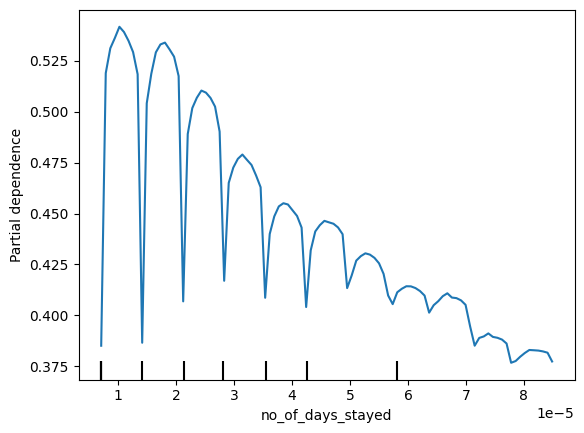

In [31]:
PartialDependenceDisplay.from_estimator(clf, X,['no_of_days_stayed'])

In [ ]:
# PartialDependenceDisplay.from_estimator(clf,
#                                         X,
#                                         [ 'claim_amount_flag',
#        'hosp_days_flag', 'gender_flag', 'claim_count_flag', 'close_prox_flag',
#        'distance', 'hospital_distance_flag', 'claim_duration_days',
#        'claim_reported_delay_flag'],
#                                         kind='individual',
#                                         percentiles = (0,1),
#                                         centered= True)

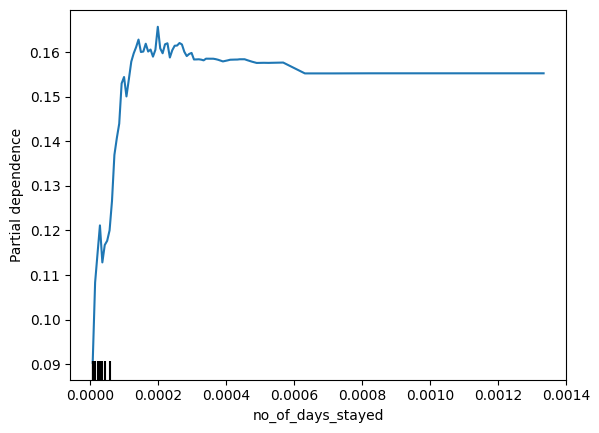

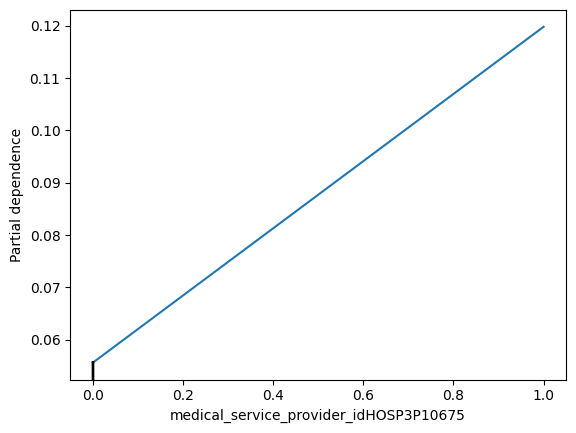

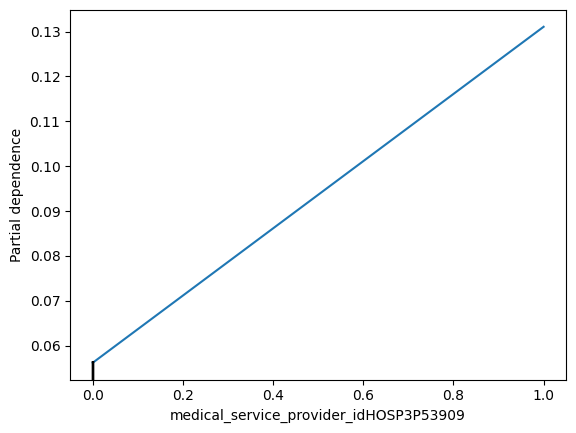

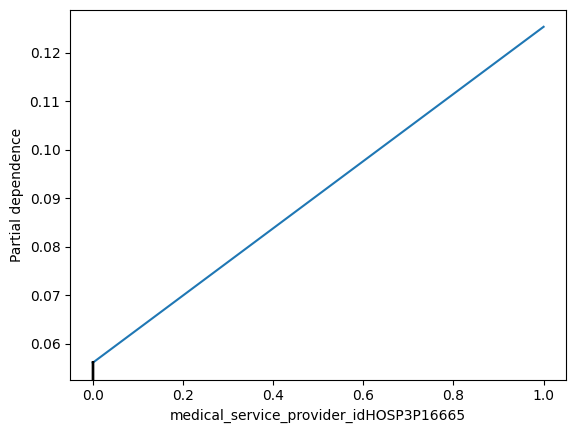

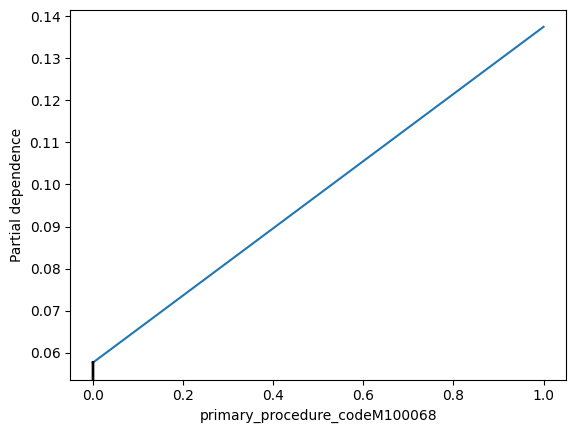

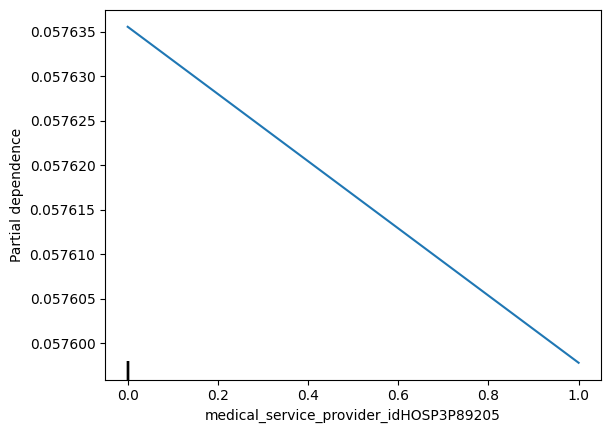

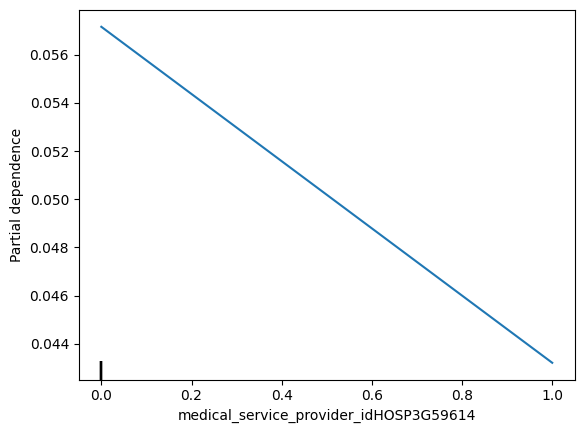

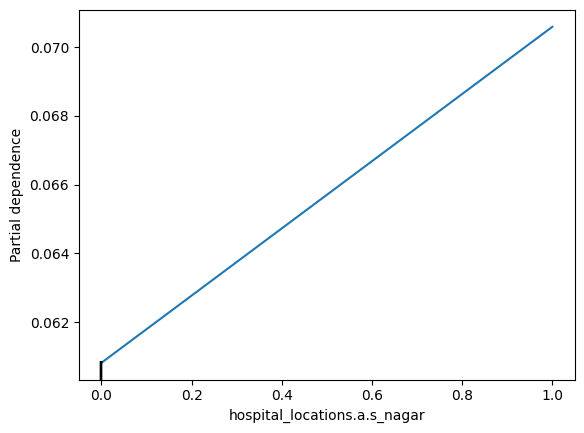

In [32]:
l=[ 'no_of_days_stayed',
       'medical_service_provider_idHOSP3P10675',
       'medical_service_provider_idHOSP3P53909',
       'medical_service_provider_idHOSP3P16665',
       'primary_procedure_codeM100068',
       'medical_service_provider_idHOSP3P89205',
       'medical_service_provider_idHOSP3G59614',
       'hospital_locations.a.s_nagar']
for i in l:
    PartialDependenceDisplay.from_estimator(clf,
                                            X_train,
                                            [i],
                                            # kind='',
                                            # percentiles = (0,1),
                                            # centered= True
                                            )

In [33]:
from sklearn.metrics import precision_score, recall_score, f1_score
X=adasyn_w_triggers_train.drop('fraud',axis=1)
y=adasyn_w_triggers_train['fraud']
y_test=adasyn_w_triggers_test['fraud']
X_test=adasyn_w_triggers_test.drop('fraud',axis=1)

# Split the dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create a Random Forest Classifier
clf = RandomForestClassifier(n_estimators=50, random_state=42)

# Train the model on the training data
clf.fit(X, y)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)


print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1_score:.2f}")

Accuracy: 0.83
Precision: 0.95
Recall: 0.70
F1 Score: 0.80


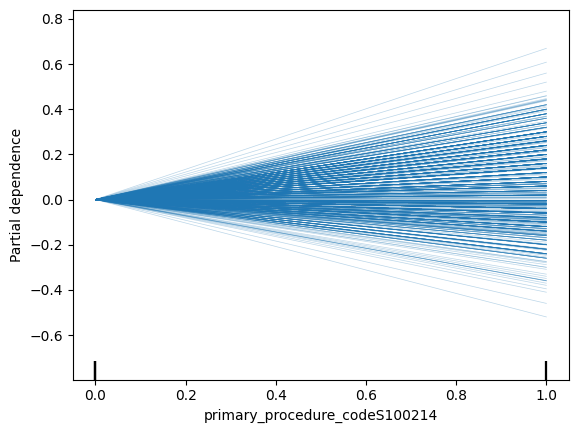

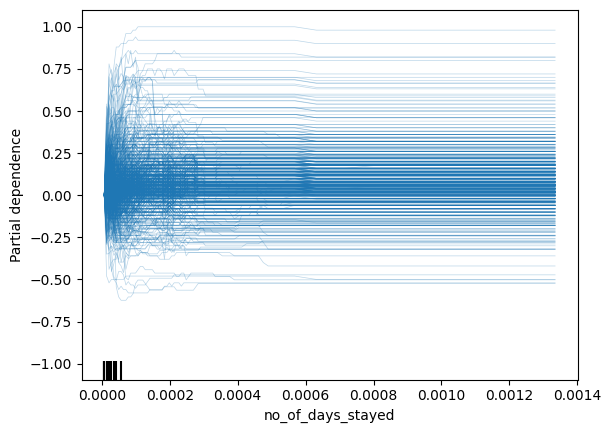

In [34]:
l=[ 'primary_procedure_codeS100214','no_of_days_stayed']
for i in l:
    PartialDependenceDisplay.from_estimator(clf,
                                            X_train,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= True)

In [35]:
# Get unique values of the categorical feature
df = data_w_triggers_train
unique_genders = df['claim_count_flag'].unique()

# Create a dictionary to store subsets
subset_dict = {}

# Split the dataframe based on unique values of the categorical feature
for gender in unique_genders:
    subset_dict[gender] = df[df['claim_count_flag'] == gender]

# Access the subsets using the dictionary
female_subset = subset_dict[1]
male_subset = subset_dict[0]

# Display the subsets
print("1 Subset:")
print(female_subset)

print("\n0 Subset:")
print(male_subset)

1 Subset:
        birth_date  no_of_days_stayed  medical_service_provider_idHOSP3P10675  \
2985      0.000241           0.000007                                       0   
29924     0.000327           0.000007                                       0   
103064    0.000192           0.000007                                       0   
45403     0.000270           0.000064                                       0   
46434     0.000177           0.000028                                       0   
...            ...                ...                                     ...   
81921     0.000241           0.000007                                       0   
6590      0.000447           0.000007                                       0   
41582     0.000312           0.000007                                       0   
35328     0.000177           0.000007                                       0   
8381      0.000234           0.000007                                       0   

        medical_s

In [37]:
X.columns


Index(['birth_date', 'no_of_days_stayed',
       'medical_service_provider_idHOSP3P10675',
       'medical_service_provider_idHOSP3P53909',
       'medical_service_provider_idHOSP3P16665',
       'primary_procedure_codeM100068',
       'medical_service_provider_idHOSP3P89205',
       'medical_service_provider_idHOSP3G59614',
       'hospital_locations.a.s_nagar',
       'medical_service_provider_idHOSP3G81986',
       'medical_service_provider_idHOSP3P12536', 'hospital_locationbarnala',
       'medical_service_provider_idHOSP3P93201',
       'hospital_locationfatehgarh_sahib',
       'hospital_locationsri_muktsar_sahib', 'hospital_locationrupnagar',
       'medical_service_provider_idHOSP3P68582', 'hospital_locationkapurthala',
       'hospital_locationshahid_bhagat_singh_nagar',
       'hospital_locationfazilka', 'medical_service_provider_idHOSP3P20747',
       'primary_procedure_codeM100008', 'primary_procedure_codeS100214',
       'approved_allowed_amount', 'categoryTraders.Familes'

/usr/local/lib/python3.10/dist-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([min_val, max_val])
/usr/local/lib/python3.10/dist-packages/sklearn/inspection/_plot/partial_dependence.py:972: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([min_val, max_val])


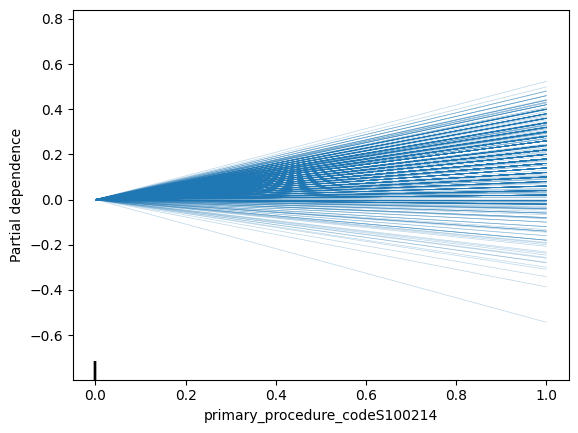

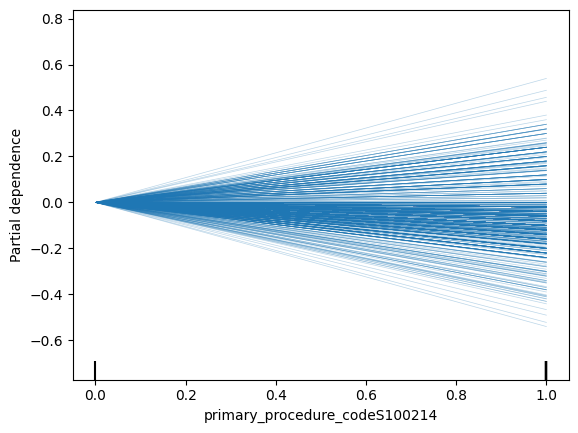

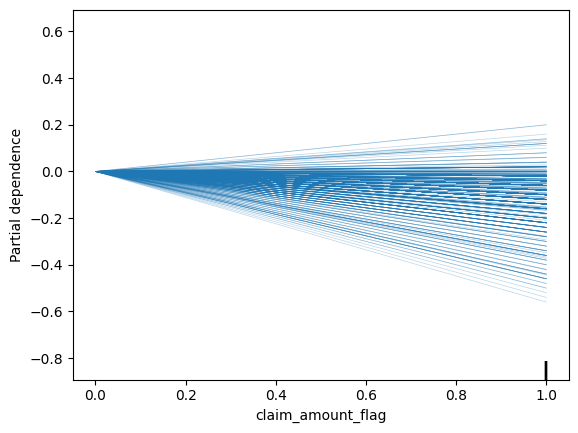

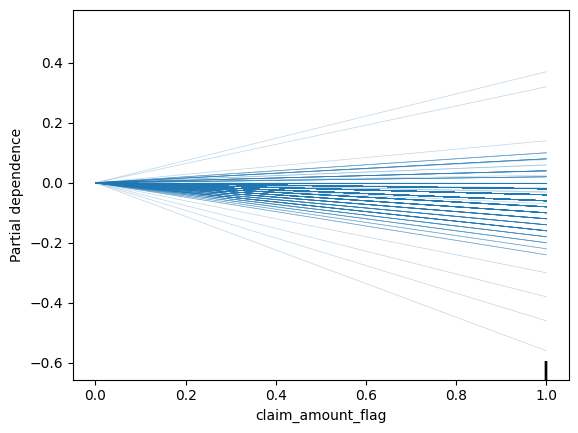

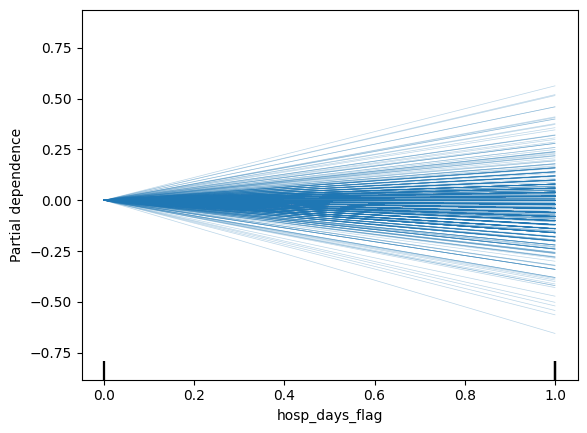

...

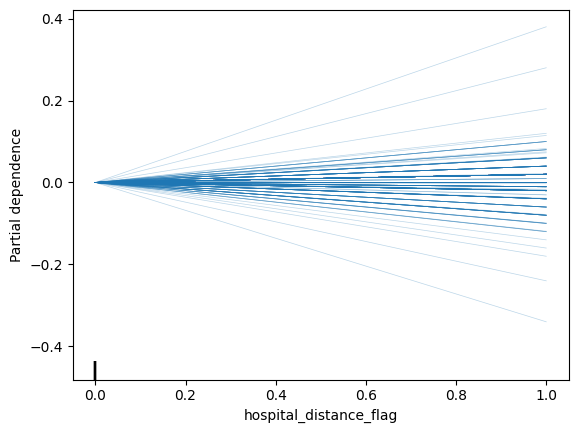

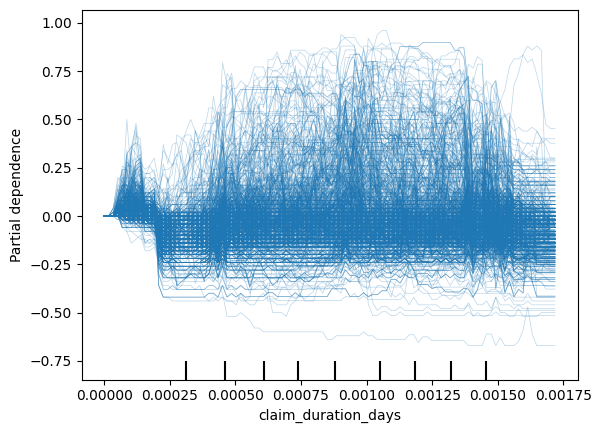

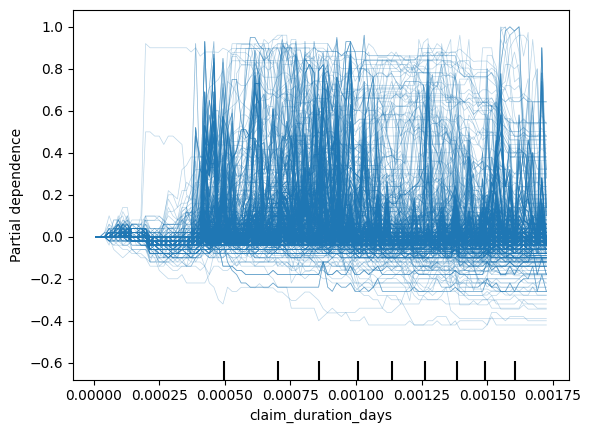

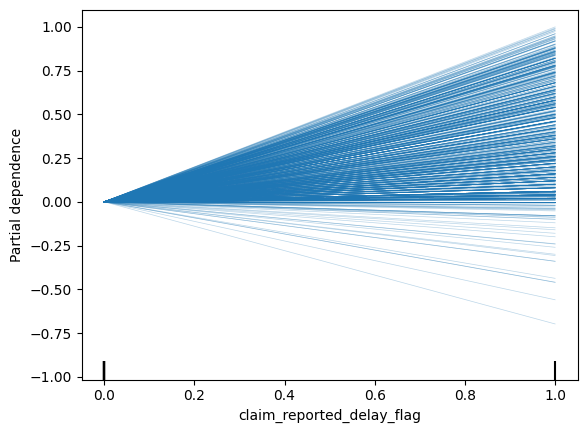

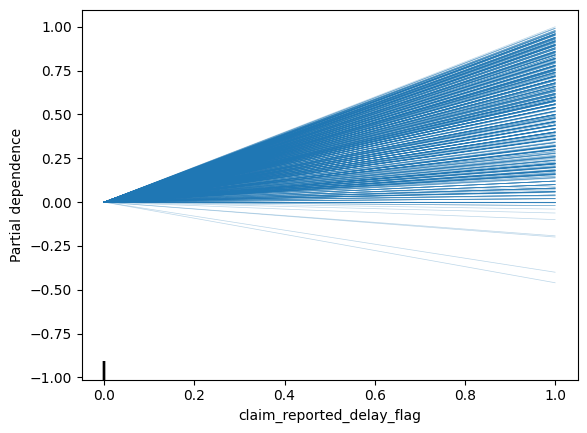

In [36]:
male =male_subset.drop('fraud',axis=1)
female =female_subset.drop('fraud',axis=1)
l=['primary_procedure_codeS100214', 'claim_amount_flag',
       'hosp_days_flag', 'gender_flag', 'claim_count_flag', 'close_prox_flag',
       'distance', 'hospital_distance_flag', 'claim_duration_days',
       'claim_reported_delay_flag']
for i in l:
    PartialDependenceDisplay.from_estimator(clf,
                                            male,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= True)
    PartialDependenceDisplay.from_estimator(clf,
                                            female,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= True)

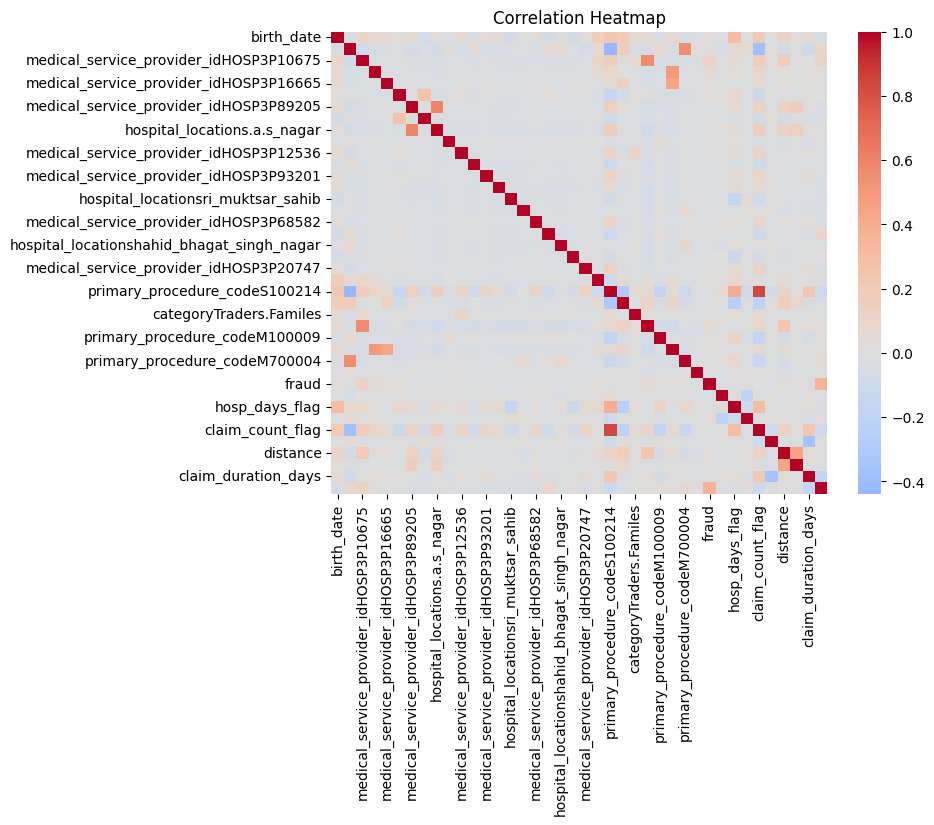

In [38]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
correlation_matrix = data_w_triggers_train.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()


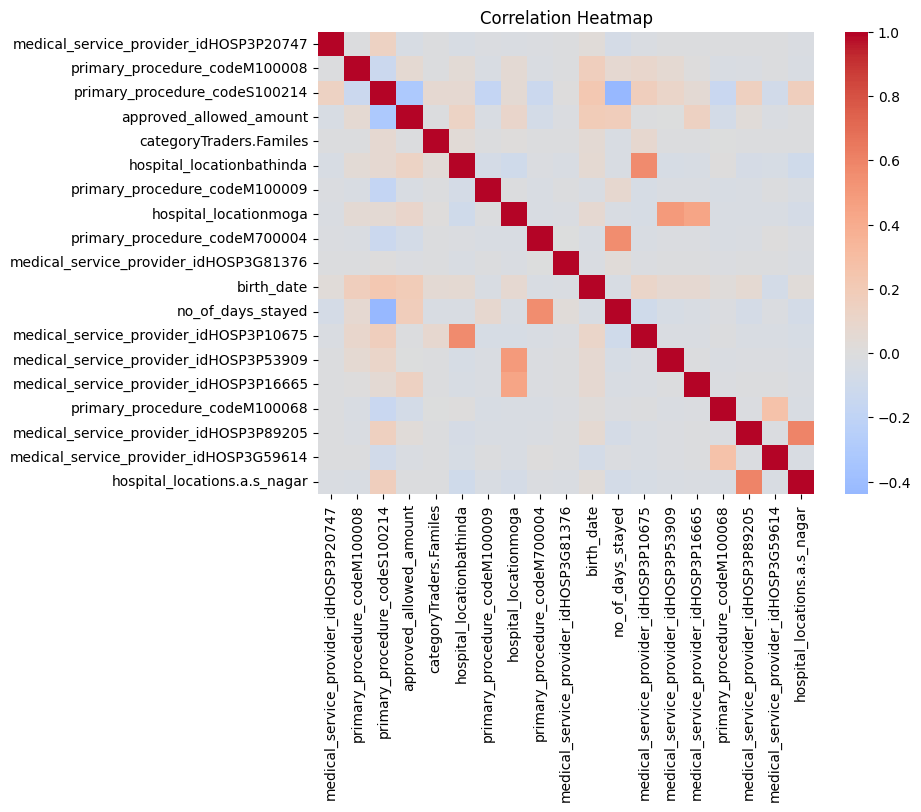

In [39]:
columns = ['medical_service_provider_idHOSP3P20747',
 'primary_procedure_codeM100008',
 'primary_procedure_codeS100214',
 'approved_allowed_amount',
 'categoryTraders.Familes',
 'hospital_locationbathinda',
 'primary_procedure_codeM100009',
 'hospital_locationmoga',
 'primary_procedure_codeM700004',
 'medical_service_provider_idHOSP3G81376','birth_date', 'no_of_days_stayed',
       'medical_service_provider_idHOSP3P10675',
       'medical_service_provider_idHOSP3P53909',
       'medical_service_provider_idHOSP3P16665',
       'primary_procedure_codeM100068',
       'medical_service_provider_idHOSP3P89205',
       'medical_service_provider_idHOSP3G59614',
       'hospital_locations.a.s_nagar']

# Calculate the correlation matrix for the specified columns
correlation_matrix = df[columns].corr()

# print("Correlation Matrix:")
# print(correlation_matrix)
# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

In [40]:
top_features=['claim_duration_days', 'birth_date', 'claim_reported_delay_flag',
       'approved_allowed_amount', 'no_of_days_stayed','hosp_days_flag', 'gender_flag', 'claim_count_flag', 'close_prox_flag',
       'distance']

# Implementing models of on Each dataset and Applying ICE on Top5 Features

### Swaroop - Decision Tree Model

In [41]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, auc, precision_recall_curve,average_precision_score
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [42]:
def  DecisionTree(data_train,data_test):
        X_train = data_train.drop("fraud", axis=1)
        y_train = data_train["fraud"]
        X_test = data_test.drop("fraud", axis=1)
        y_test = data_test["fraud"]

        # Create and fit the Decision Tree Classifier
        tree = DecisionTreeClassifier(min_samples_split=5)
        tree.fit(X_train, y_train)

        tree_pred_prob = tree.predict_proba(X_test)[:, 1]

        # Compute ROC-AUC score
        roc_auc = roc_auc_score(y_test, tree_pred_prob)
        fpr, tpr, thresholds = roc_curve(y_test, tree_pred_prob)

        # Find the threshold that gives the best F1 score (assumes equal misclassification costs)
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]

        # Convert probabilities to binary predictions based on the threshold
        tree_pred = np.where(tree_pred_prob > optimal_threshold, 1, 0)

        # Compute confusion matrix
        cm = confusion_matrix(y_test, tree_pred)

        accuracy = accuracy_score(y_test, tree_pred)
        # Calculate precision-recall curve and AUC-PR
        precision, recall, _ = precision_recall_curve(y_test, tree_pred_prob)
        pr_auc = auc(recall, precision)

        # Calculate F1 score
        f1 = f1_score(y_test, tree_pred)
        # printing the results
        print("Confusion Matrix:")
        print(cm)
        print("ROC AUC:", roc_auc)
        print("PR AUC:", pr_auc)

        print("Accuracy:", accuracy)
        print("Precision:", precision_score(y_test, tree_pred))
        print("Recall:",recall_score(y_test, tree_pred))
        print("F1 Score:",f1_score(y_test, tree_pred))

        return tree

#### data_w_triggers - Decision Tree model


In [43]:
DT_data_w_triggers=DecisionTree(data_w_triggers_train,data_w_triggers_test)

Confusion Matrix:
[[30904   900]
 [  546   408]]
ROC AUC: 0.7079608507506802
PR AUC: 0.3607751937992605
Accuracy: 0.9558581109957873
Precision: 0.3119266055045872
Recall: 0.4276729559748428
F1 Score: 0.3607427055702918


In [44]:
feature_importances = DT_data_w_triggers.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
top_feature_indices = sorted_indices[:5]
top_features = X_train.columns[top_feature_indices]
print("Top 5 features:", top_features)

Top 5 features: Index(['claim_duration_days', 'birth_date', 'claim_reported_delay_flag',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


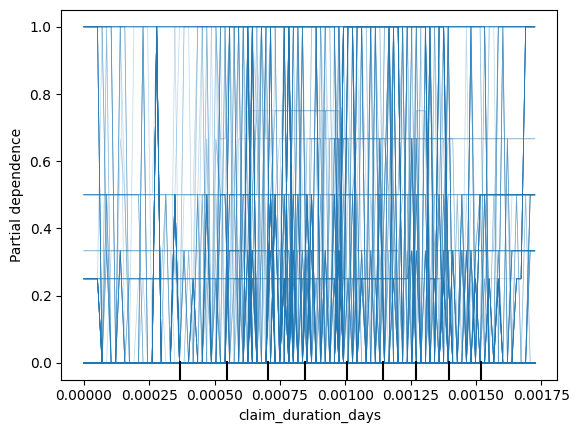

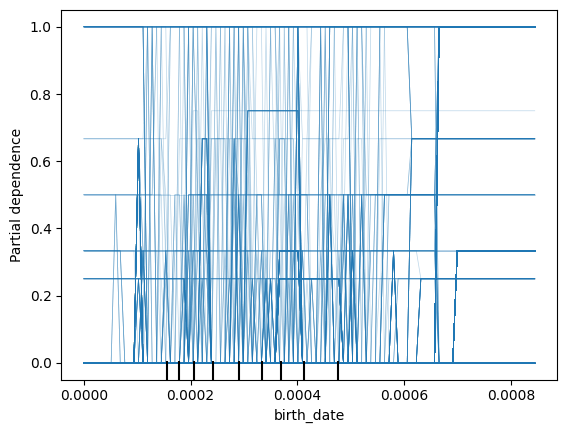

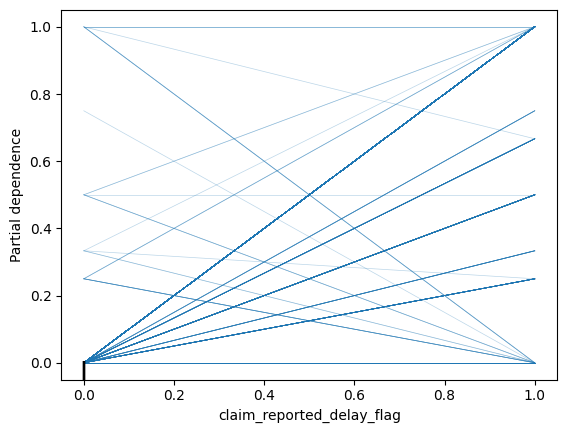

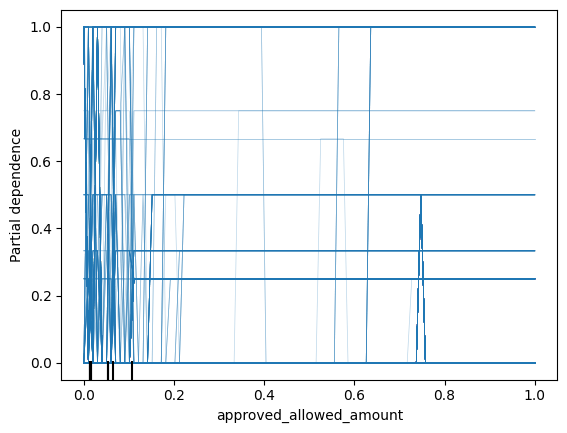

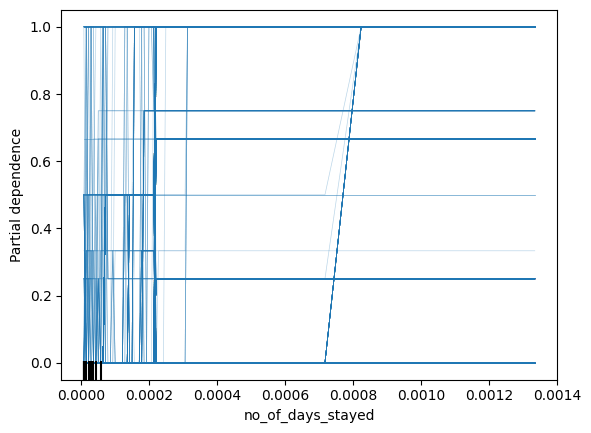

In [45]:
main_data=data_w_triggers_train.drop('fraud',axis=1)
l=['claim_duration_days', 'birth_date', 'claim_reported_delay_flag',
       'approved_allowed_amount', 'no_of_days_stayed']
for i in l:
    PartialDependenceDisplay.from_estimator(DT_data_w_triggers,
                                            main_data,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= False)

In [46]:
!pip install nyoka


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.0/304.0 kB 4.1 MB/s eta 0:00:00


In [47]:
import joblib

In [48]:
DT=DecisionTree(adasyn_w_triggers_train,adasyn_w_triggers_test)
joblib.dump(DT, 'my_model.pkl')


Confusion Matrix:
[[29888  1916]
 [ 9102 22591]]
ROC AUC: 0.8340131656981157
PR AUC: 0.8954353524631962
Accuracy: 0.8264799911806857
Precision: 0.9218182560084873
Recall: 0.7128072445019404
F1 Score: 0.8039501779359429


['my_model.pkl']

In [49]:
adasyn_w_triggers_train.columns

Index(['birth_date', 'no_of_days_stayed',
       'medical_service_provider_idHOSP3P10675',
       'medical_service_provider_idHOSP3P53909',
       'medical_service_provider_idHOSP3P16665',
       'primary_procedure_codeM100068',
       'medical_service_provider_idHOSP3P89205',
       'medical_service_provider_idHOSP3G59614',
       'hospital_locations.a.s_nagar',
       'medical_service_provider_idHOSP3G81986',
       'medical_service_provider_idHOSP3P12536', 'hospital_locationbarnala',
       'medical_service_provider_idHOSP3P93201',
       'hospital_locationfatehgarh_sahib',
       'hospital_locationsri_muktsar_sahib', 'hospital_locationrupnagar',
       'medical_service_provider_idHOSP3P68582', 'hospital_locationkapurthala',
       'hospital_locationshahid_bhagat_singh_nagar',
       'hospital_locationfazilka', 'medical_service_provider_idHOSP3P20747',
       'primary_procedure_codeM100008', 'primary_procedure_codeS100214',
       'approved_allowed_amount', 'categoryTraders.Familes'

In [50]:
from sklearn.pipeline import Pipeline

In [52]:
# Create a scikit-learn pipeline with your classifier model
pipeline = Pipeline([
    ('classifier', DT)  # Replace 'model' with your trained classifier
])

# Define the list of input features (excluding the target variable)
input_features = ['birth_date', 'no_of_days_stayed',
       'medical_service_provider_idHOSP3P10675',
       'medical_service_provider_idHOSP3P53909',
       'medical_service_provider_idHOSP3P16665',
       'primary_procedure_codeM100068',
       'medical_service_provider_idHOSP3P89205',
       'medical_service_provider_idHOSP3G59614',
       'hospital_locations.a.s_nagar',
       'medical_service_provider_idHOSP3G81986',
       'medical_service_provider_idHOSP3P12536', 'hospital_locationbarnala',
       'medical_service_provider_idHOSP3P93201',
       'hospital_locationfatehgarh_sahib',
       'hospital_locationsri_muktsar_sahib', 'hospital_locationrupnagar',
       'medical_service_provider_idHOSP3P68582', 'hospital_locationkapurthala',
       'hospital_locationshahid_bhagat_singh_nagar',
       'hospital_locationfazilka', 'medical_service_provider_idHOSP3P20747',
       'primary_procedure_codeM100008', 'primary_procedure_codeS100214',
       'approved_allowed_amount', 'categoryTraders.Familes',
       'hospital_locationbathinda', 'primary_procedure_codeM100009',
       'hospital_locationmoga', 'primary_procedure_codeM700004',
       'medical_service_provider_idHOSP3G81376', 'claim_amount_flag',
       'hosp_days_flag', 'gender_flag', 'claim_count_flag', 'close_prox_flag',
       'distance', 'hospital_distance_flag', 'claim_duration_days',
       'claim_reported_delay_flag']

# Convert the pipeline to PMML and save it
# skl_to_pmml(pipeline, input_features, 'output_model.pmml')

In [ ]:
# from nyoka import skl_to_pmml

# # Load the saved scikit-learn model
# model = joblib.load('my_model.pkl')

# # Convert the model to PMML and save it
# skl_to_pmml(model, , 'output_model.pmml')


#### adasyn_w_triggers - Decision Tree model

In [53]:
DT_adasyn_w_triggers=DecisionTree(adasyn_w_triggers_train,adasyn_w_triggers_test)

Confusion Matrix:
[[29882  1922]
 [ 9119 22574]]
ROC AUC: 0.8340193390326178
PR AUC: 0.895281726438311
Accuracy: 0.8261177693434335
Precision: 0.9215382103200522
Recall: 0.7122708484523397
F1 Score: 0.8035024648952642


In [54]:
feature_importances = DT_adasyn_w_triggers.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
top_feature_indices = sorted_indices[:5]
top_features = X_train.columns[top_feature_indices]
print("Top 5 features:", top_features)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'birth_date',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


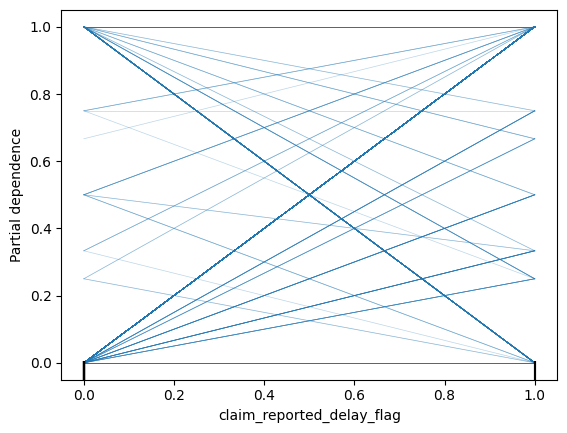

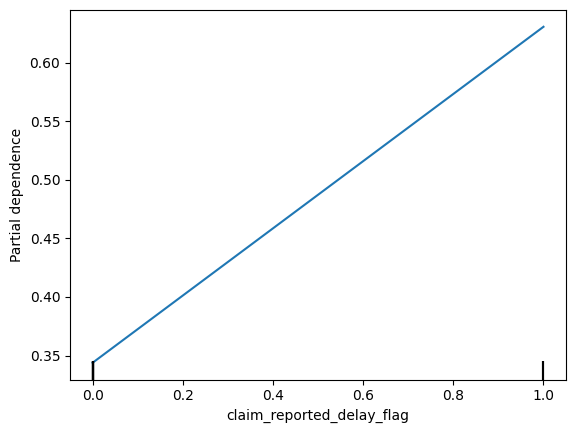

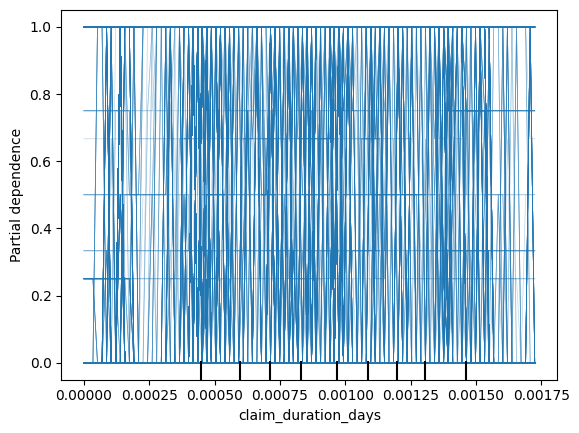

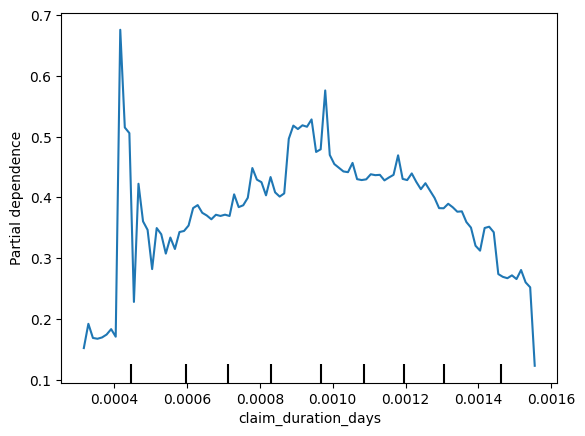

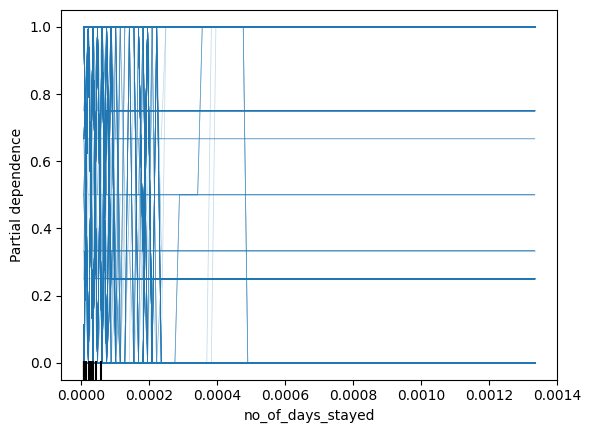

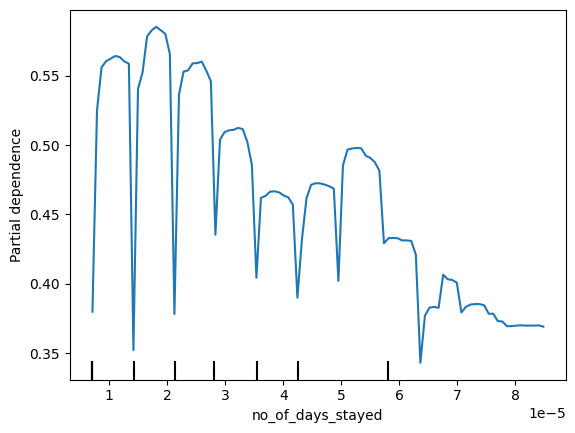

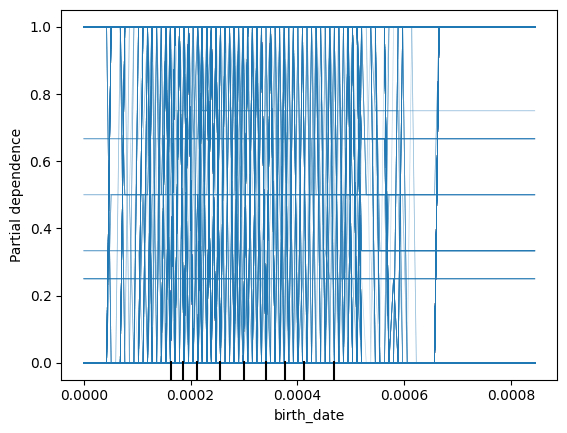

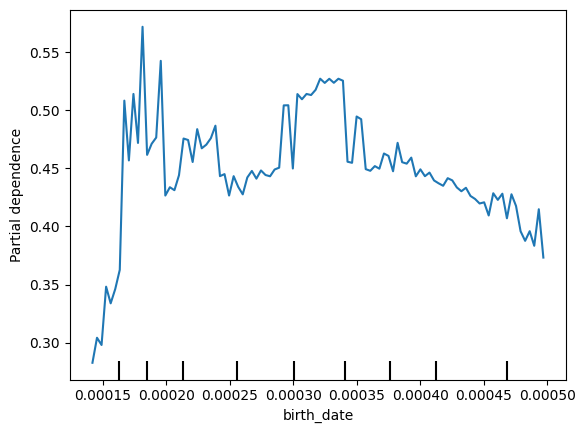

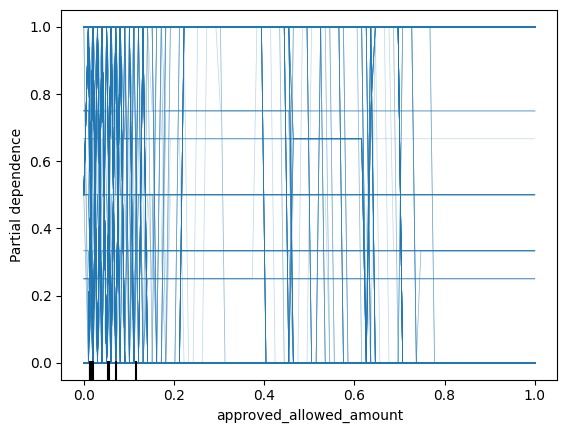

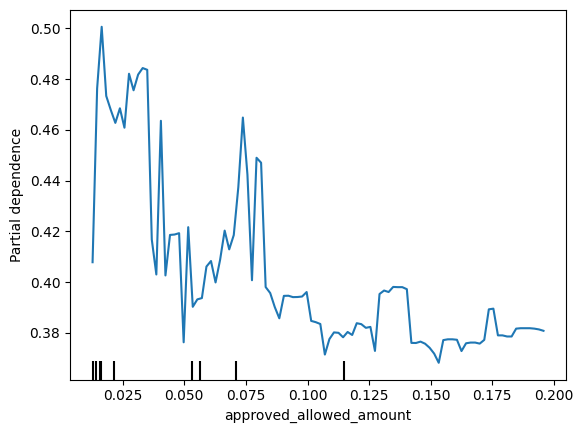

In [55]:
main_data=adasyn_w_triggers_train.drop('fraud',axis=1)                       ## change the data
l=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount']
for i in l:
    PartialDependenceDisplay.from_estimator(DT_adasyn_w_triggers,
                                            main_data,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= False)
    PartialDependenceDisplay.from_estimator(DT_adasyn_w_triggers,
                                            main_data,
                                            [i])
# PartialDependenceDisplay.from_estimator(clf, X,['no_of_days_stayed'])

#### smote_w_triggers - Decision Tree model


In [56]:
DT_smote_w_triggers=DecisionTree(smote_w_triggers_train,smote_w_triggers_test)

Confusion Matrix:
[[30357  1447]
 [ 4523 13601]]
ROC AUC: 0.8613953323019851
PR AUC: 0.8803852954060357
Accuracy: 0.8804278160551193
Precision: 0.9038410419989368
Recall: 0.7504414036636504
F1 Score: 0.8200289400699385


In [57]:
feature_importances = DT_smote_w_triggers.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
top_feature_indices = sorted_indices[:5]
top_features = X_train.columns[top_feature_indices]
print("Top 5 features:", top_features)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount'],
      dtype='object')


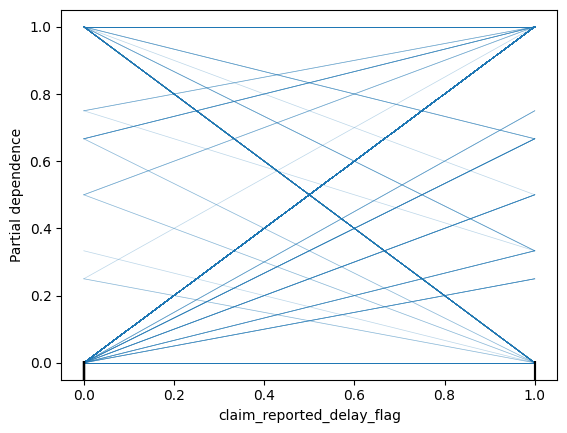

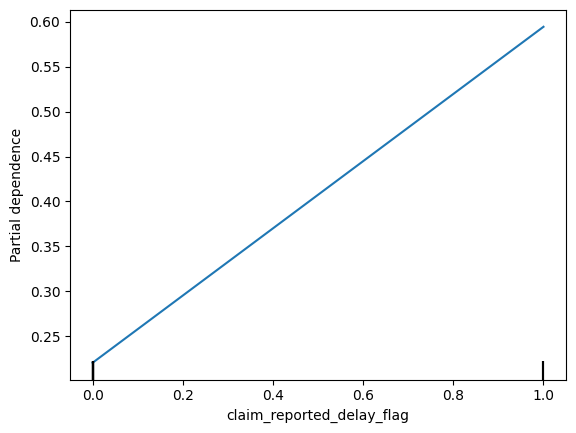

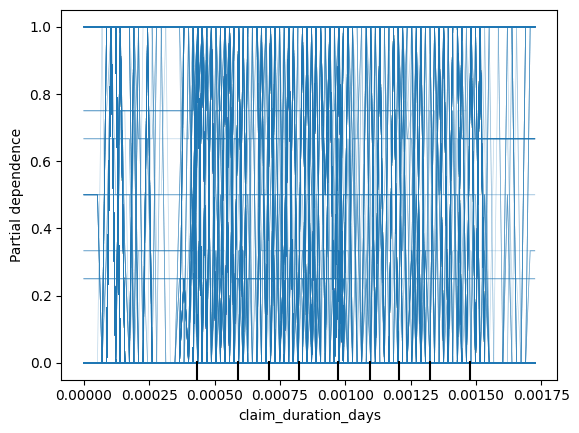

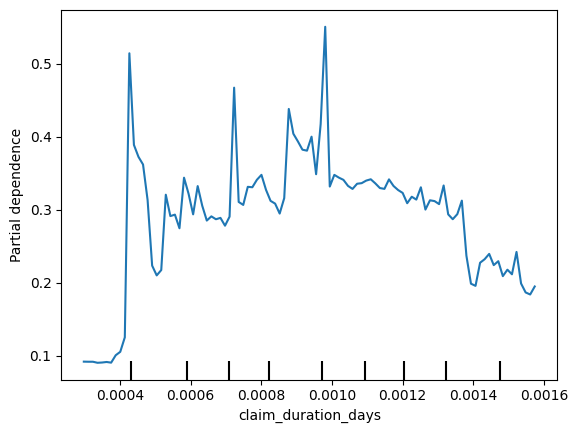

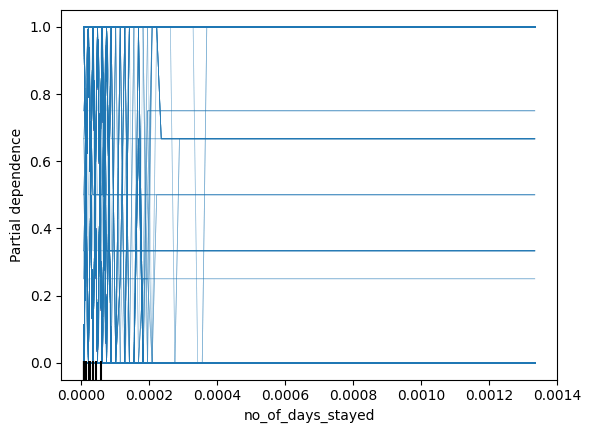

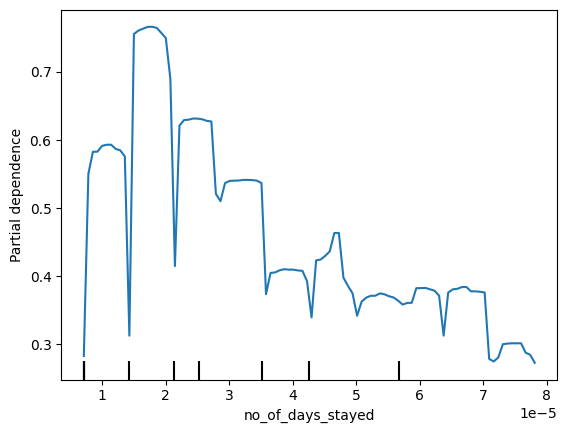

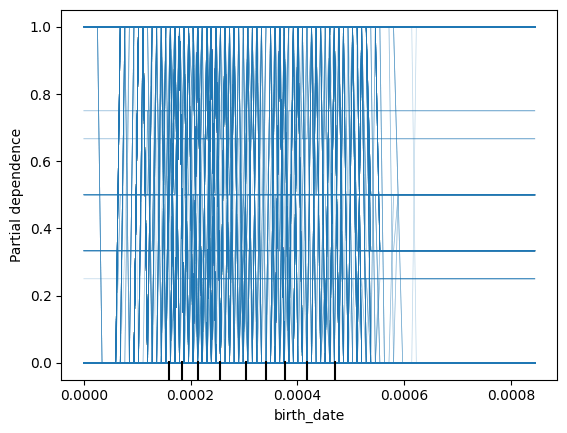

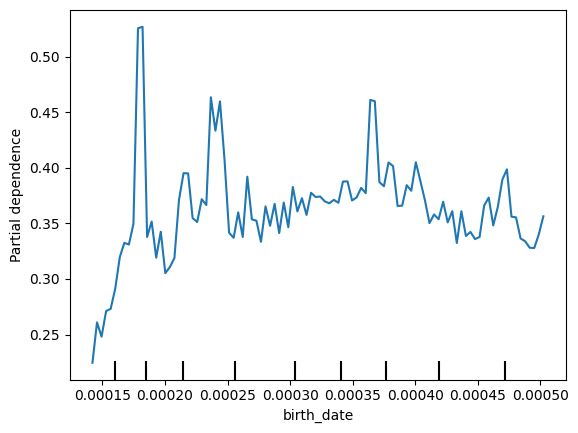

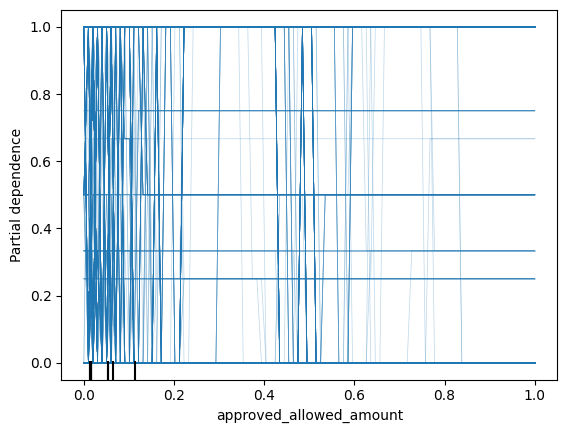

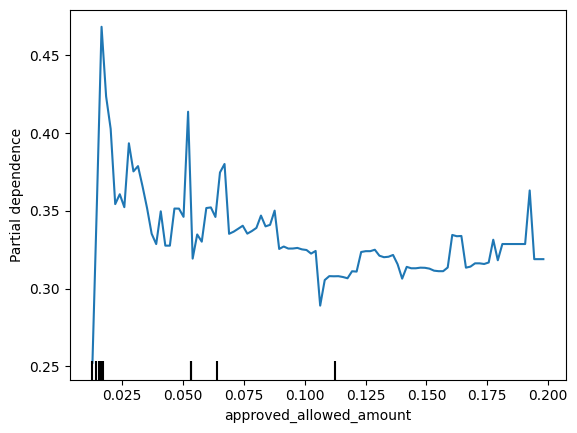

In [58]:
main_data=smote_w_triggers_train.drop('fraud',axis=1)                       ## change the data
l=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount']
for i in l:
    PartialDependenceDisplay.from_estimator(DT_smote_w_triggers,
                                            main_data,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= False)
    PartialDependenceDisplay.from_estimator(DT_smote_w_triggers,
                                            main_data,
                                            [i])

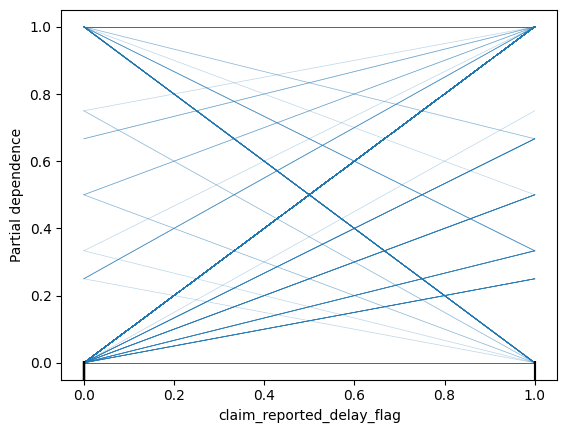

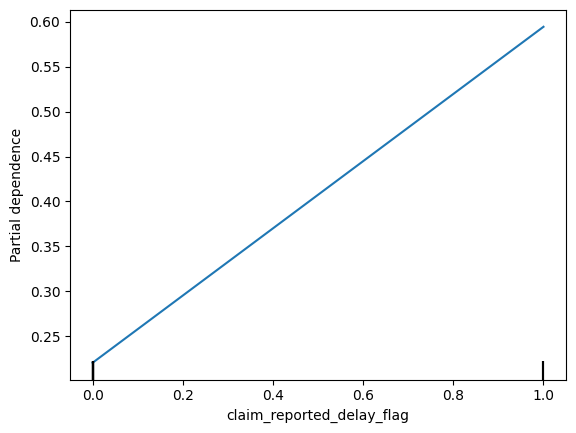

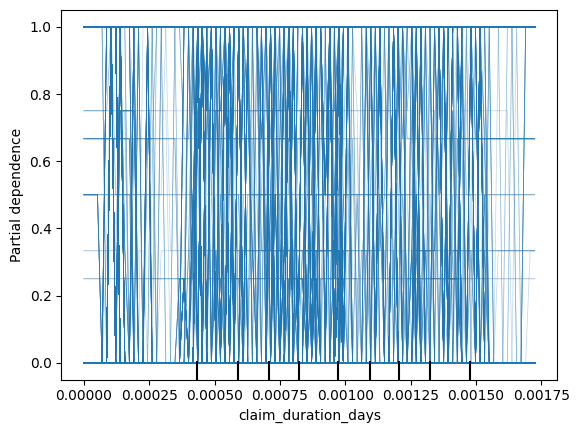

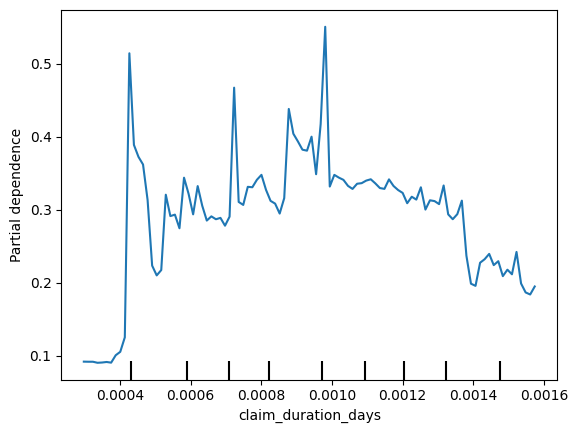

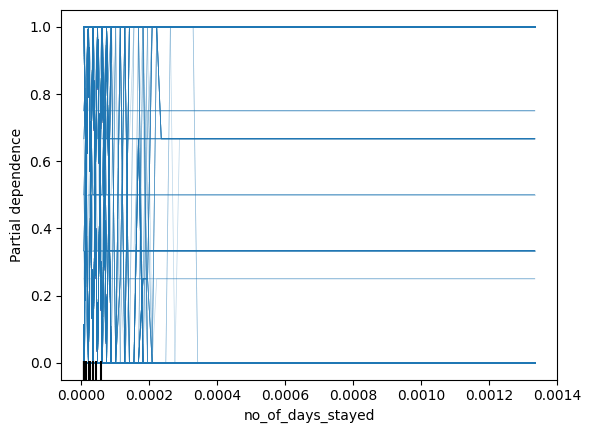

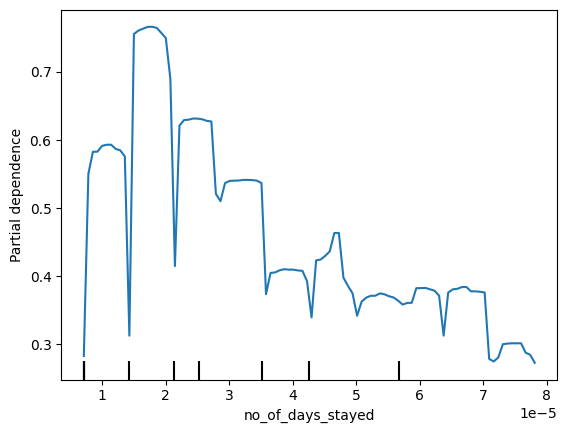

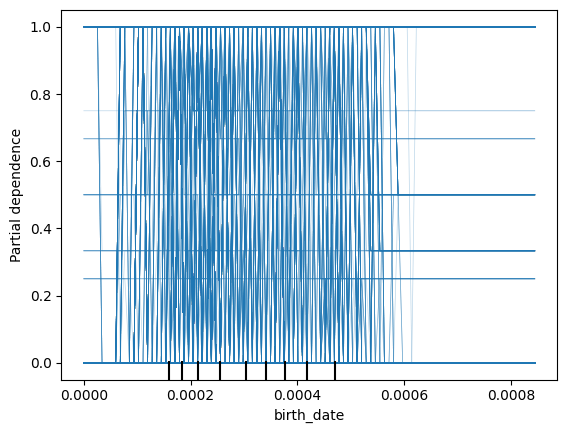

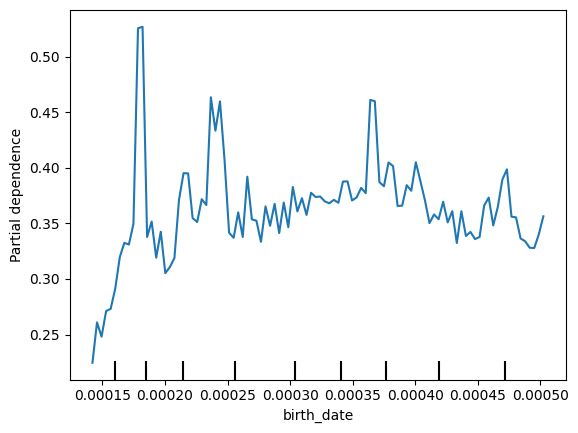

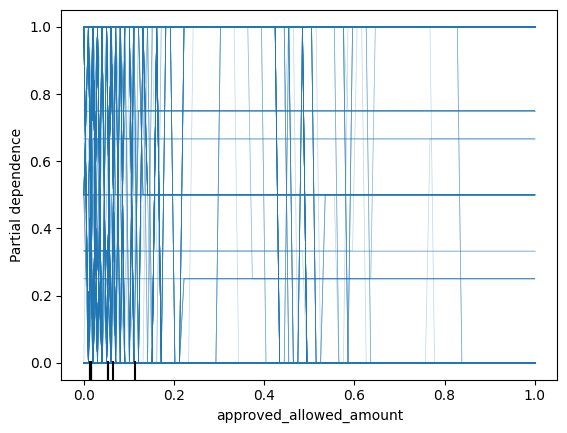

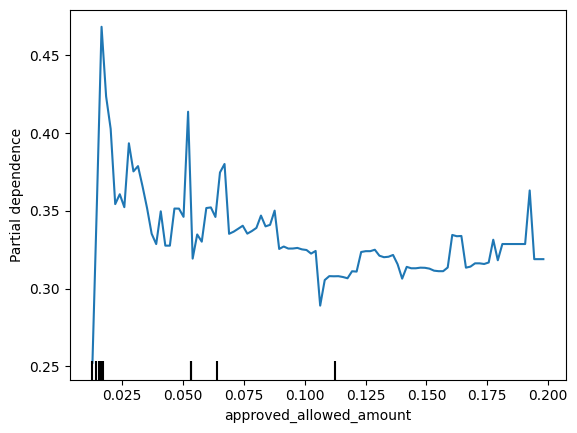

In [59]:
for i in top_features:
    PartialDependenceDisplay.from_estimator(DT_smote_w_triggers,
                                            main_data,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= False)
    PartialDependenceDisplay.from_estimator(DT_smote_w_triggers,
                                            main_data,
                                            [i])

#### mwmote_w_triggers - Decision Tree model

In [60]:
DT_mwmote_w_triggers=DecisionTree(mwmote_w_triggers_train,mwmote_w_triggers_test)

Confusion Matrix:
[[30412  1392]
 [ 6907 21414]]
ROC AUC: 0.8614533058937477
PR AUC: 0.909385186170429
Accuracy: 0.861970893970894
Precision: 0.9389634306761379
Recall: 0.7561173687369797
F1 Score: 0.8376787216148024


In [61]:
feature_importances = DT_mwmote_w_triggers.feature_importances_
sorted_indices = feature_importances.argsort()[::-1]
top_feature_indices = sorted_indices[:5]
top_features = X_train.columns[top_feature_indices]
print("Top 5 features:", top_features)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount'],
      dtype='object')


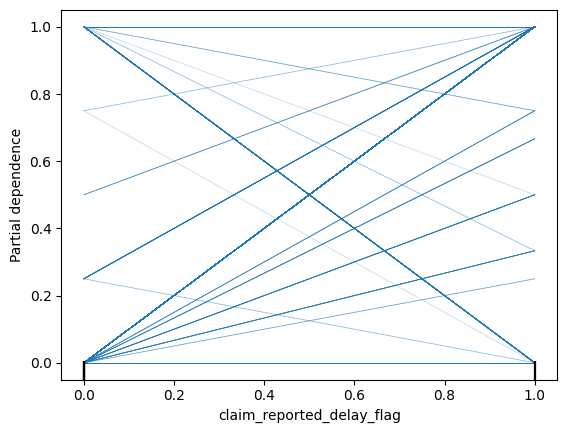

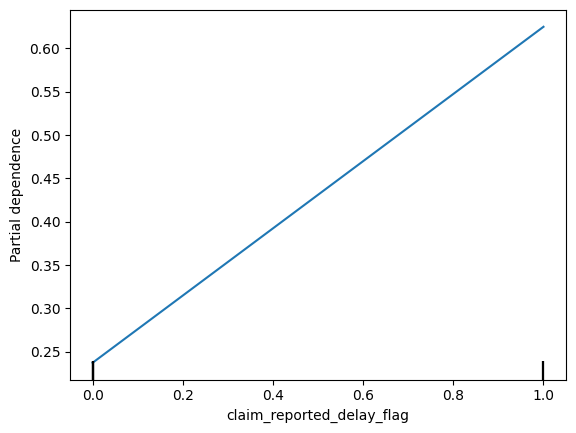

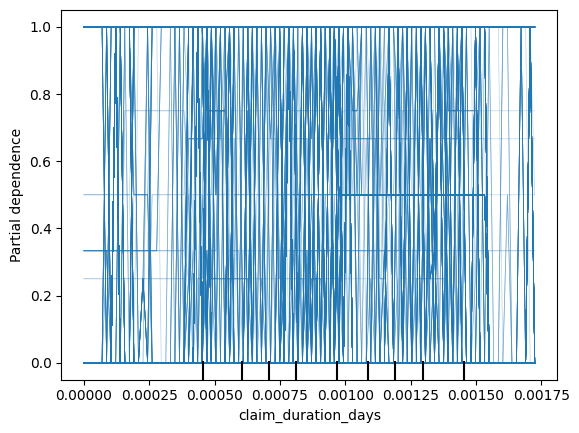

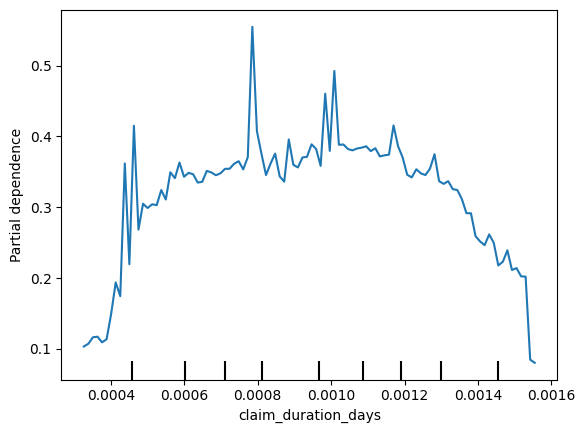

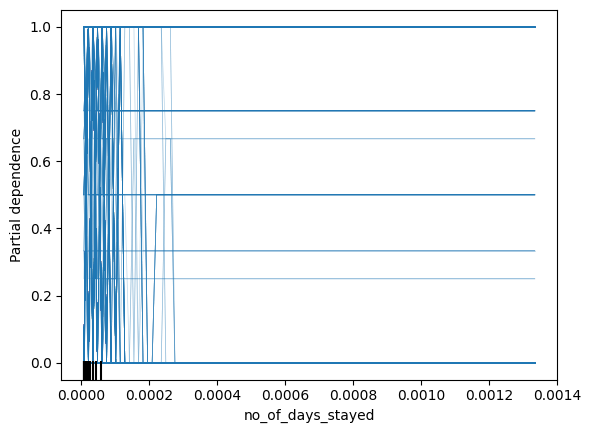

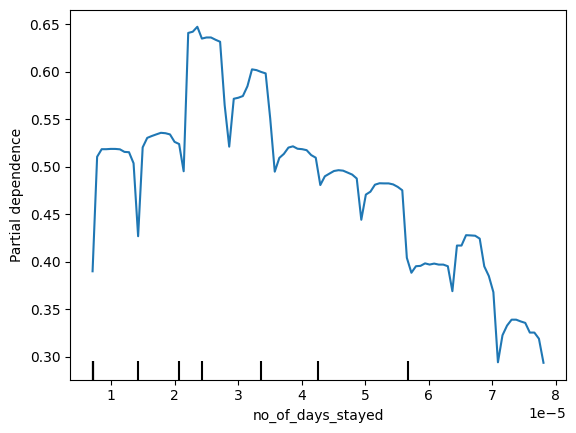

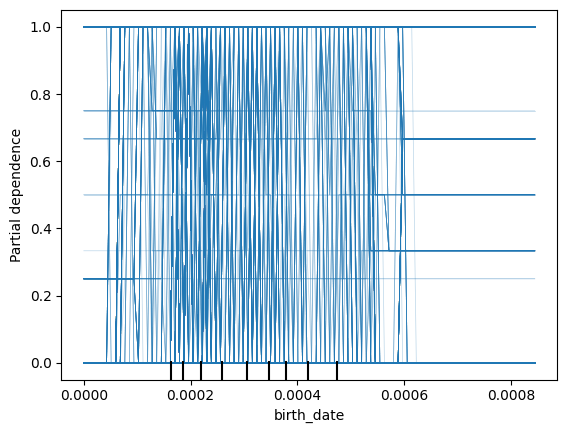

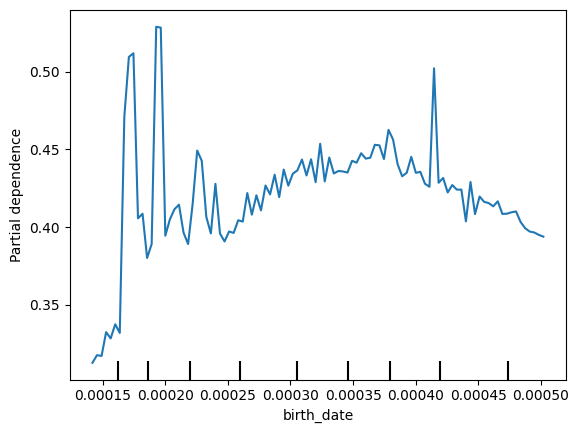

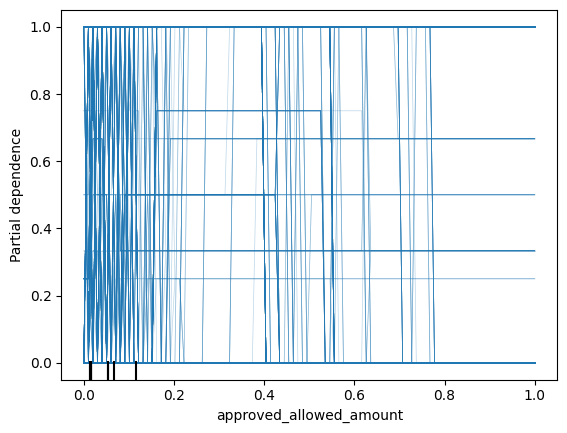

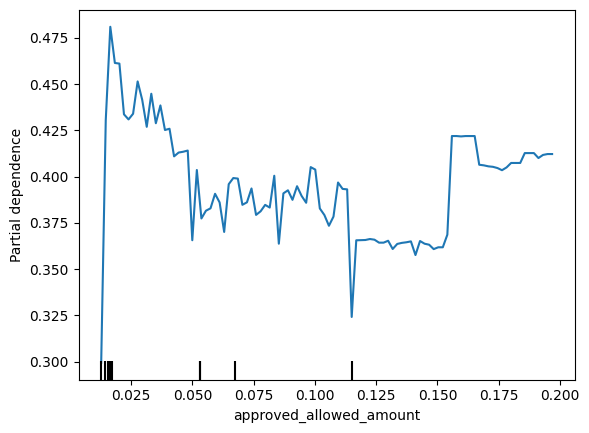

In [62]:
main_data=mwmote_w_triggers_train.drop('fraud',axis=1)                       ## change the data
l=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount']
for i in l:
    PartialDependenceDisplay.from_estimator(DT_mwmote_w_triggers,
                                            main_data,
                                            [i],
                                            kind='individual',
                                            percentiles = (0,1),
                                            centered= False)
    PartialDependenceDisplay.from_estimator(DT_mwmote_w_triggers,
                                            main_data,
                                            [i])

In [63]:
def caller(datatrain ,datatest):
    mainmodel=DecisionTree(datatrain,datatest)
    feature_importances = mainmodel.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    top_feature_indices = sorted_indices[:7]
    top_features = datatrain.columns[top_feature_indices]
    print("Top 7 features:", top_features)
    main_data=datatrain.drop('fraud',axis=1)                       ## change the data

    for i in top_features:
        PartialDependenceDisplay.from_estimator(mainmodel,
                                                main_data,
                                                [i],
                                                kind='individual',
                                                percentiles = (0,1),
                                                centered= False)



Confusion Matrix:
[[31140   664]
 [19876 11928]]
ROC AUC: 0.6779548538802809
PR AUC: 0.817631239297836
Accuracy: 0.6770846434410766
Precision: 0.9472681067344345
Recall: 0.37504716387875736
F1 Score: 0.5373457068204343
Top 7 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'birth_date',
       'no_of_days_stayed', 'approved_allowed_amount', 'distance',
       'primary_procedure_codeM100068'],
      dtype='object')


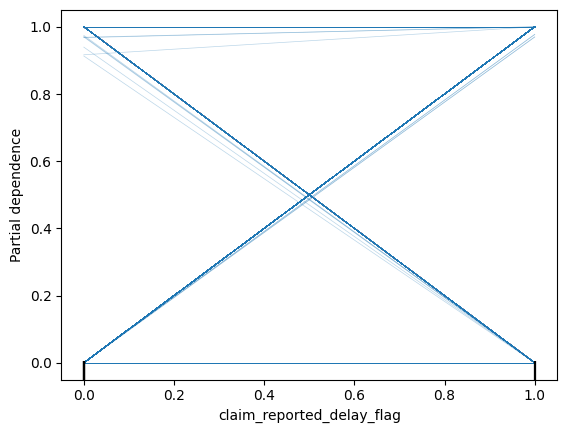

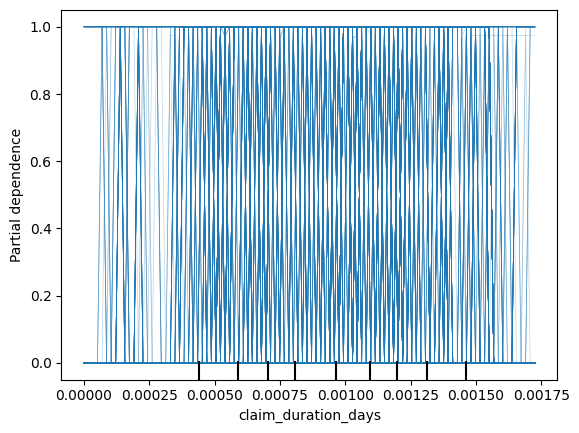

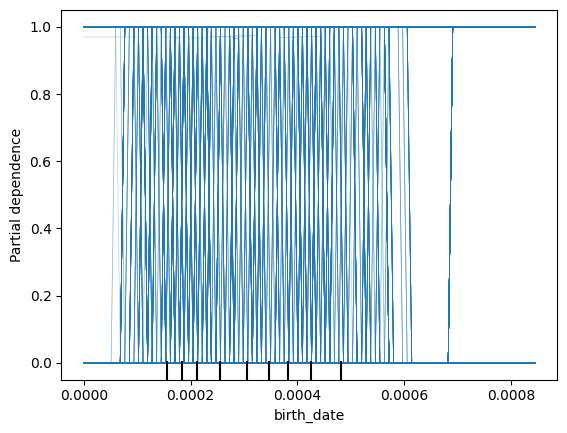

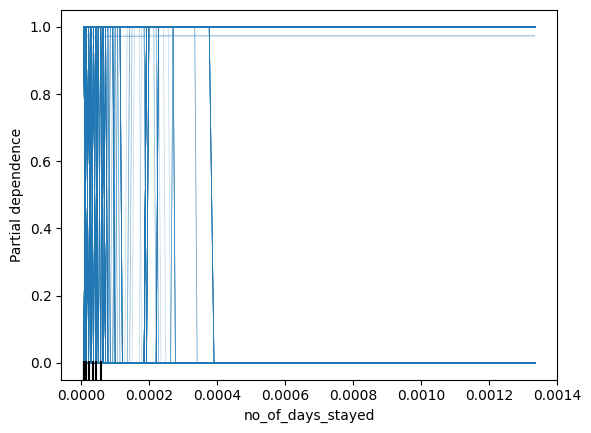

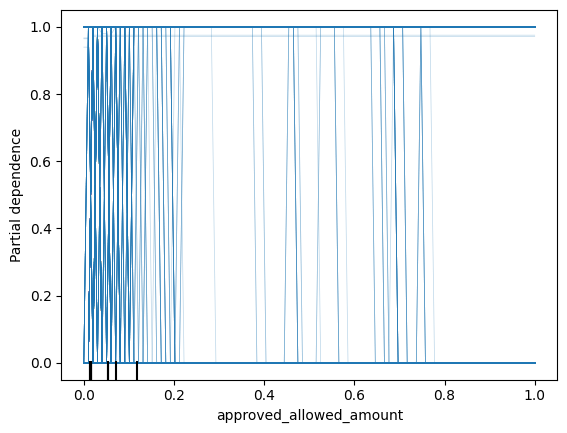

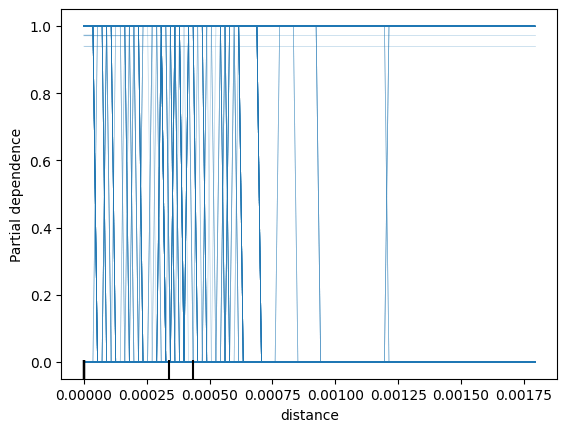

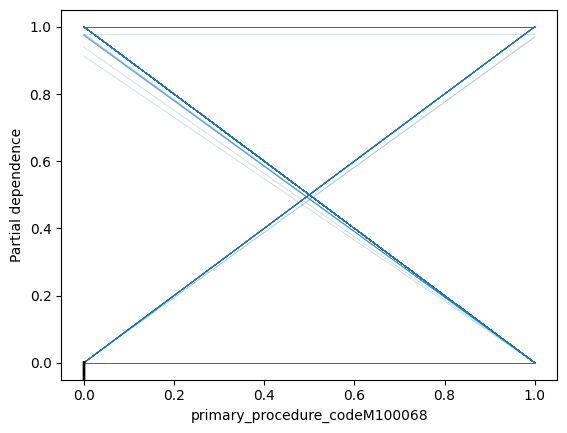

In [64]:
caller(rose_w_triggers_train,rose_w_triggers_test)

### Swaroop - Random Forest

In [68]:
def RandonForest(data_train,data_test):
            # Split the data into features and labels
            X_train = data_train.drop("fraud", axis=1)
            y_train = data_train["fraud"]
            X_test =  data_test.drop("fraud", axis=1)
            y_test =  data_test["fraud"]

            # Create and fit the Random Forest classifier
            classifier_rf = RandomForestClassifier(n_estimators=10, random_state=42)
            classifier_rf.fit(X_train, y_train)

            # Make predictions on the test set (probability of class 1)
            y_prob = classifier_rf.predict_proba(X_test)[:, 1]

            # Calculate ROC AUC
            roc_auc = roc_auc_score(y_test, y_prob)

            # Calculate PR AUC
            pr_auc = average_precision_score(y_test, y_prob)

            # Determine threshold using ROC curve
            fpr, tpr, thresholds = roc_curve(y_test, y_prob)
            optimal_idx = np.argmax(tpr - fpr)
            threshold = thresholds[optimal_idx]

            # Classify test set based on threshold
            y_pred = np.where(y_prob > threshold, 1, 0)

            # Compute confusion matrix
            cm = confusion_matrix(y_test, y_pred)

            # Print results
#             print("Confusion Matrix:")
#             print(cm)
#             print("ROC AUC:", roc_auc)
#             print("PR AUC:", pr_auc)

#             # Plot the ROC curve
#             plt.figure(figsize=(8, 6))
#             plt.plot(fpr, tpr, color='b', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
#             plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
#             plt.xlim([0.0, 1.0])
#             plt.ylim([0.0, 1.05])
#             plt.xlabel('False Positive Rate')
#             plt.ylabel('True Positive Rate')
#             plt.title('Receiver Operating Characteristic')
#             plt.legend(loc="lower right")
#             plt.show()

#             # Importance plot
#             importances = classifier_rf.feature_importances_
#             indices = np.argsort(importances)[::-1]
#             plt.figure(figsize=(10, 6))
#             plt.title("Feature Importance")
#             plt.bar(range(X_train.shape[1]), importances[indices], color="b", align="center")
#             plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
#             plt.xlim([-1, X_train.shape[1]])
#             plt.tight_layout()
#             plt.show()

            # Variable importance plot (top 10 features)
#             plt.figure(figsize=(10, 6))
#             plt.title("Top 10 Variable Importance")
#             plt.bar(range(10), importances[indices[:10]], color="b", align="center")
#             plt.xticks(range(10), X_train.columns[indices[:10]], rotation=90)
#             plt.xlim([-1, 10])
#             plt.tight_layout()
#             plt.show()


            return classifier_rf

In [69]:
def callerRandomforest(datatrain ,datatest):
    mainmodel=RandonForest(datatrain,datatest)
    feature_importances = mainmodel.feature_importances_
    sorted_indices = feature_importances.argsort()[::-1]
    top_feature_indices = sorted_indices[:5]
    top_features = datatrain.columns[top_feature_indices]
    print("Top 5 features:", top_features)
    main_data=datatrain.drop('fraud',axis=1)                       ## change the data

    for i in top_features:
        PartialDependenceDisplay.from_estimator(mainmodel,
                                                main_data,
                                                [i],
                                                kind='both',
                                                # percentiles = (0,1),
                                                ice_lines_kw={"color": "black"},
                                                pd_line_kw={"color": "red","lw":2,'linestyle':'--'},

                                                )

Top 5 features: Index(['hospital_distance_flag', 'birth_date', 'claim_duration_days',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


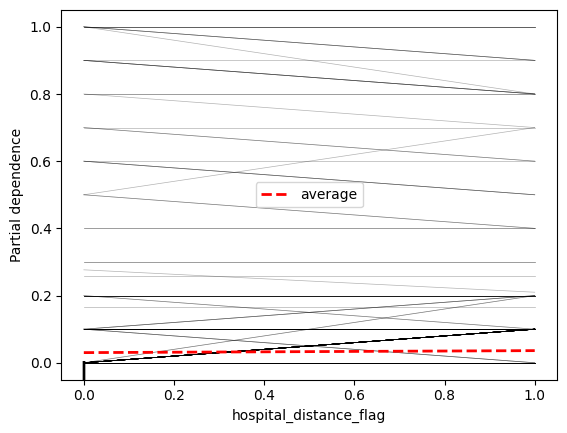

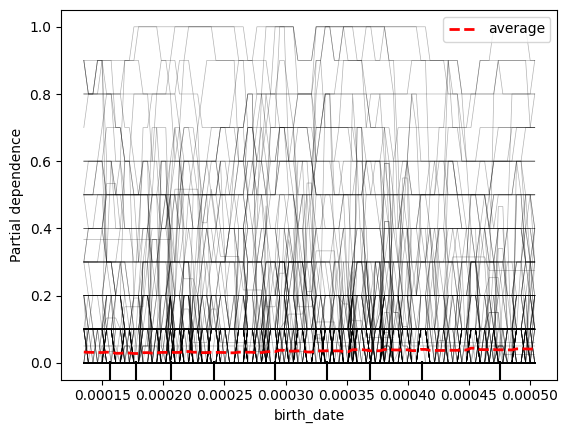

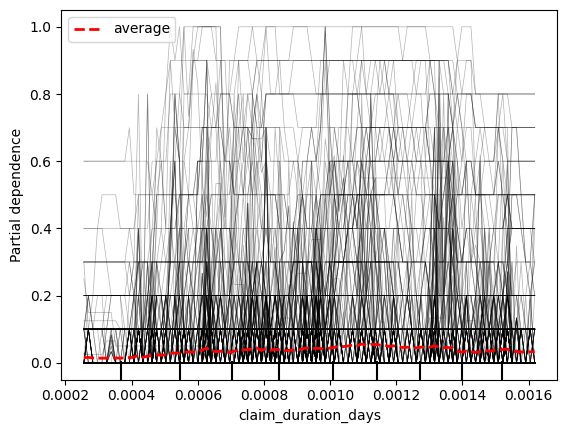

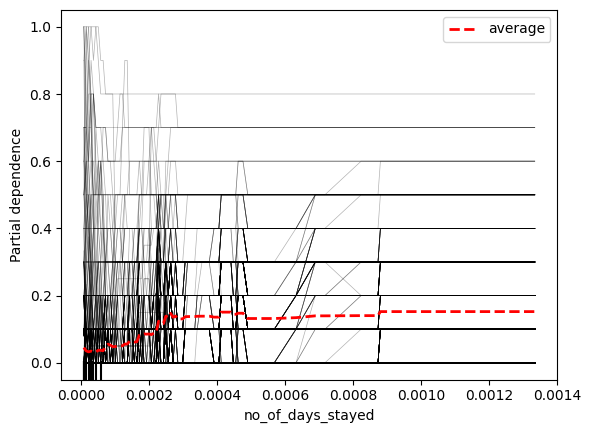

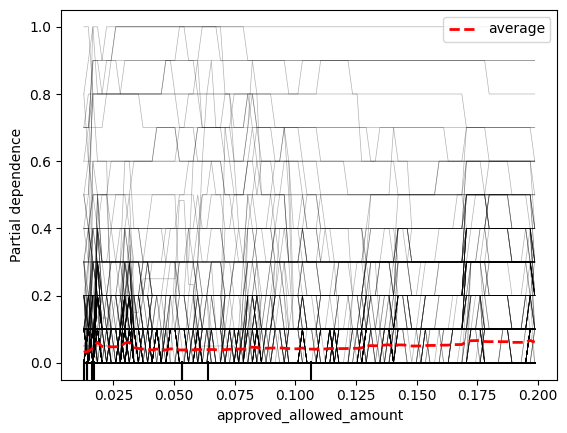

In [70]:
callerRandomforest(data_w_triggers_train,data_w_triggers_test)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'birth_date',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


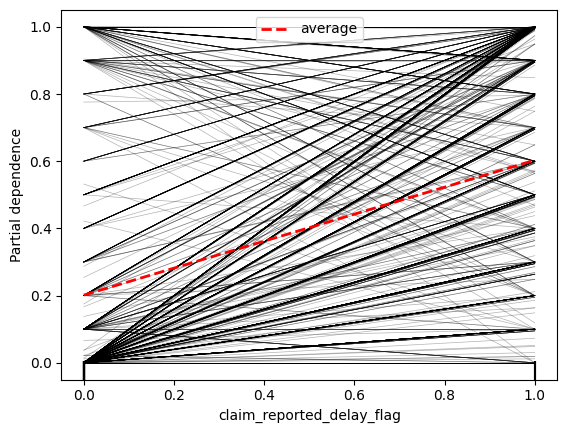

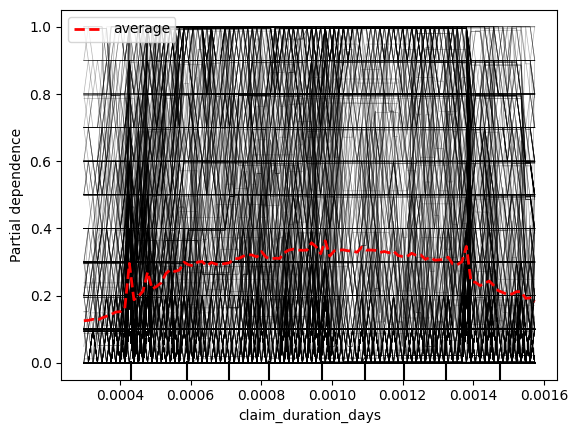

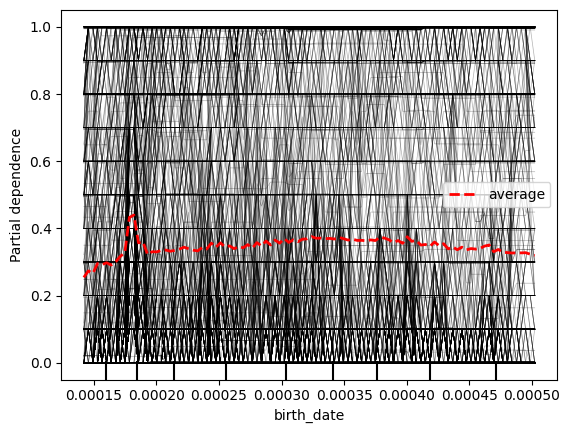

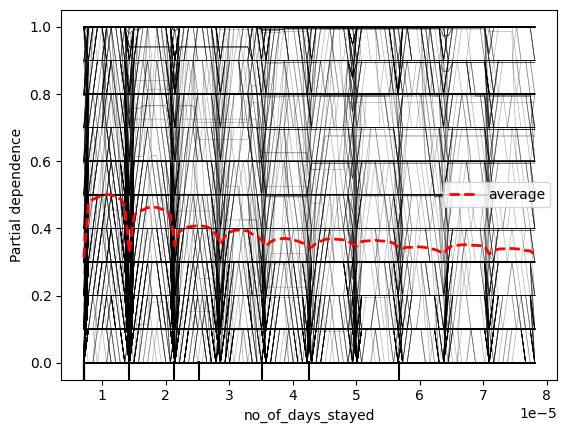

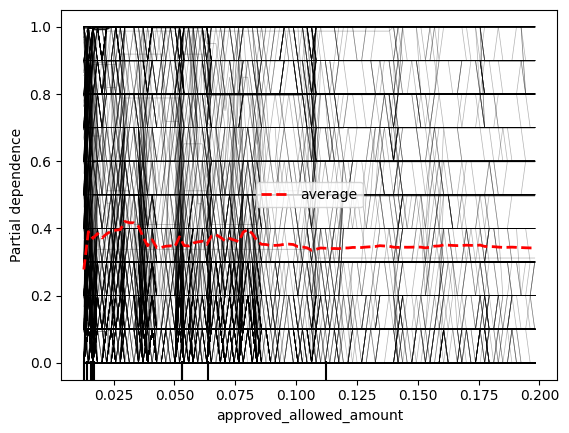

In [71]:
callerRandomforest(smote_w_triggers_train,smote_w_triggers_test)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'birth_date',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


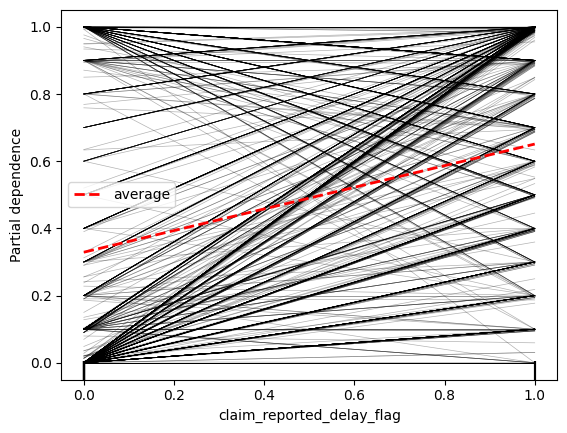

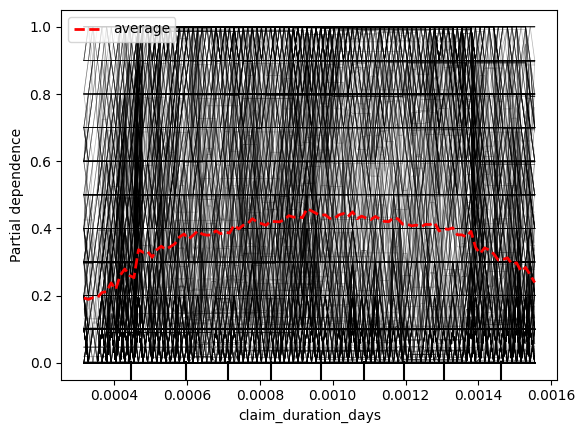

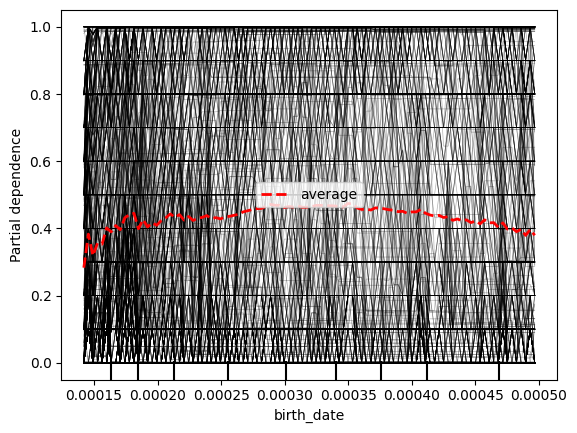

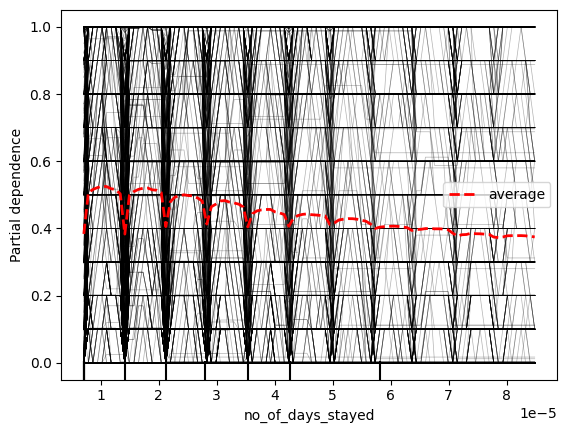

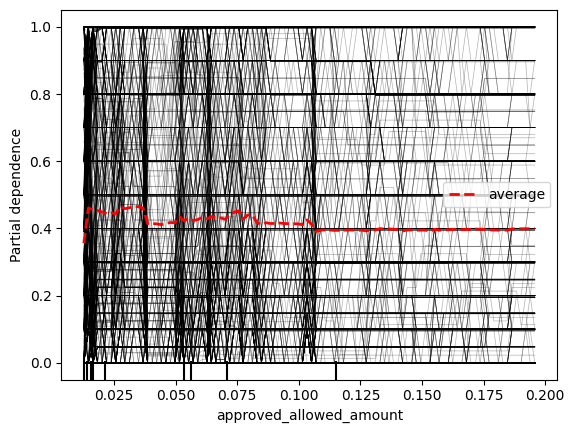

In [72]:
callerRandomforest(adasyn_w_triggers_train,adasyn_w_triggers_test)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'birth_date',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


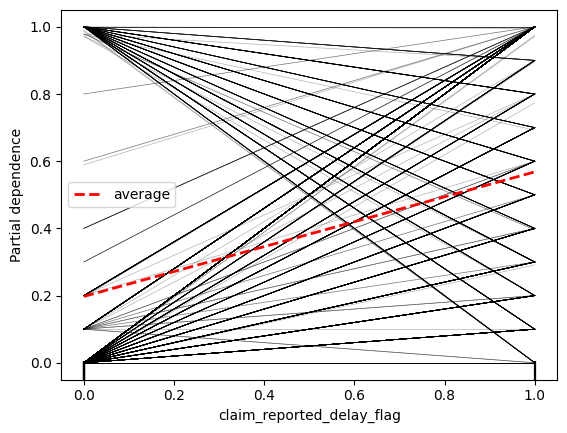

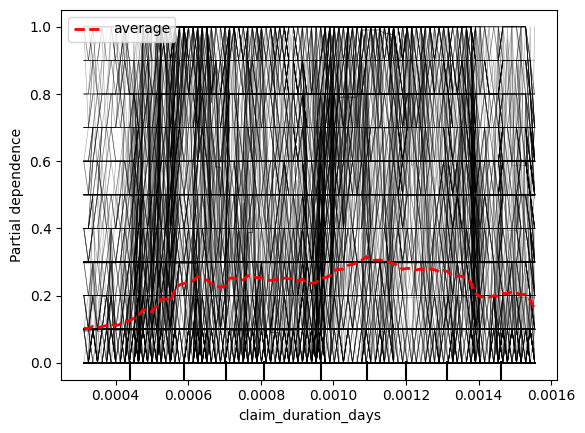

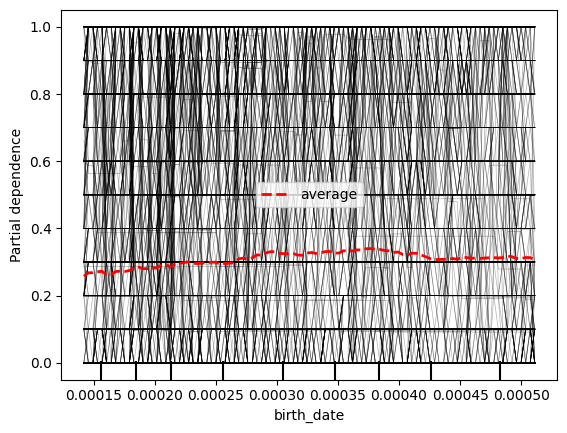

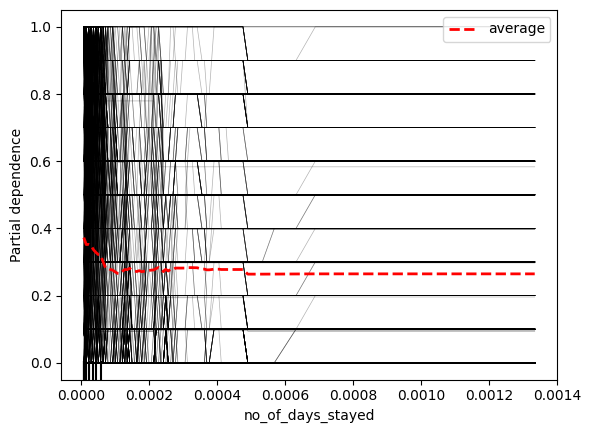

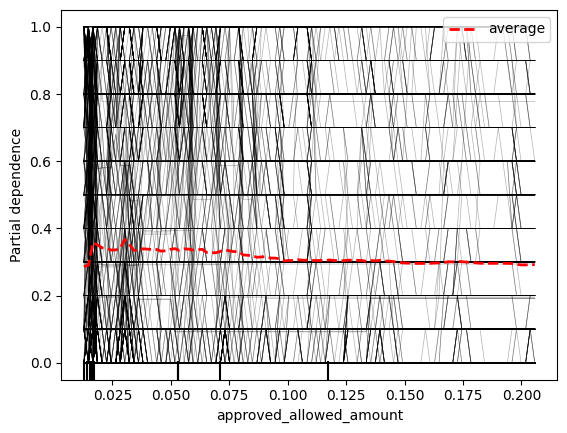

In [73]:
callerRandomforest(rose_w_triggers_train,rose_w_triggers_test)

Top 5 features: Index(['claim_reported_delay_flag', 'claim_duration_days', 'birth_date',
       'no_of_days_stayed', 'approved_allowed_amount'],
      dtype='object')


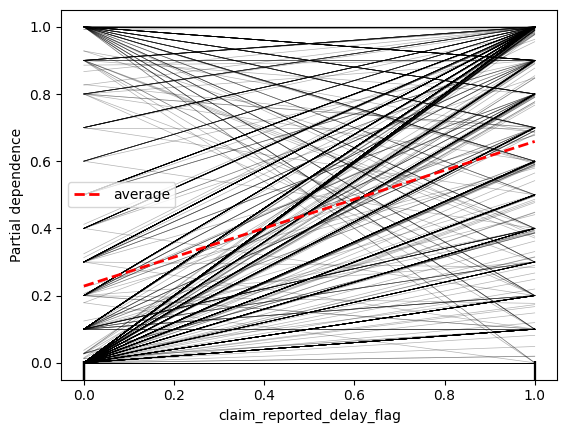

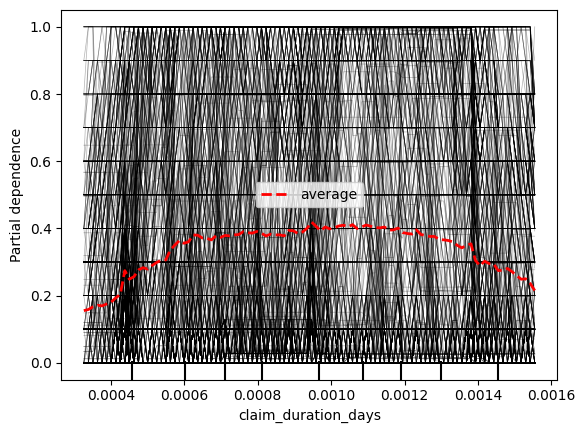

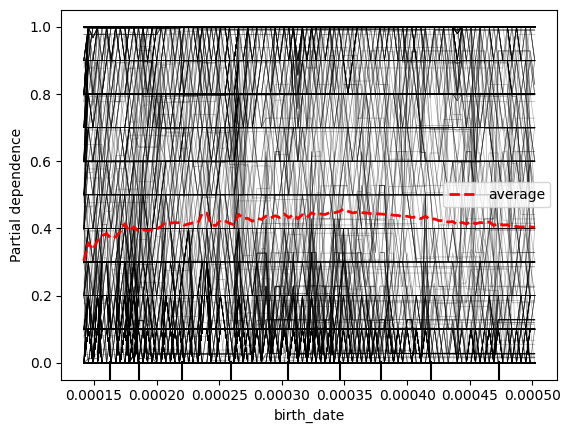

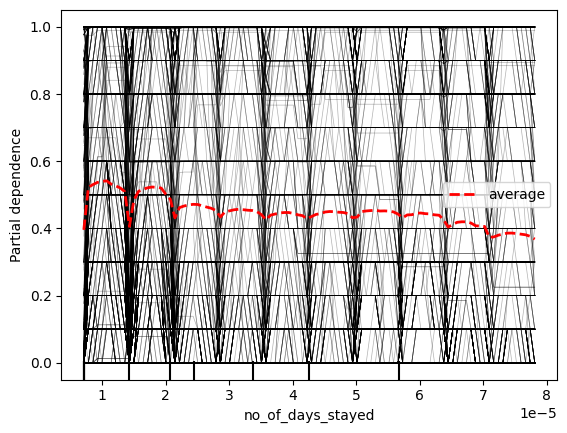

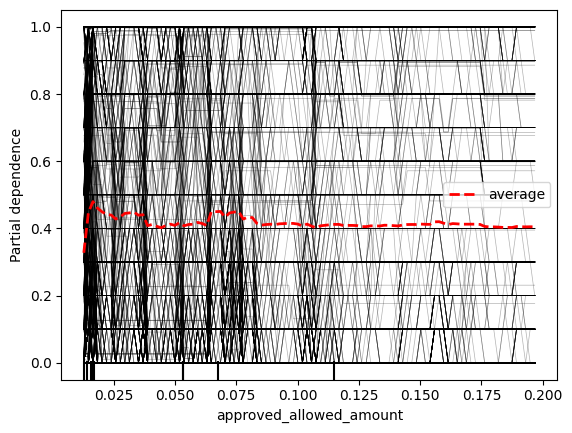

In [74]:
callerRandomforest(mwmote_w_triggers_train,mwmote_w_triggers_test)

In [75]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [76]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from imblearn.over_sampling import ADASYN
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

In [77]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [78]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence

In [79]:
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score

In [80]:
import pandas as pd

pd.set_option("display.max_columns", 100)

In [81]:
data_w_triggers = pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/pdata_w_triggers.csv")

In [82]:
indexes = pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/TrainingIndex_list.csv")

In [83]:
myindx=indexes.iloc[0].tolist()

In [84]:
myindx1=[i-1 for i in myindx]
# myindx1

In [85]:
data_w_triggers_train = data_w_triggers.iloc[myindx1]
data_w_triggers_test= data_w_triggers.iloc[~data_w_triggers.index.isin(myindx1)]

In [86]:
# adasyn_w_triggers_test= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/adasyn_w_triggers_test.csv")
# smote_w_triggers_test= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/smote_w_triggers_test.csv")
# rose_w_triggers_test= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/rose_w_triggers_test.csv")
# mwmote_w_triggers_test= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/mwmote_w_triggers_test.csv")

In [87]:
# adasyn_w_triggers_train= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/adasyn_w_triggers_train.csv")
# smote_w_triggers_train= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/smote_w_triggers_train.csv")
# rose_w_triggers_train= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/rose_w_triggers_train.csv")
# mwmote_w_triggers_train= pd.read_csv("/content/drive/MyDrive/Colab Workspace /MY CAS/mwmote_w_triggers_train.csv")

In [88]:
!pip install pdpbox
from pdpbox import pdp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 42.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 104.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.1/121.1 kB 18.3 MB/s eta 0:00:00


In [89]:
pip install plotly

In [90]:
%matplotlib inline

In [91]:
import pandas as pd
import numpy as np
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_auc_score, average_precision_score, confusion_matrix, roc_curve, auc, precision_recall_curve
import xgboost as xgb

In [92]:
# # Prepare the training and testing data
# X_train = adasyn_wo_triggers_train.drop('fraud', axis=1)
# y_train =adasyn_wo_triggers_train['fraud']
# X_test = adasyn_wo_triggers_test.drop('fraud', axis=1)
# y_test = adasyn_wo_triggers_test['fraud']

# # Fit the GBM model
# gbm_model = GradientBoostingClassifier(n_estimators=100, loss='exponential')
# gbm_model.fit(X_train, y_train)

# # Testing Set Predictions
# test_prob = gbm_model.predict_proba(X_test)[:, 1]
# print(test_prob)

# # Get the ROC AUC
# roc_auc = roc_auc_score(y_test, test_prob)
# print(roc_auc)
# # Get the PR AUC
# pr_auc = average_precision_score(y_test, test_prob,pos_label=0)
# print(pr_auc)

In [93]:
def GBM(data_train,data_test):
            # Split the data into features and labels
            X_train = data_train.drop("fraud", axis=1)
            y_train = data_train["fraud"]
            X_test =  data_test.drop("fraud", axis=1)
            y_test =  data_test["fraud"]

            # # Create and fit the Random Forest classifier
            # classifier_rf = RandomForestClassifier(n_estimators=100, random_state=42)
            # classifier_rf.fit(X_train, y_train)
            gbm_model = xgb.XGBClassifier()
            gbm_model.fit(X_train, y_train)

            # Make predictions on the test set (probability of class 1)
            y_prob = gbm_model.predict_proba(X_test)[:, 1]
            print(y_prob)

            # Calculate ROC AUC
            roc_auc = roc_auc_score(y_test, y_prob)

            # Calculate PR AUC
            pr_auc = average_precision_score(y_test, y_prob)

            # Determine threshold using ROC curve
            fpr, tpr, thresholds = roc_curve(y_test, y_prob)
            optimal_idx = np.argmax(tpr - fpr)
            threshold = thresholds[optimal_idx]

            # Classify test set based on threshold
            y_pred = np.where(y_prob > threshold, 1, 0)

            # Compute confusion matrix
            cm = confusion_matrix(y_test, y_pred)




            return gbm_model

In [94]:
def callerGBM(datatrain ,datatest):
    mainmodel=GBM(datatrain,datatest)
    # feature_importances = mainmodel.feature_importances_
    # sorted_indices = feature_importances.argsort()[::-1]
    # top_feature_indices = sorted_indices[:5]
    # top_features = datatrain.columns[top_feature_indices]
    # print("Top 5 features:", top_features)
    top_features=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount','distance']
    main_data=datatrain.drop('fraud',axis=1)                       ## change the data

    for i in top_features:
        PartialDependenceDisplay.from_estimator(mainmodel,
                                                main_data,
                                                [i],
                                                kind='both',
                                                # percentiles = (0,1),
                                                ice_lines_kw={"color": "black"},
                                                pd_line_kw={"color": "red","lw":2,'linestyle':'--'},
                                                centered= True
                                                )
        # PartialDependenceDisplay.from_estimator(mainmodel,
        #                                     main_data,
        #                                     [i])


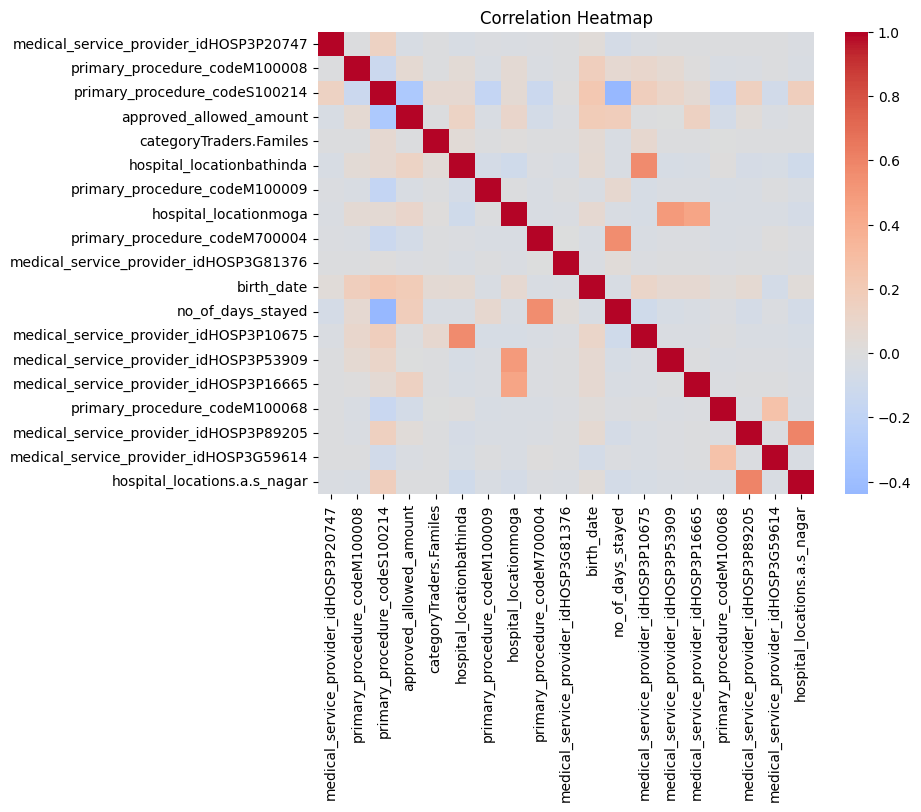

In [96]:
# callerGBM(data_wo_triggers_train,data_wo_triggers_test)
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# correlation_matrix = smote_wo_triggers_train.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()

### GLM - siddu


In [97]:
from sklearn.linear_model import LogisticRegression

def get_glm(train_data, test_data):

  # Splitting data
  X_train = train_data.drop("fraud", axis= 1)
  y_train = train_data["fraud"]
  X_test = test_data.drop("fraud", axis= 1)
  y_test = test_data["fraud"]


  # fit the GLM model using LogisticRegression from SKlearn
  model = LogisticRegression(solver= 'liblinear')
  model.fit(X_train, y_train)

  return model

In [98]:
def callerGLM(datatrain ,datatest):
    mainmodel=get_glm(datatrain,datatest)
    # feature_importances = mainmodel.feature_importances_
    # sorted_indices = feature_importances.argsort()[::-1]
    # top_feature_indices = sorted_indices[:5]
    # top_features = datatrain.columns[top_feature_indices]
    # print("Top 5 features:", top_features)
    top_features=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount','distance']
    main_data=datatrain.drop('fraud',axis=1)                       ## change the data

    for i in top_features:
        # PartialDependenceDisplay.from_estimator(mainmodel,
        #                                         main_data,
        #                                         [i],
        #                                         kind='individual',
        #                                         percentiles = (0,1),
        #                                         centered= True)
        PartialDependenceDisplay.from_estimator(mainmodel,
                                            main_data,
                                            [i])

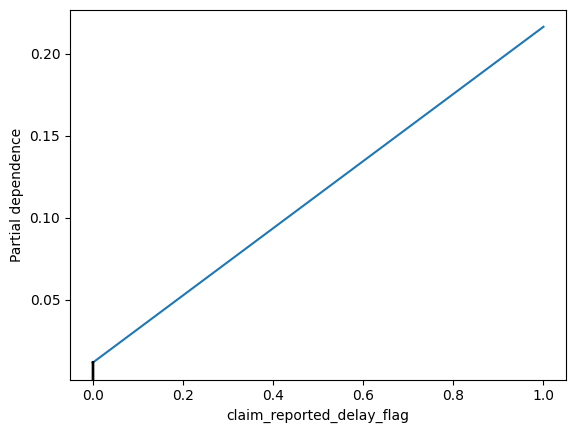

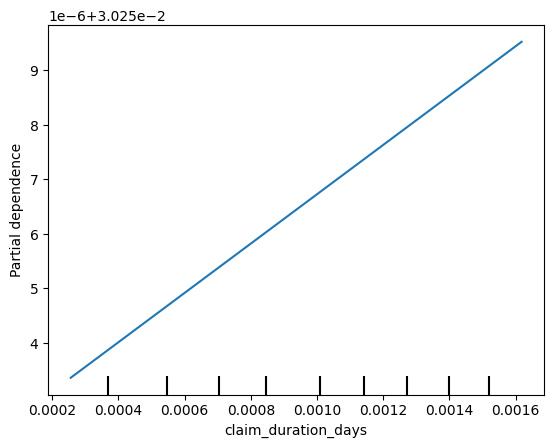

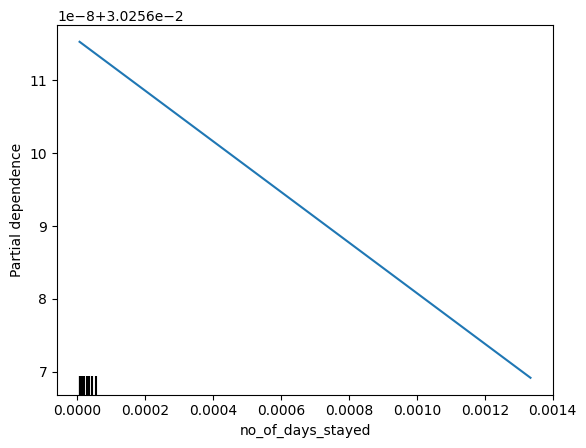

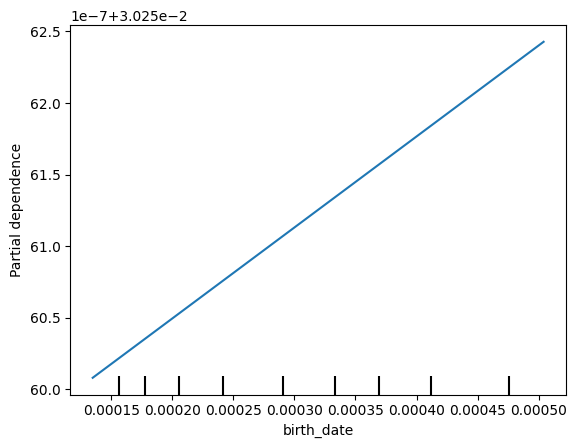

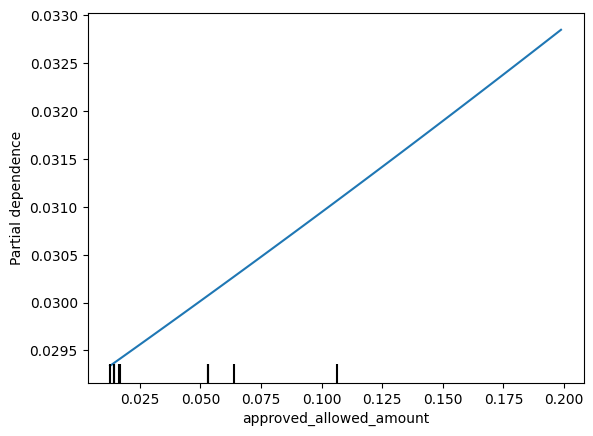

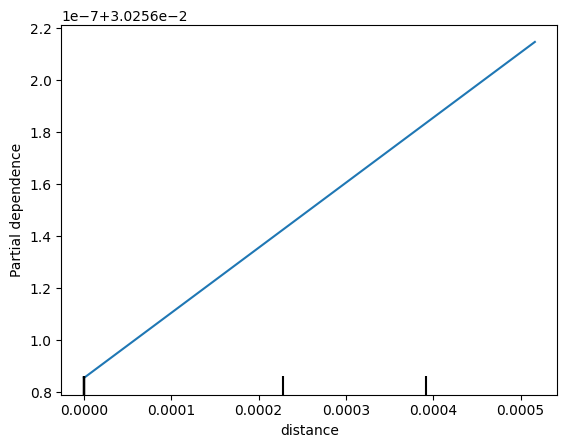

In [99]:
callerGLM(data_w_triggers_train,data_w_triggers_test)

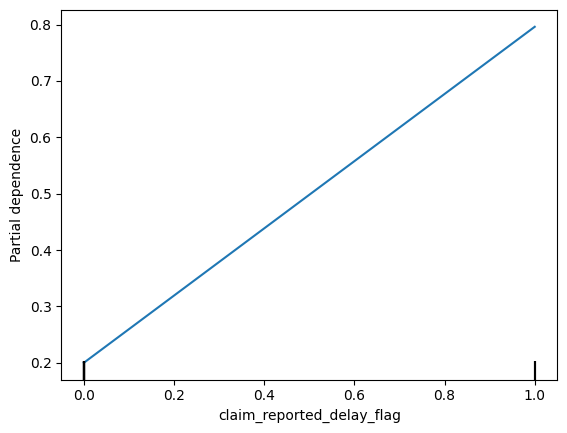

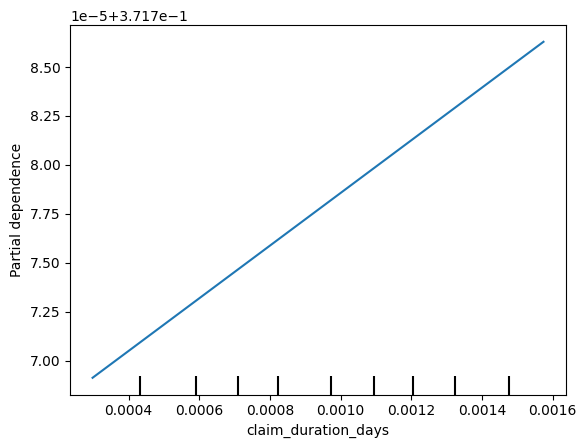

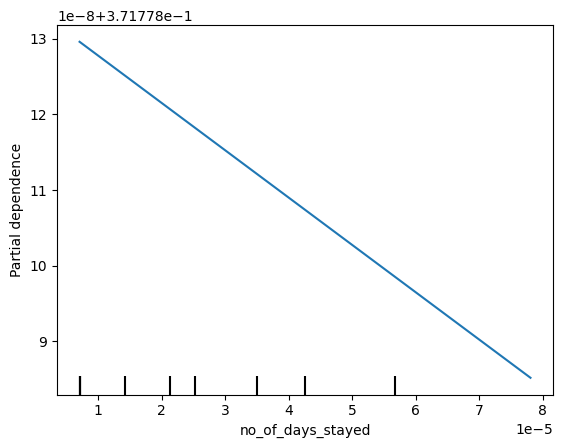

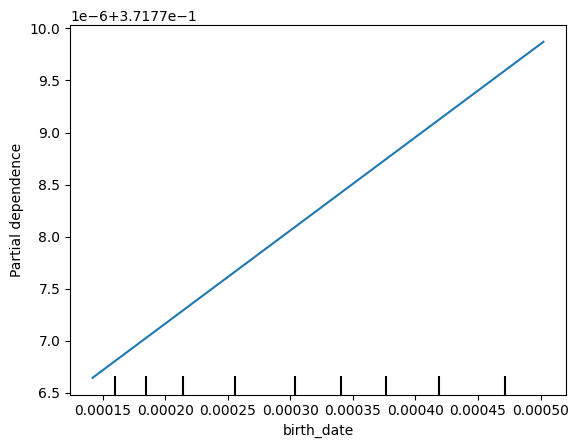

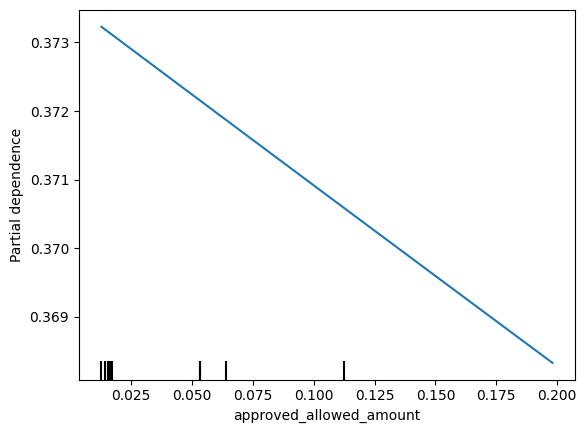

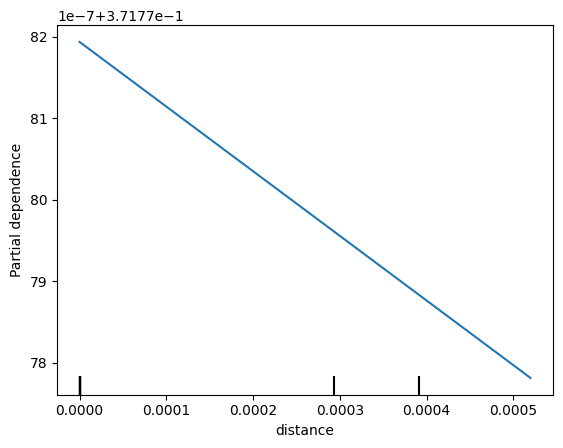

In [100]:
callerGLM(smote_w_triggers_train,smote_w_triggers_test)

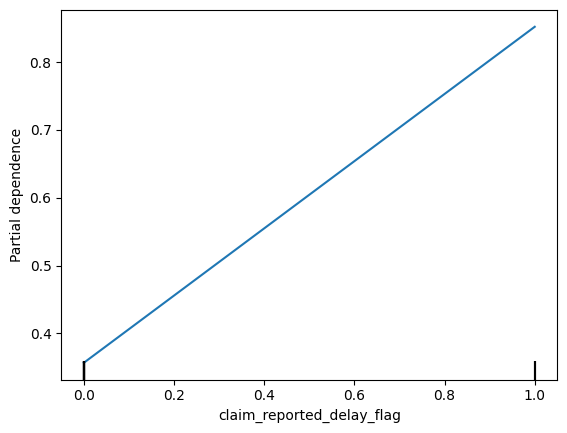

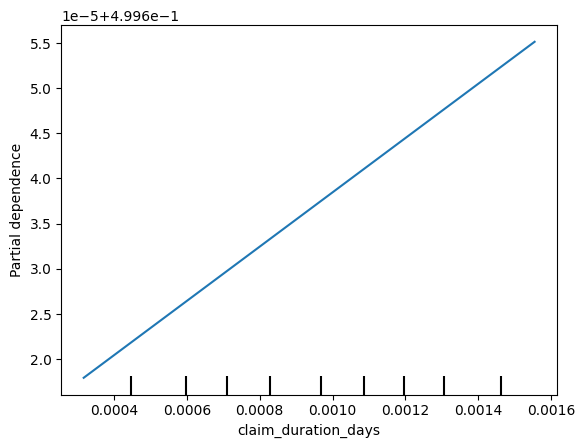

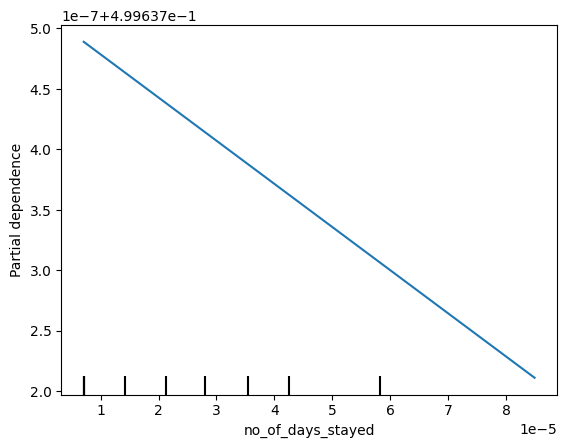

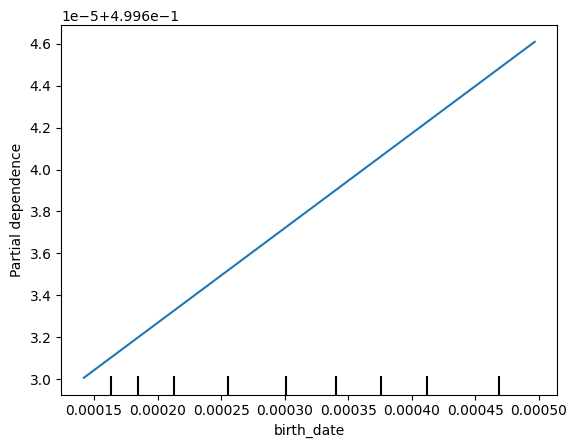

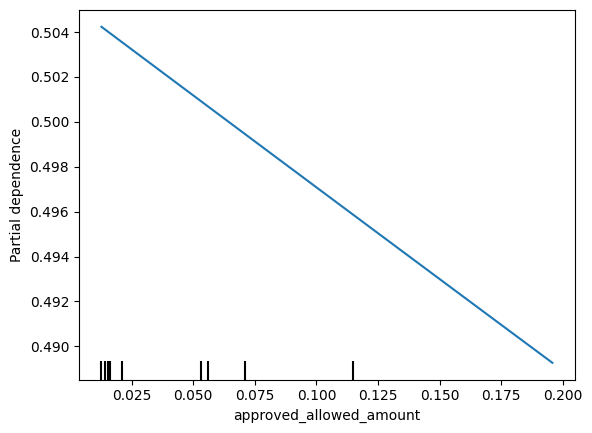

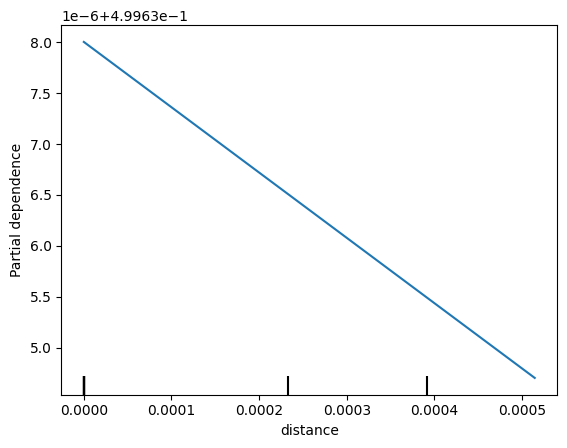

In [101]:
callerGLM(adasyn_w_triggers_train,adasyn_w_triggers_test)

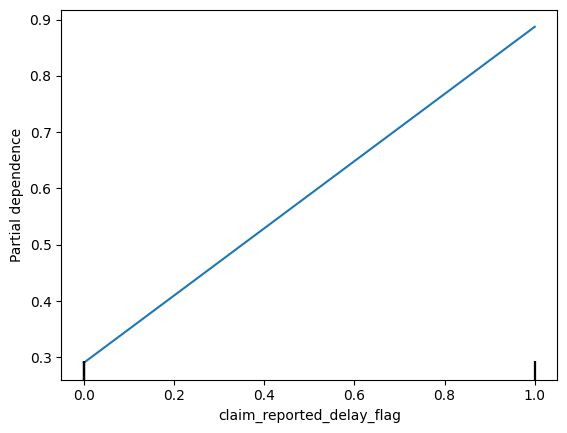

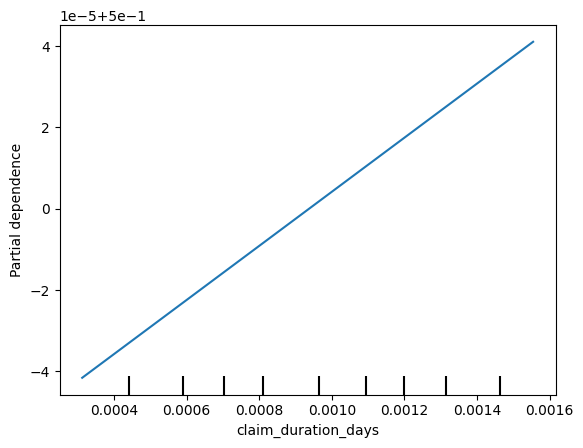

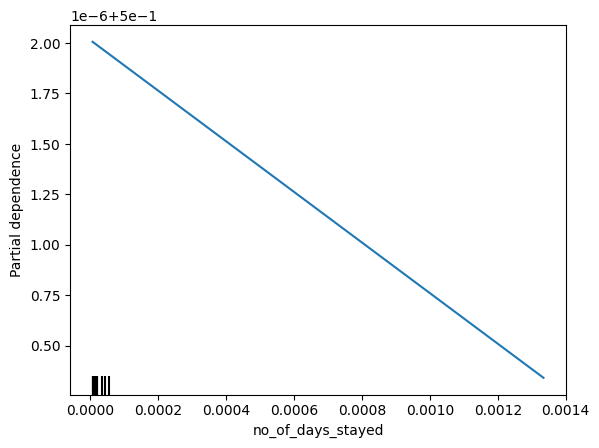

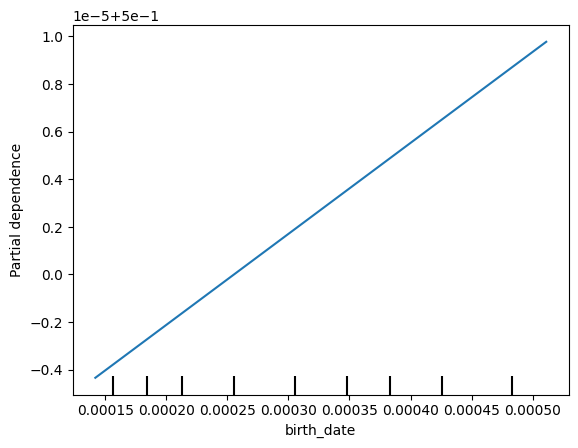

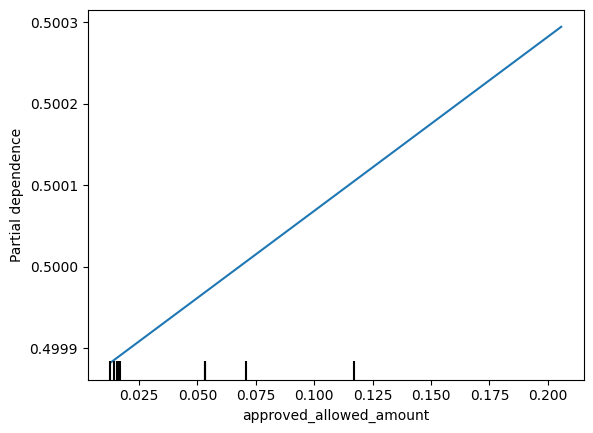

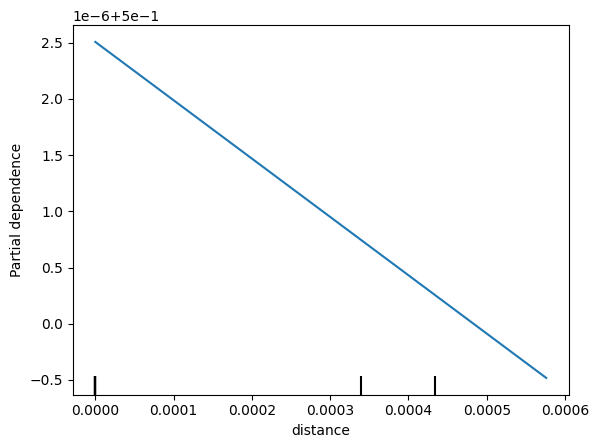

In [102]:
callerGLM(rose_w_triggers_train,rose_w_triggers_test)

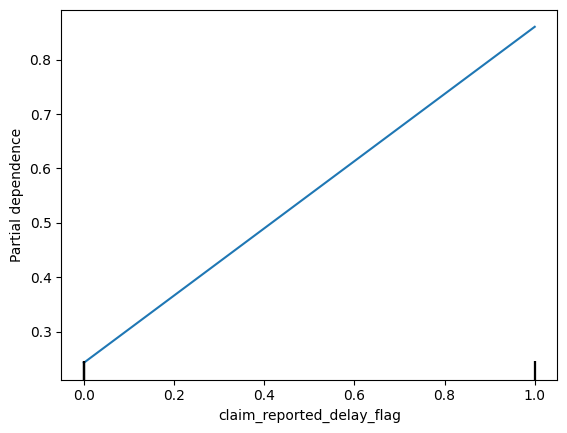

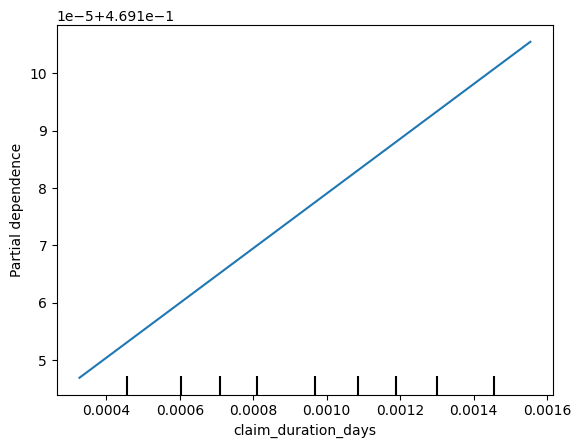

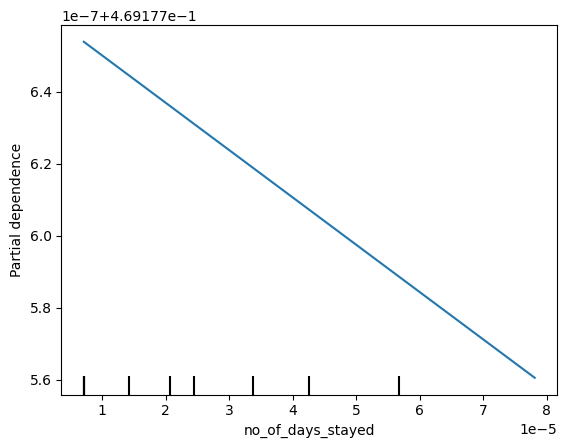

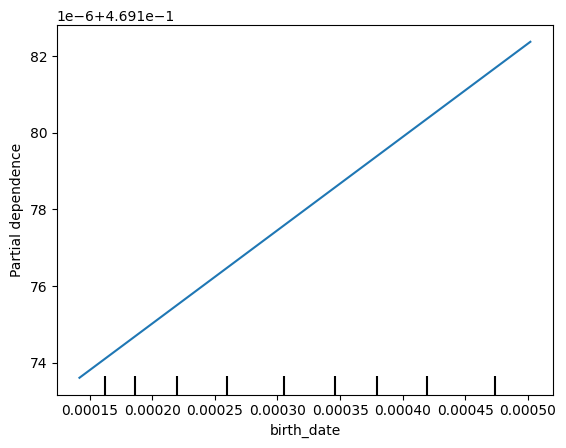

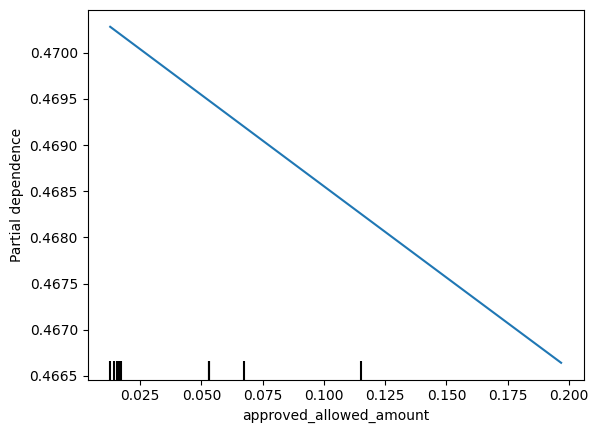

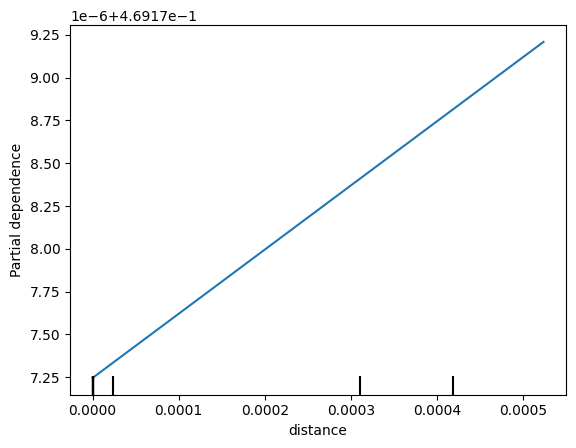

In [103]:
callerGLM(mwmote_w_triggers_train,mwmote_w_triggers_test)

### NAive Bayes - siddu


In [104]:
from sklearn.naive_bayes import MultinomialNB

def get_nb(train_data, test_data):

  # Splitting data
  X_train = train_data.drop("fraud", axis= 1)
  y_train = train_data["fraud"]
  X_test = test_data.drop("fraud", axis= 1)
  y_test = test_data["fraud"]


  # fit the Multimonial Naive Bayes model from SKlearn
  model = MultinomialNB()
  model.fit(X_train, y_train)

  return model

In [105]:
def callerNB(datatrain ,datatest):
    mainmodel=get_nb(datatrain,datatest)
    # feature_importances = mainmodel.feature_importances_
    # sorted_indices = feature_importances.argsort()[::-1]
    # top_feature_indices = sorted_indices[:5]
    # top_features = datatrain.columns[top_feature_indices]
    # print("Top 5 features:", top_features)
    top_features=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount','distance']
    main_data=datatrain.drop('fraud',axis=1)                       ## change the data

    for i in top_features:
        # PartialDependenceDisplay.from_estimator(mainmodel,
        #                                         main_data,
        #                                         [i],
        #                                         kind='individual',
        #                                         percentiles = (0,1),
        #                                         centered= True)
        PartialDependenceDisplay.from_estimator(mainmodel,
                                            main_data,
                                            [i])

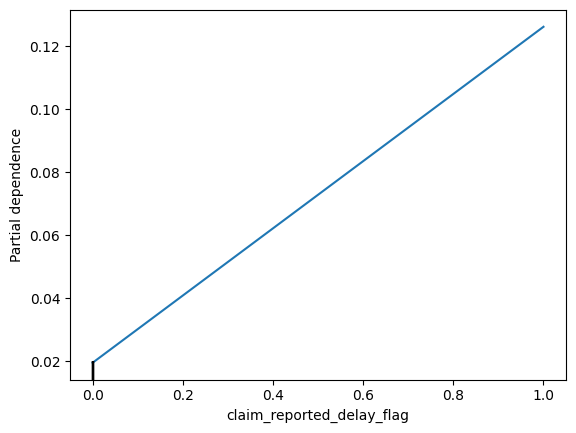

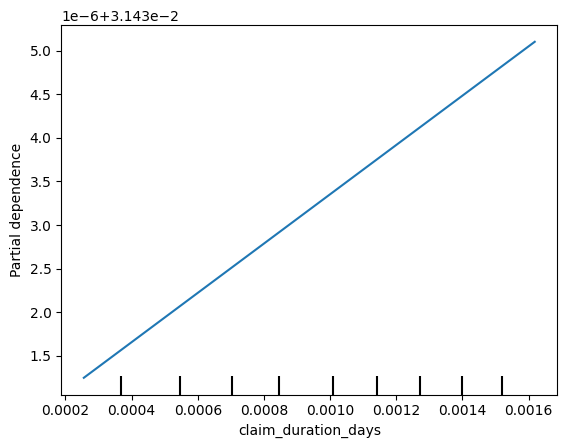

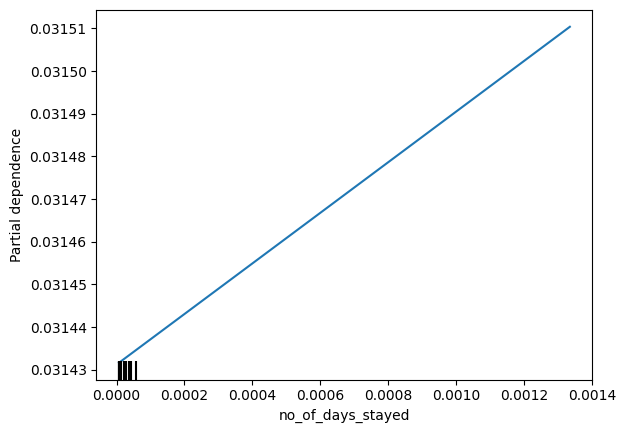

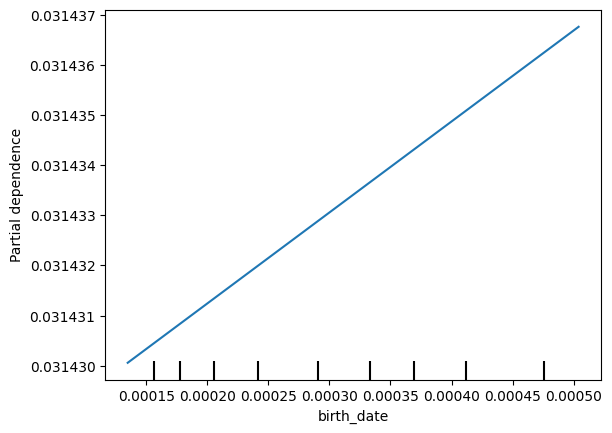

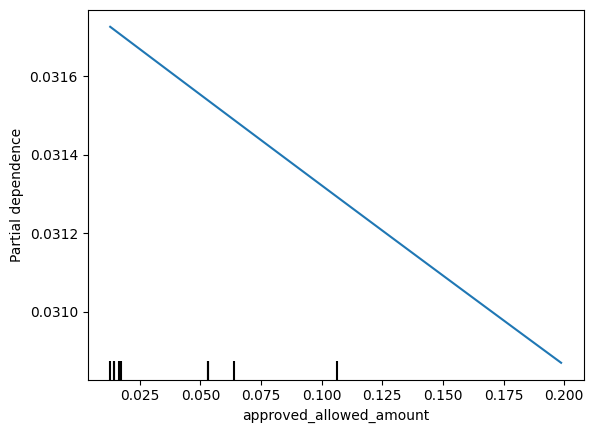

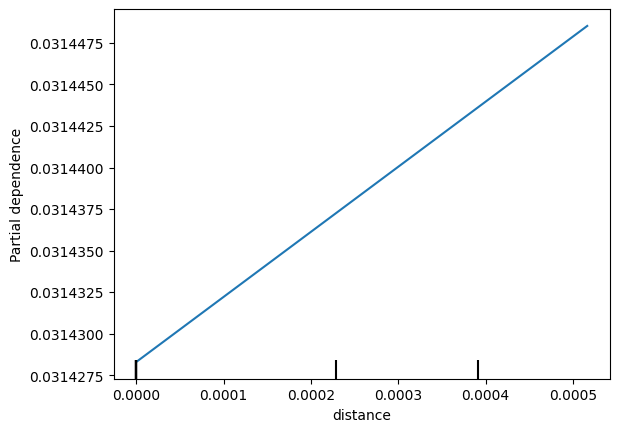

In [106]:
callerNB(data_w_triggers_train,data_w_triggers_test)

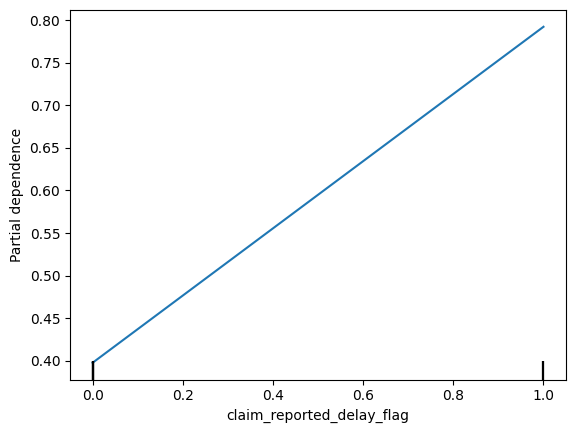

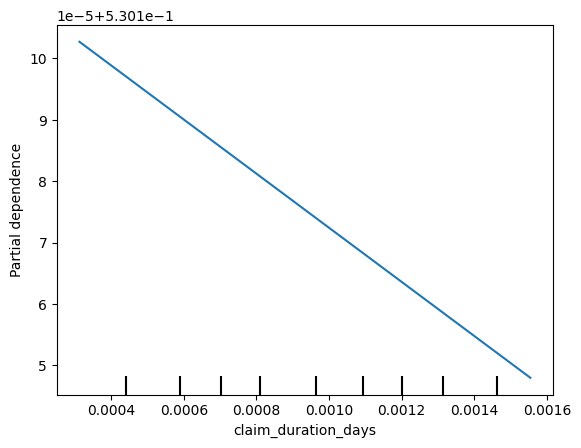

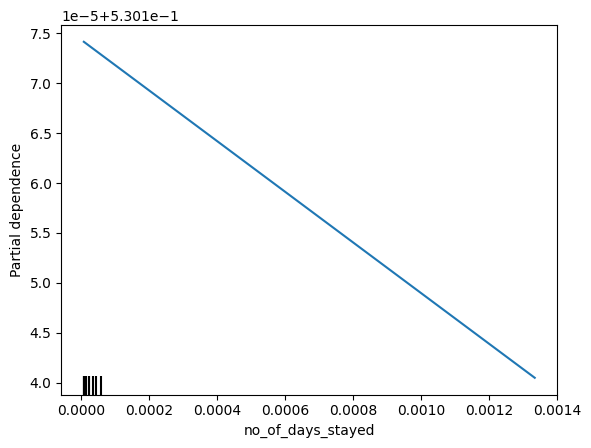

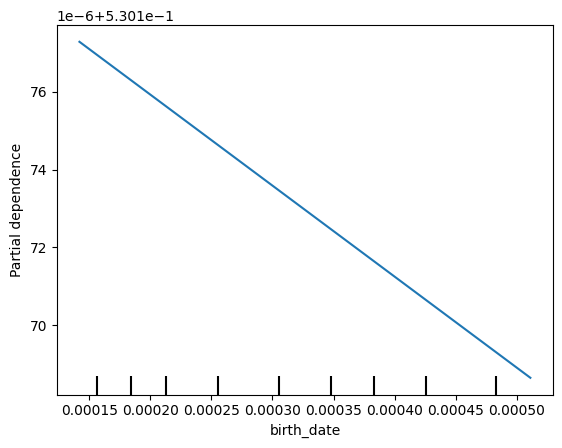

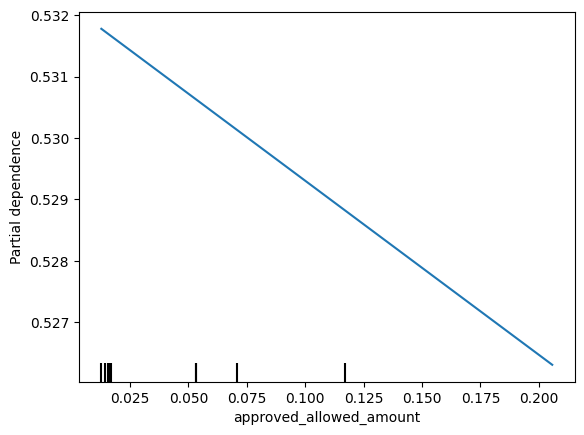

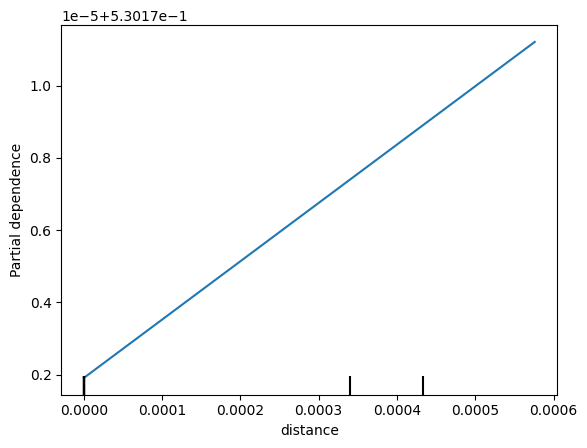

In [107]:
callerNB(rose_w_triggers_train,rose_w_triggers_test)


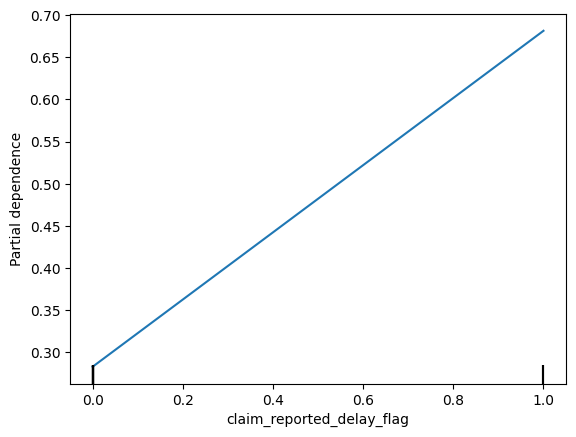

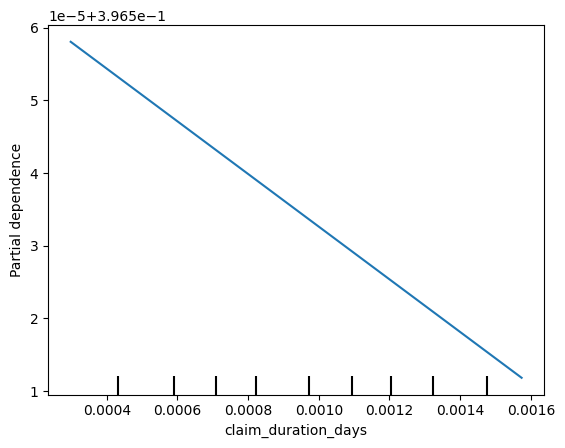

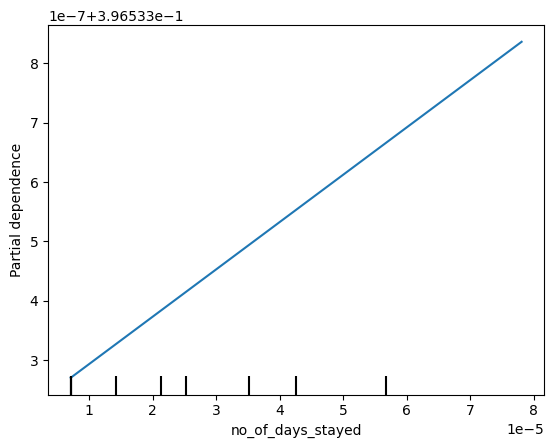

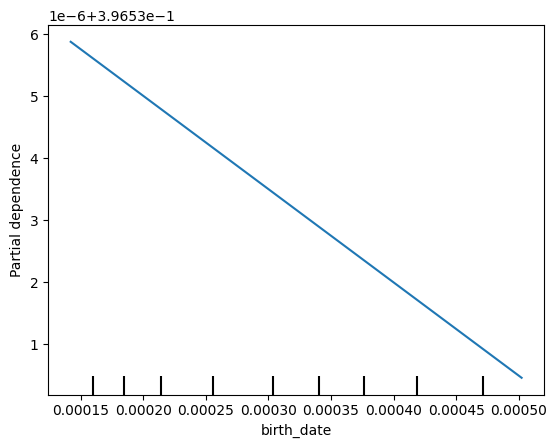

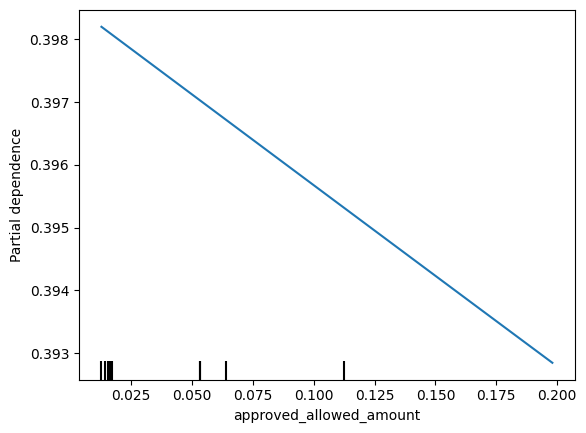

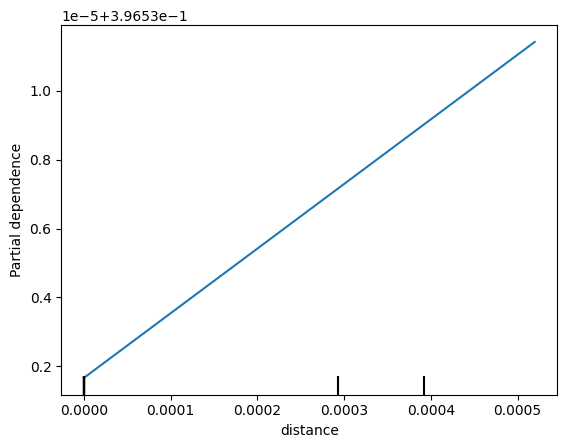

In [108]:
callerNB(smote_w_triggers_train,smote_w_triggers_test)


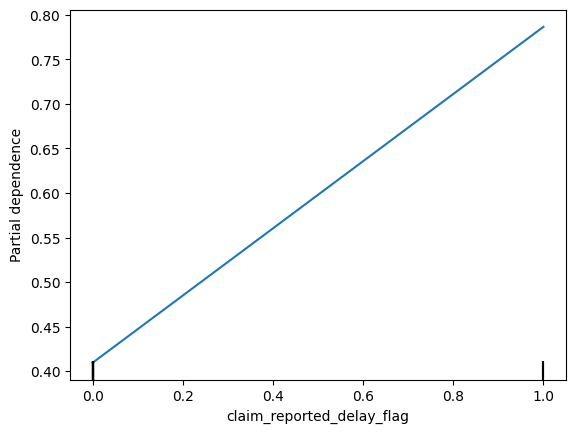

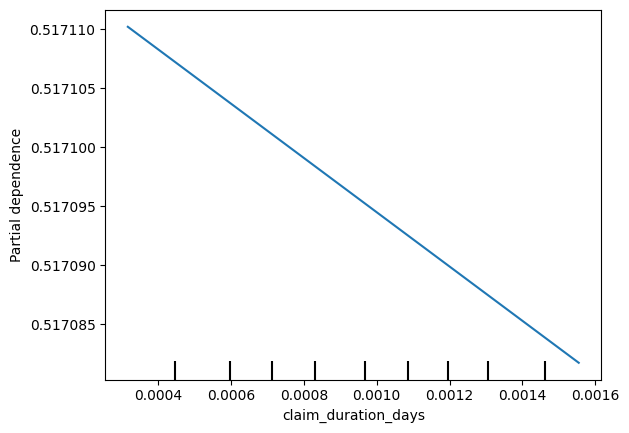

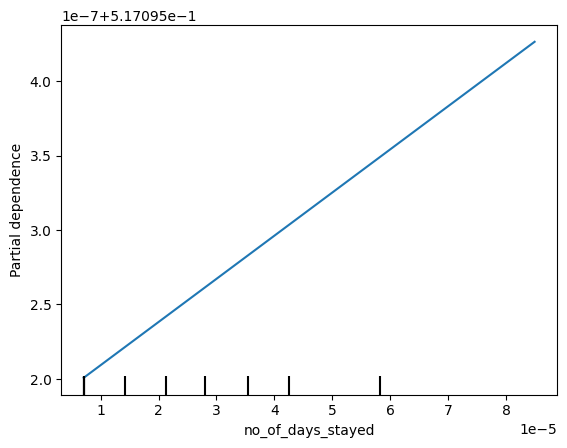

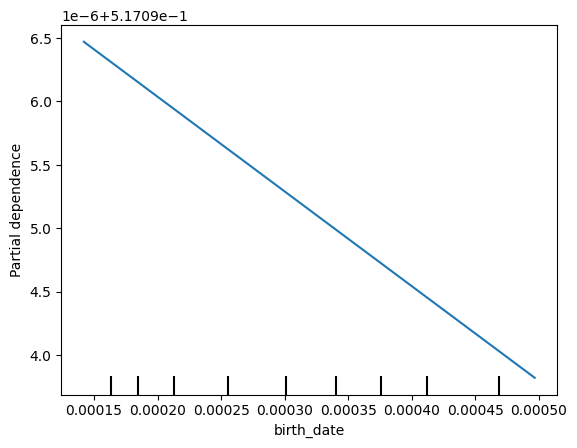

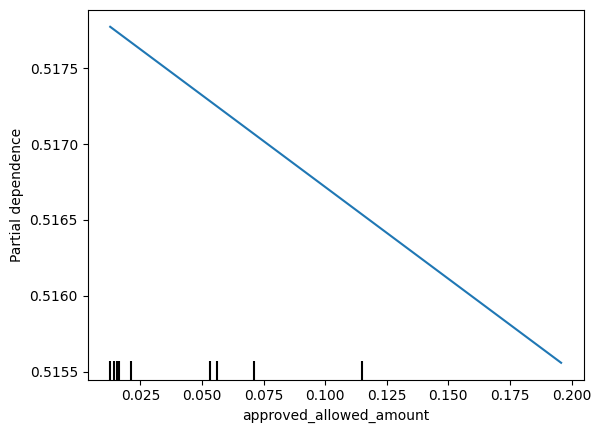

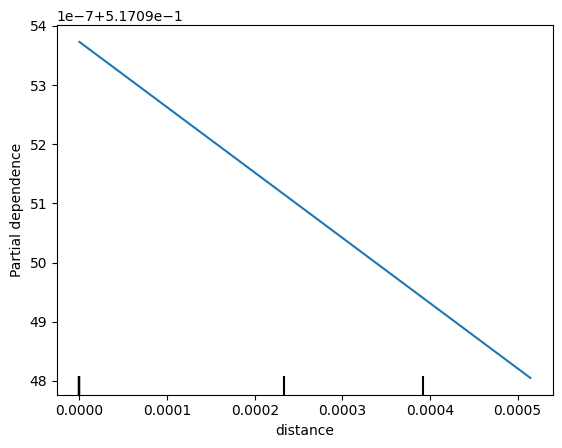

In [109]:
callerNB(adasyn_w_triggers_train,adasyn_w_triggers_test)


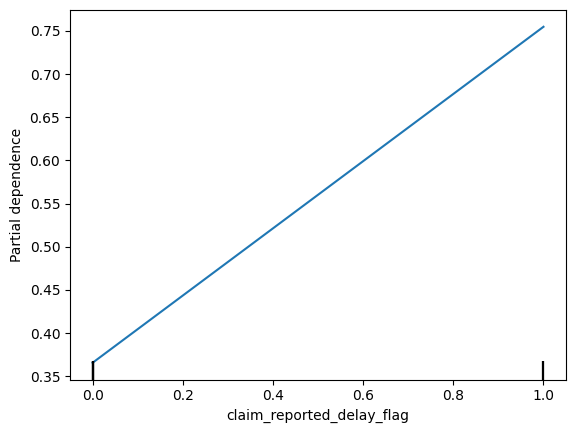

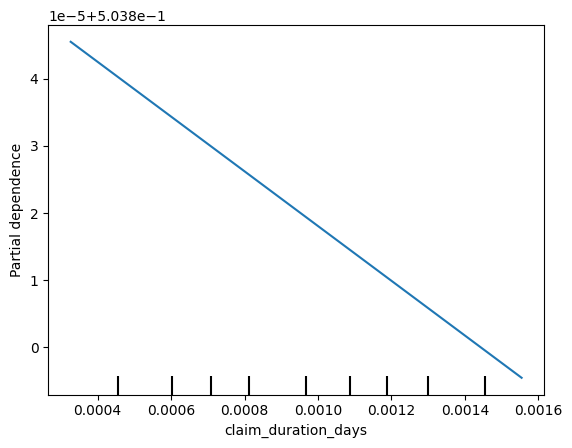

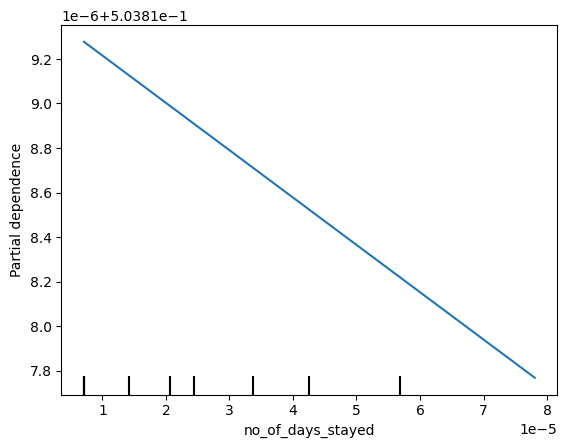

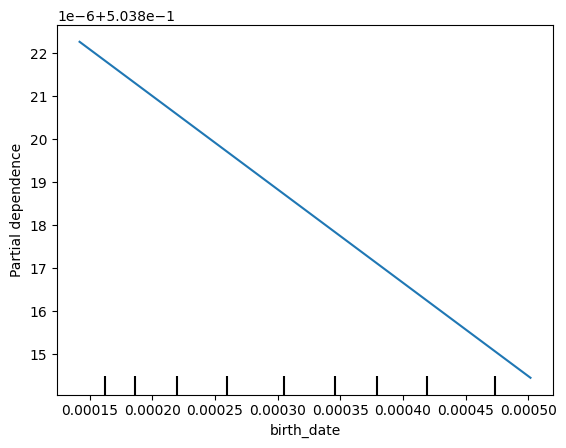

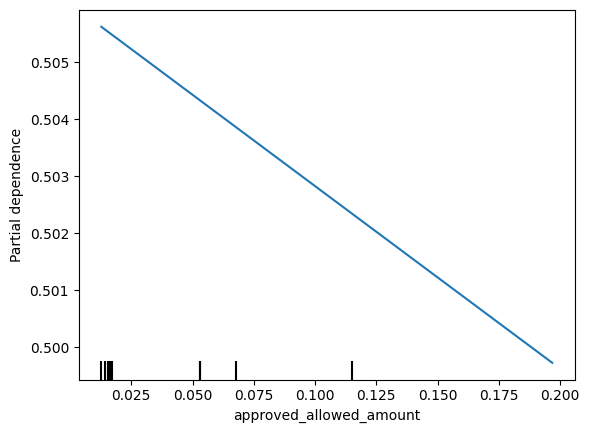

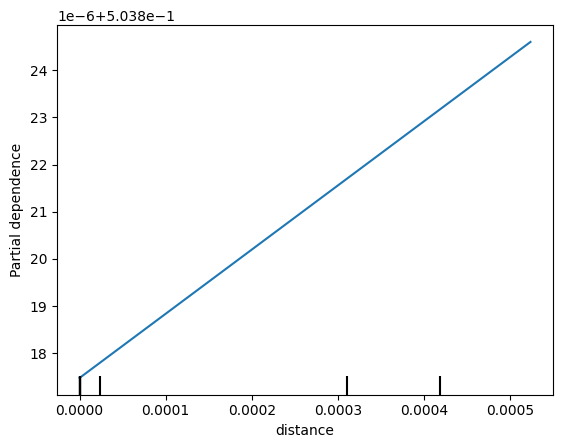

In [110]:
callerNB(mwmote_w_triggers_train,mwmote_w_triggers_test)

## XG - BOOST


In [111]:
import xgboost as xgb

In [127]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import precision_score, recall_score, f1_score
def get_xgb(train_data, test_data):
  from sklearn.metrics import confusion_matrix

  X_train = train_data.drop("fraud", axis= 1)
  y_train = train_data["fraud"]
  X_test = test_data.drop("fraud", axis= 1)
  y_test = test_data["fraud"]

  xgb_model = xgb.XGBClassifier()


  xgb_model.fit(X_train, y_train)

  y_pred = xgb_model.predict(X_test)

  conf_matrix = confusion_matrix(y_test, y_pred)
  # Calculate accuracy
  accuracy = accuracy_score(y_test, y_pred)

  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)

  print(f"Accuracy: {accuracy:.2f}")
  print(f"Precision: {precision:.2f}")
  print(f"Recall: {recall:.2f}")
  print(f"F1 Score: {f1:.2f}")


  conf_matrix = confusion_matrix(y_test, y_pred)

  print(conf_matrix)

  return xgb_model

In [113]:
get_xgb(adasyn_w_triggers_train,adasyn_w_triggers_test)

Accuracy: 0.94
Precision: 0.97
Recall: 0.90
F1 Score: 0.94
[[30896   908]
 [ 3037 28656]]


In [128]:
def callerXGB(datatrain ,datatest):
    mainmodel=get_xgb(datatrain,datatest)
    # feature_importances = mainmodel.feature_importances_
    # sorted_indices = feature_importances.argsort()[::-1]
    # top_feature_indices = sorted_indices[:5]
    # top_features = datatrain.columns[top_feature_indices]
    # print("Top 5 features:", top_features)
    top_features=['claim_reported_delay_flag', 'claim_duration_days', 'no_of_days_stayed',
       'birth_date', 'approved_allowed_amount','distance']
    main_data=datatrain.drop('fraud',axis=1)                       ## change the data
    # color=['red','green']
    for i in top_features:
        PartialDependenceDisplay.from_estimator(mainmodel,
                                                main_data,
                                                [i],
                                                kind='both',
                                                percentiles = (0,1),
                                                ice_lines_kw={"color": "blue"},
                                                pd_line_kw={"color":'red',"lw":2,'linestyle':'-'},
                                                centered= True
                                                )

Accuracy: 0.94
Precision: 0.97
Recall: 0.90
F1 Score: 0.94
[[30896   908]
 [ 3037 28656]]


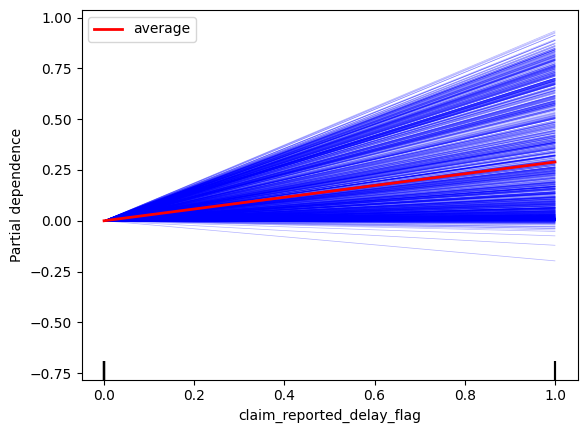

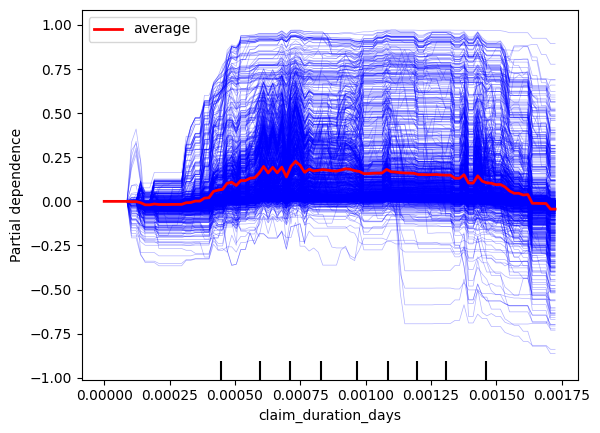

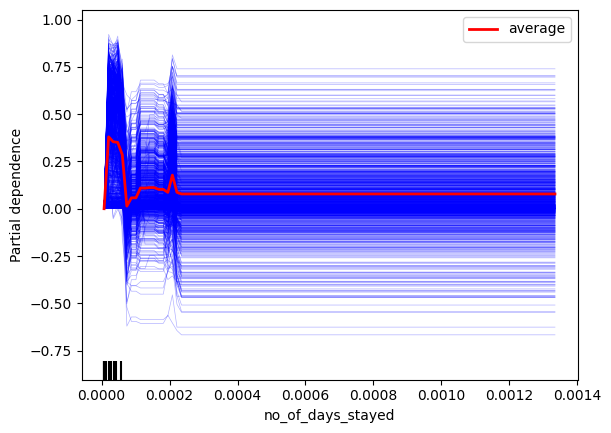

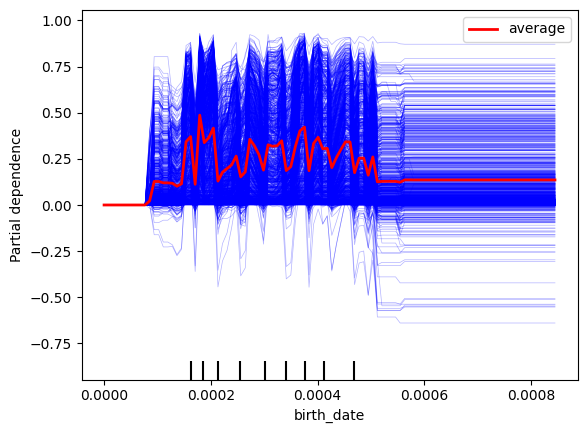

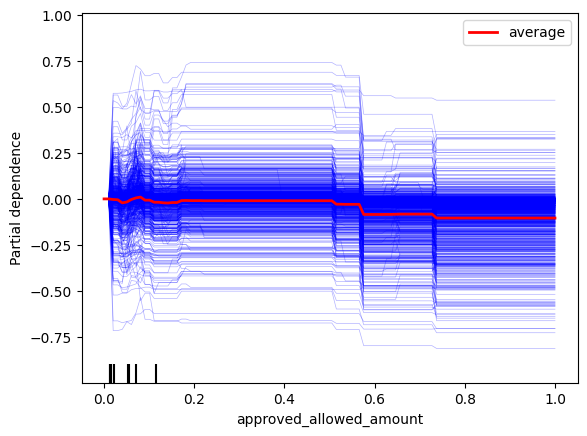

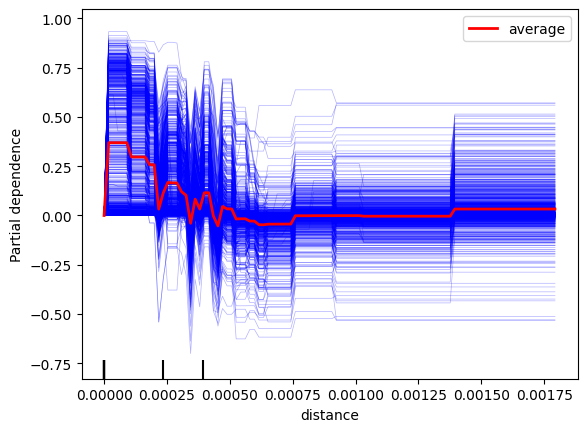

In [129]:
callerXGB(adasyn_w_triggers_train,adasyn_w_triggers_test)

Accuracy: 0.95
Precision: 0.97
Recall: 0.92
F1 Score: 0.94
[[31080   724]
 [ 2337 25984]]


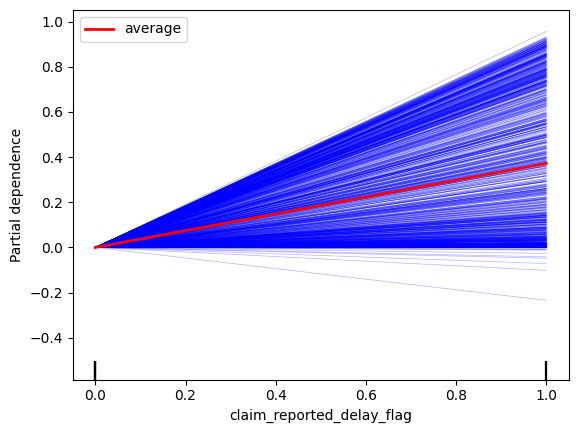

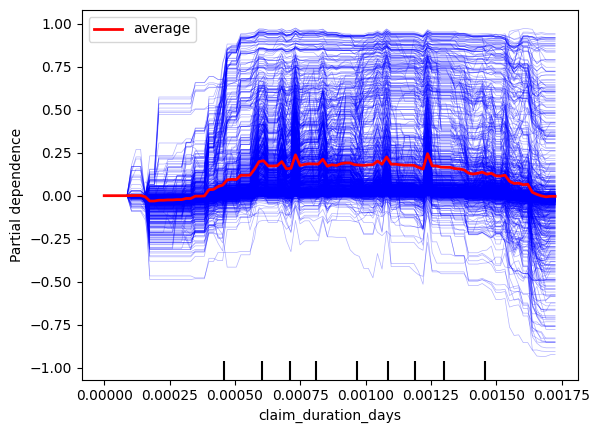

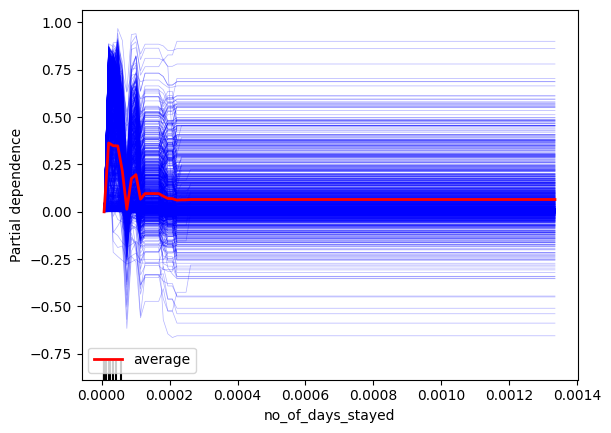

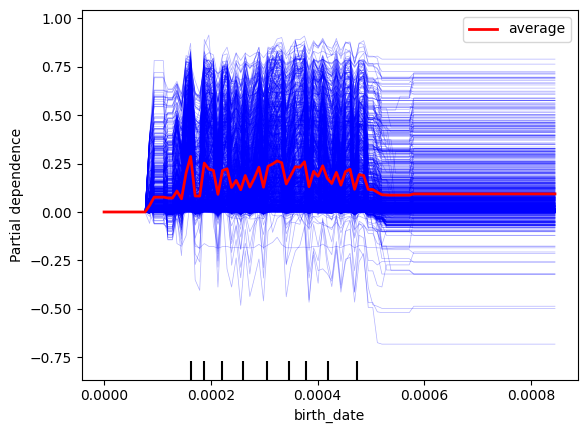

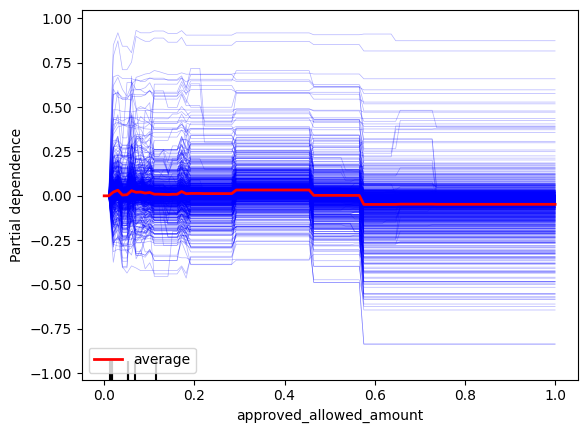

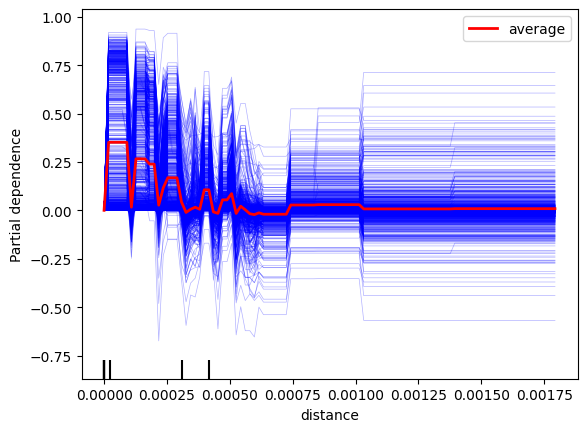

In [130]:
callerXGB(mwmote_w_triggers_train,mwmote_w_triggers_test)

Accuracy: 0.95
Precision: 0.96
Recall: 0.90
F1 Score: 0.93
[[31210   594]
 [ 1879 16245]]


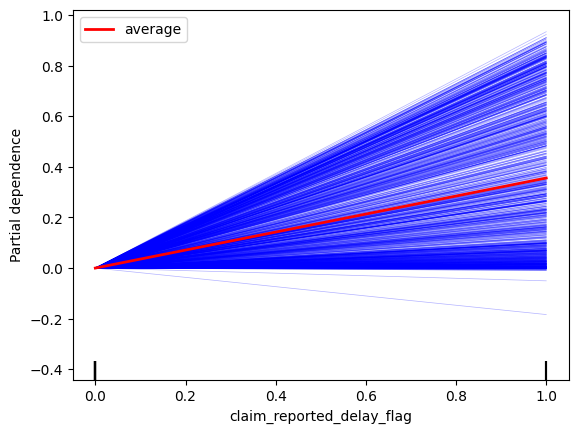

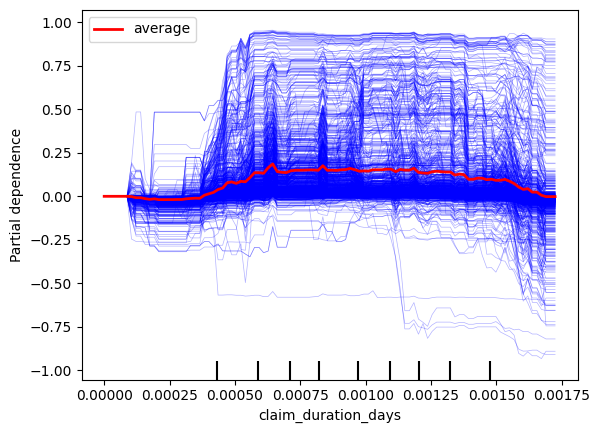

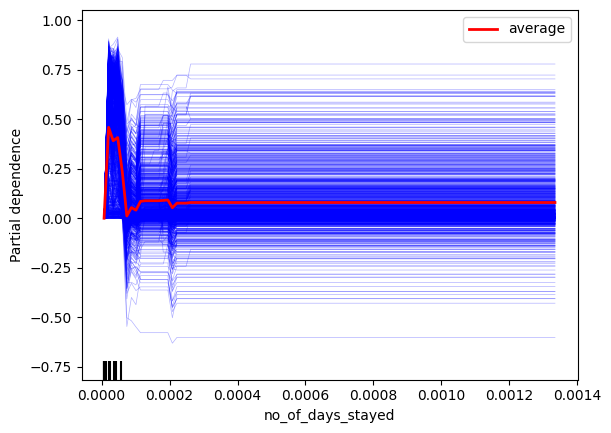

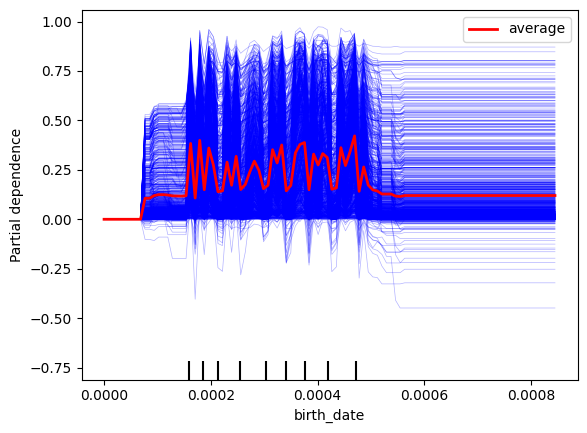

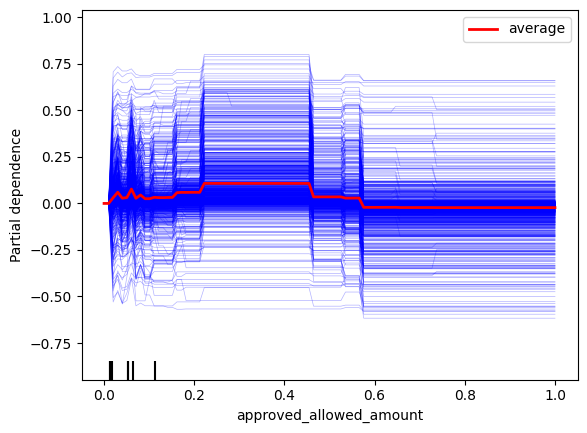

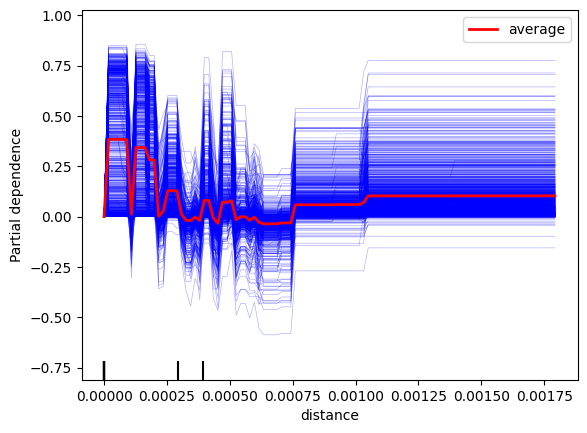

In [131]:
callerXGB(smote_w_triggers_train,smote_w_triggers_test)

Accuracy: 0.82
Precision: 0.92
Recall: 0.70
F1 Score: 0.80
[[29839  1965]
 [ 9506 22298]]


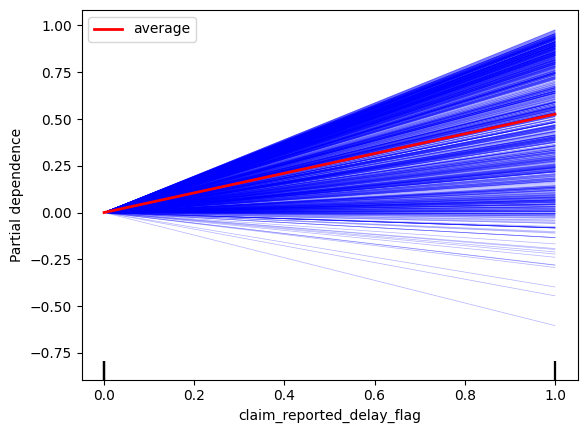

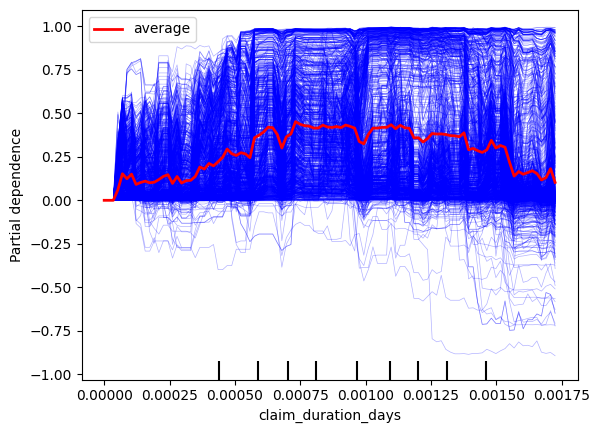

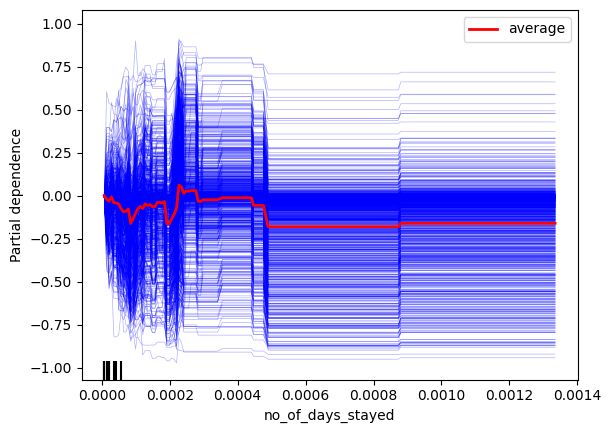

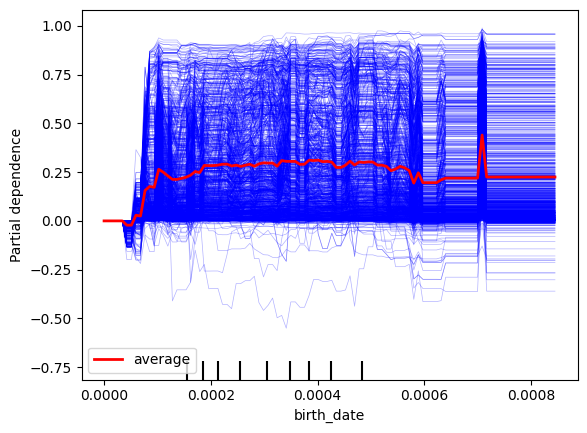

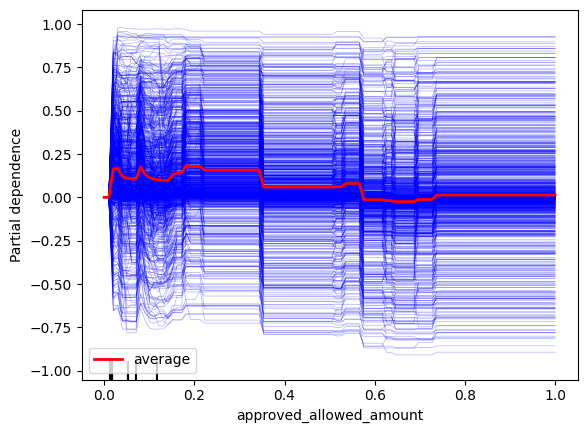

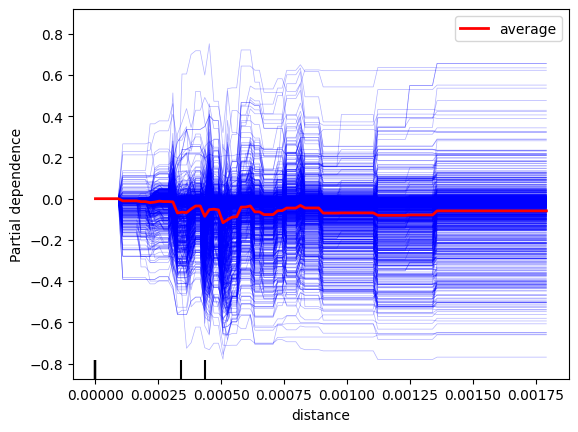

In [132]:
callerXGB(rose_w_triggers_train,rose_w_triggers_test)

Accuracy: 0.94
Precision: 0.97
Recall: 0.90
F1 Score: 0.94
[[30896   908]
 [ 3037 28656]]


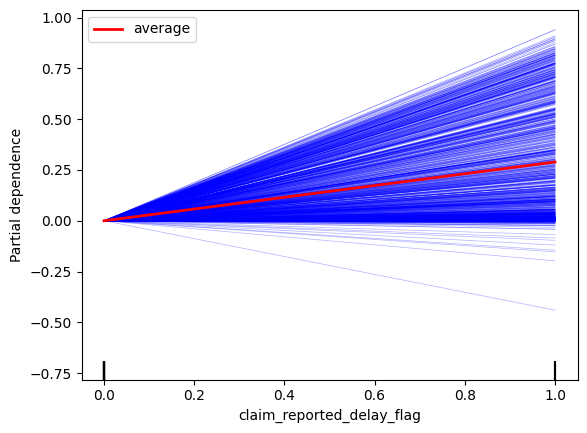

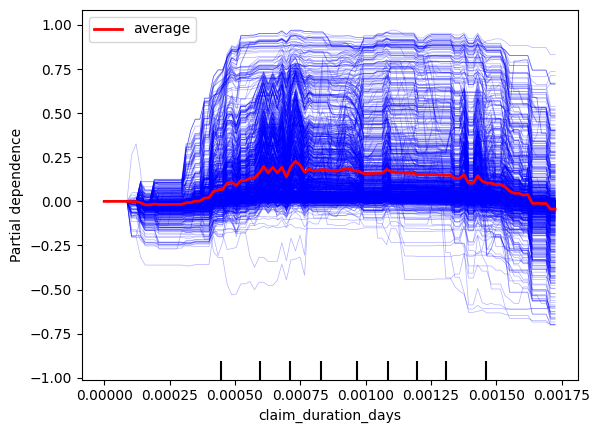

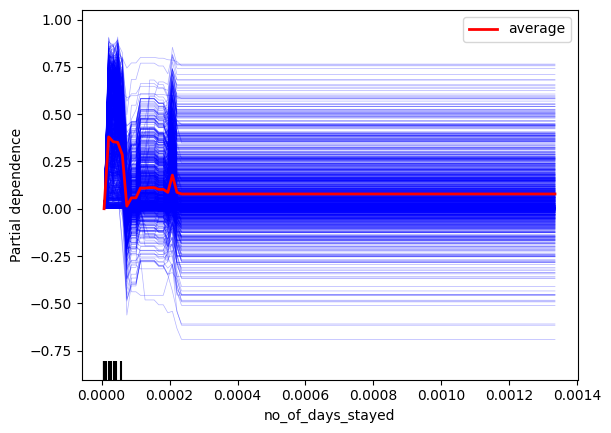

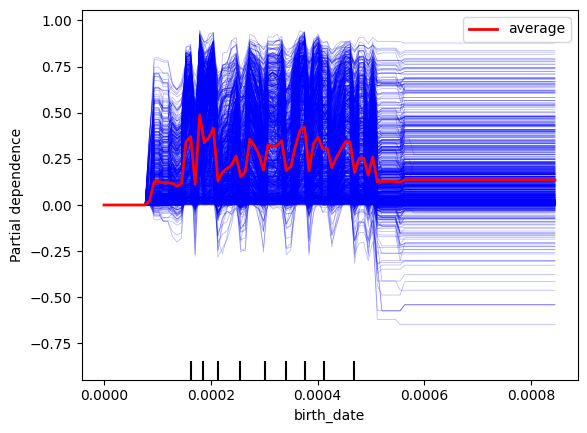

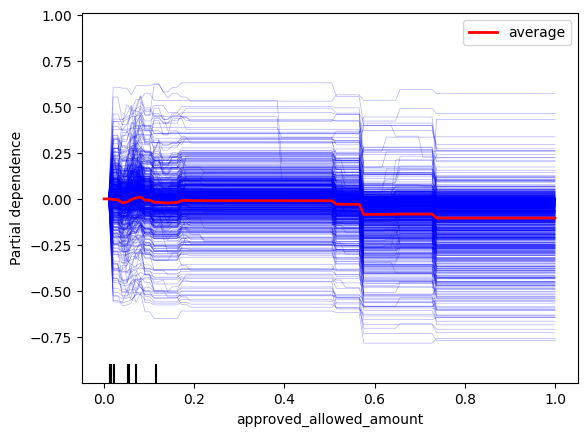

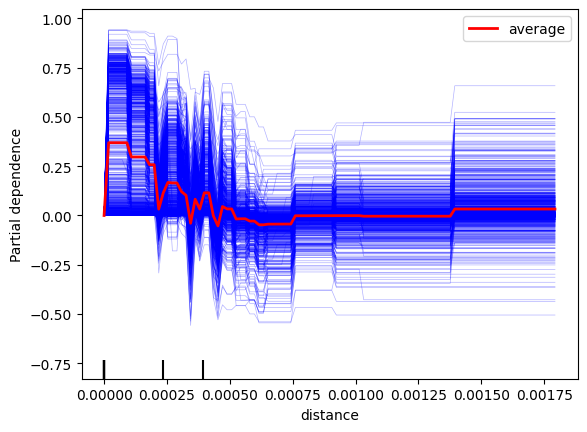

In [133]:
callerXGB(adasyn_w_triggers_train,adasyn_w_triggers_test)

Accuracy: 0.98
Precision: 0.65
Recall: 0.39
F1 Score: 0.49
[[31606   198]
 [  583   371]]


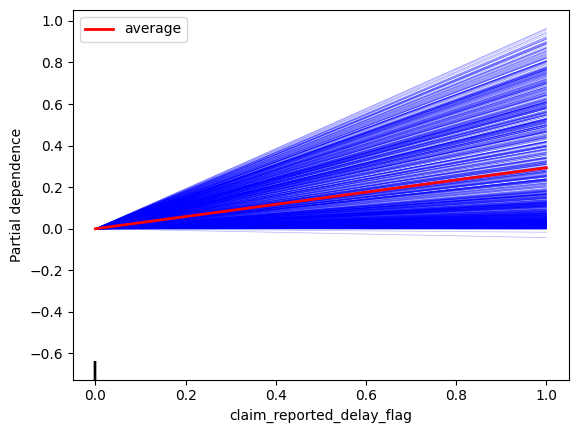

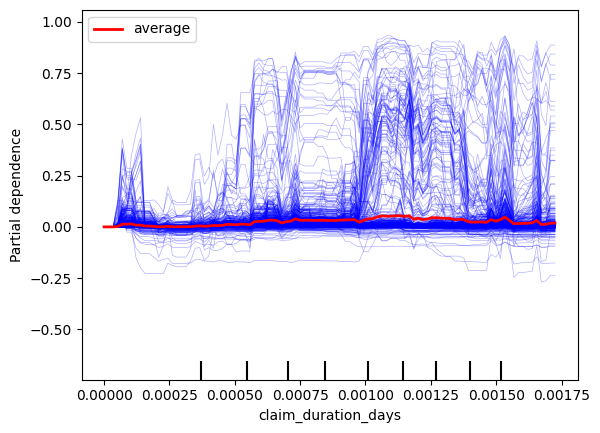

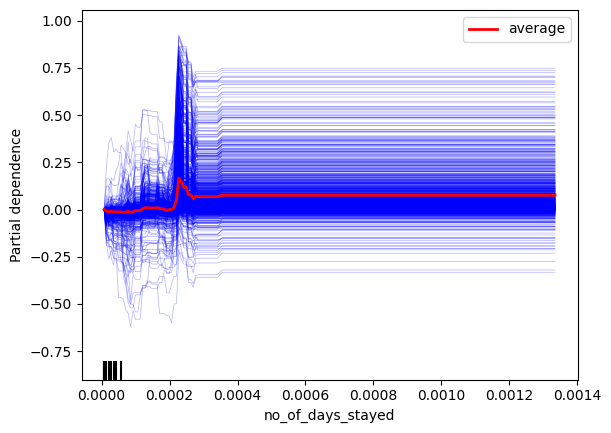

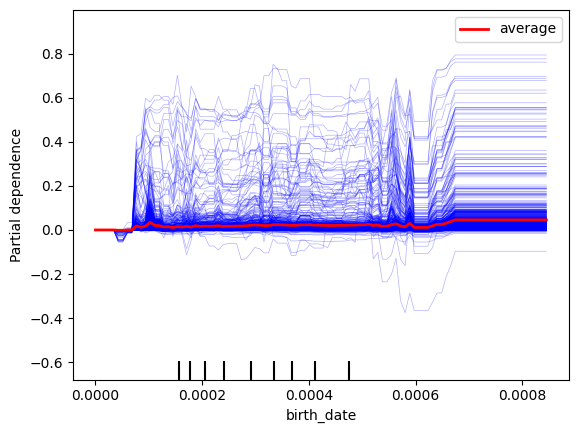

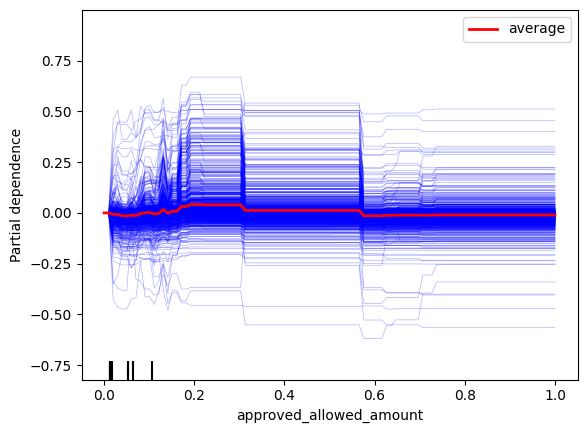

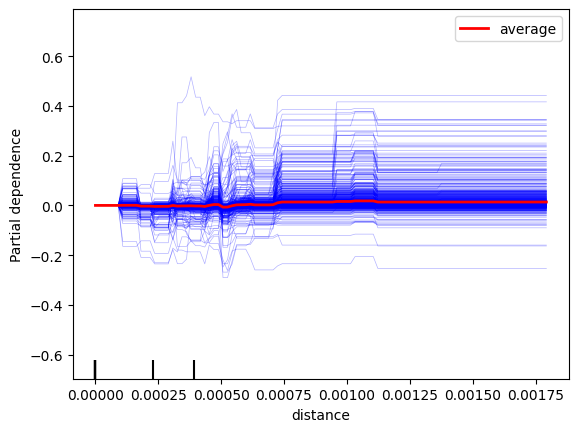

In [134]:
callerXGB(data_w_triggers_train,data_w_triggers_test)